# Classifying Electroencephalogram (EEG) seizure types from signals

## Import the required libraries

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import random
from tabulate import tabulate
from scipy.fft import fft, fftfreq
from scipy.signal import spectrogram
from scipy.stats import entropy
import pywt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.datasets import load_iris
from sklearn.metrics import classification_report, roc_auc_score, balanced_accuracy_score
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import label_binarize

## Implementing Basic Analysis of EEG Signals

### import dataset

In [5]:
# Folder paths for each data set i.e for training, validation, noisy_data training
dataset_folders = {
    'train_data': '/content/drive/MyDrive/EEG_Data/train_data/',
    'validation_data': '/content/drive/MyDrive/EEG_Data/validation_data/',
    'noisy_train_data': '/content/drive/MyDrive/EEG_Data/noisy_train_data/',
}

# different seizure class names
class_names = ['Normal','Complex_Partial_Seizures', 'Electrographic_Seizures', 'Video_detected_Seizures_with_no_visual_change_over_EEG' ]

# Loading the data according to dataset folders and class names
eeg_data = {}
for folder_name, folder_path in dataset_folders.items():
    eeg_data[folder_name] = {}
    for class_name in class_names:
        class_folder = os.path.join(folder_path, class_name)
        files = [f for f in os.listdir(class_folder) if f.endswith('.npy')]
        eeg_data[folder_name][class_name] = [np.load(os.path.join(class_folder, file)) for file in files]
        print(eeg_data[folder_name][class_name])
# import the testing dataset
files = [f for f in os.listdir('/content/drive/MyDrive/EEG_Data/test_data/') if f.endswith('.npy')]
test_data = [np.load(os.path.join('/content/drive/MyDrive/EEG_Data/test_data/', file)) for file in files]
print('test')
print(test_data)

Streaming output truncated to the last 5000 lines.
        -5.18099190e-04, -4.87581591e-04, -4.57063991e-04],
       ...,
       [ 4.42575193e-03,  4.51730473e-03,  4.60885752e-03, ...,
        -1.51887996e-04, -3.65511193e-04, -4.87581591e-04],
       [ 5.73800870e-03,  5.70749111e-03,  5.76852630e-03, ...,
         3.51022394e-03,  3.51022394e-03,  3.51022394e-03],
       [ 6.04318470e-03,  5.98214950e-03,  5.92111430e-03, ...,
         2.13693197e-03,  1.98434397e-03,  1.89279117e-03]]), array([[-0.02761773, -0.02786187, -0.02795342, ...,  0.03360058,
         0.03564526,  0.03741528],
       [-0.00189139, -0.00237967, -0.00271537, ..., -0.01599052,
        -0.01528862, -0.01480034],
       [-0.01739433, -0.01782158, -0.01834038, ...,  0.01449656,
         0.01547312,  0.01635813],
       ...,
       [ 0.00674509,  0.00708078,  0.00738596, ..., -0.03634576,
        -0.03695611, -0.03765802],
       [ 0.01178049,  0.01208567,  0.01245188, ..., -0.03427056,
        -0.03552179, -0.03

### Visulazing EEG signals of different classes of training data through different channels

Normal data point from train_data (Random Sample Index: 320)...


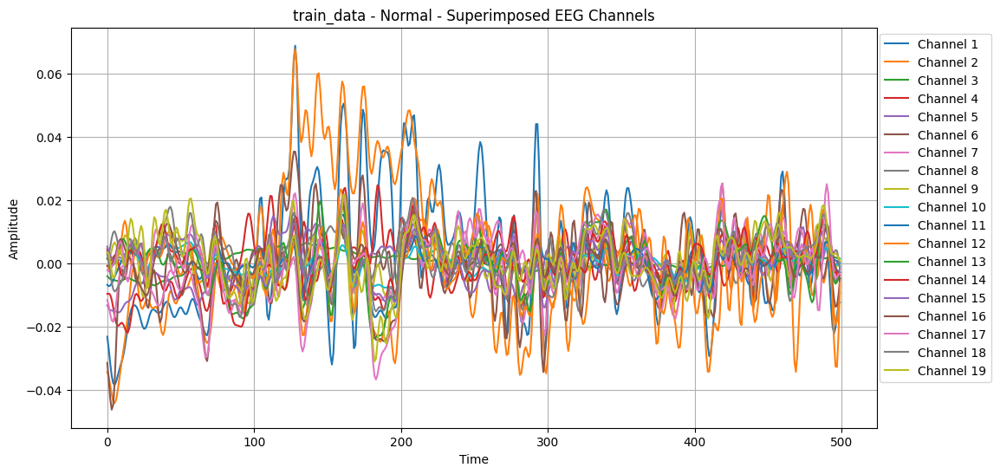

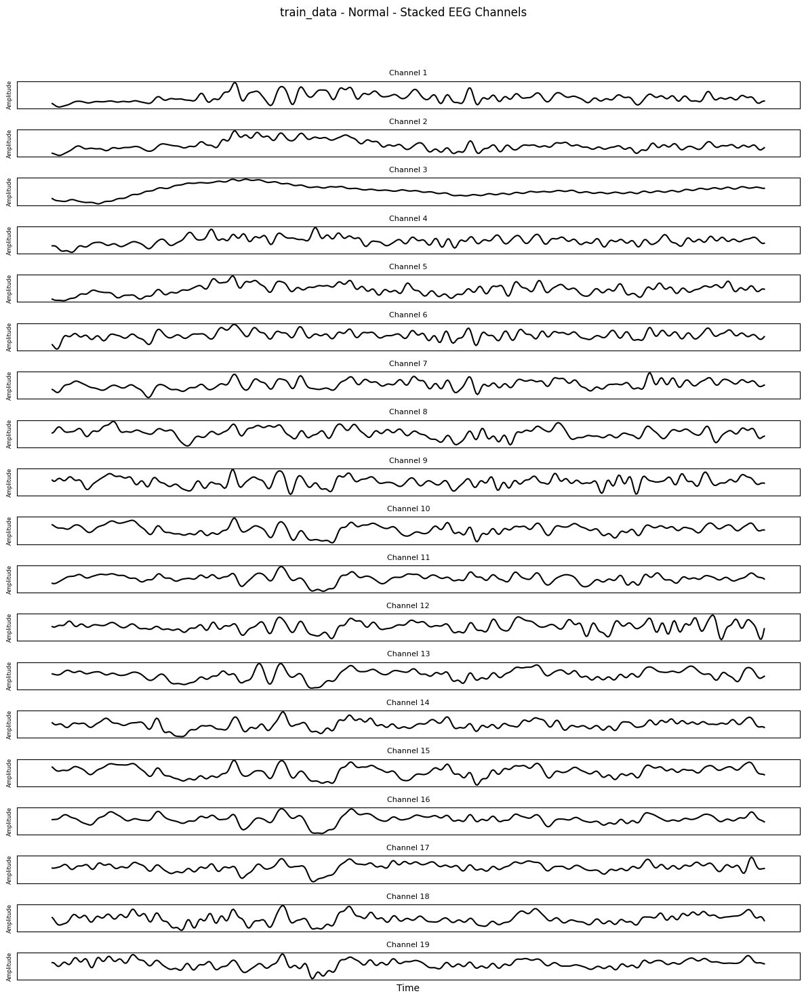

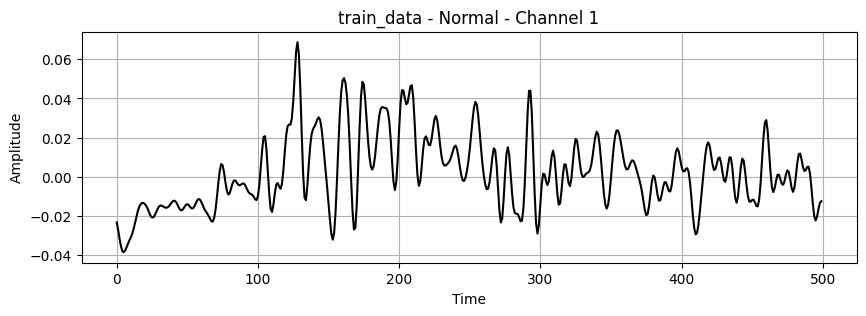

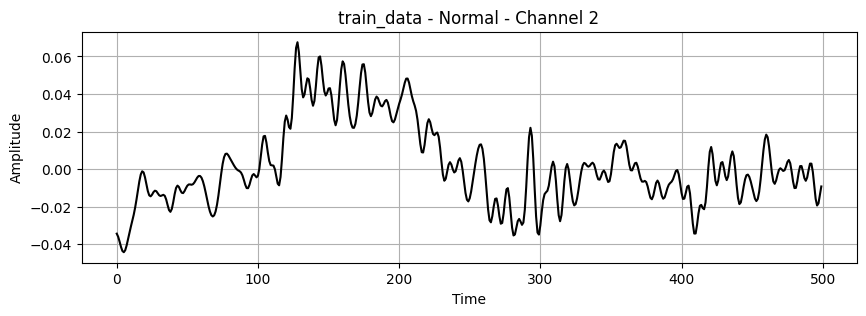

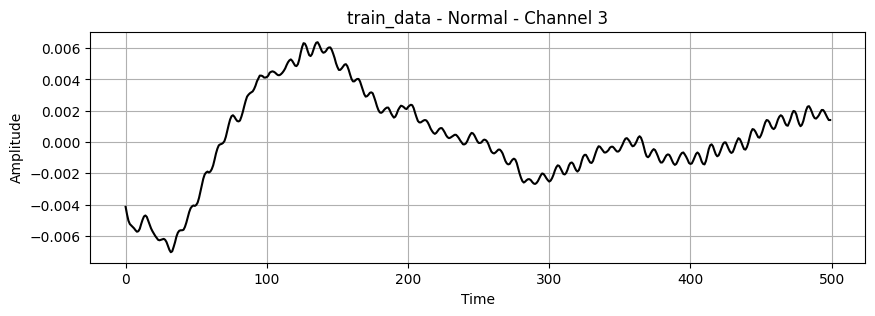

...

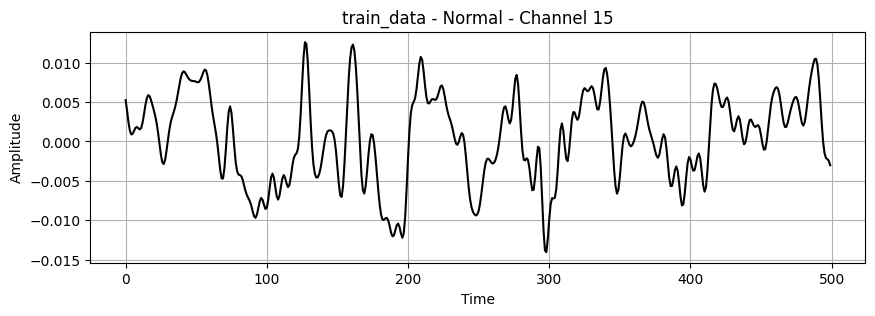

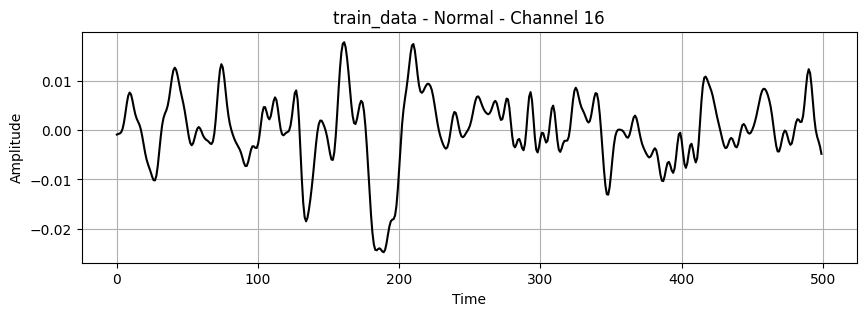

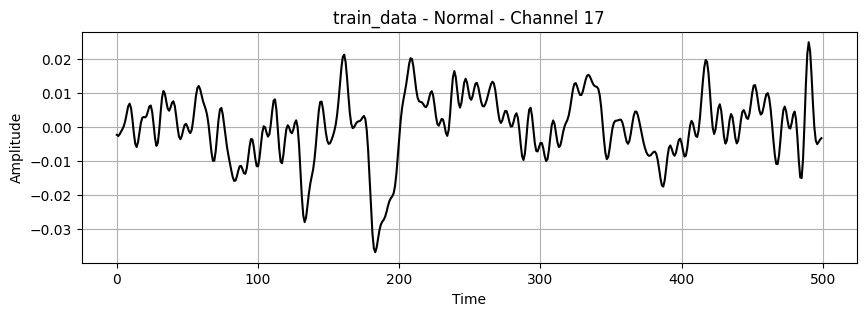

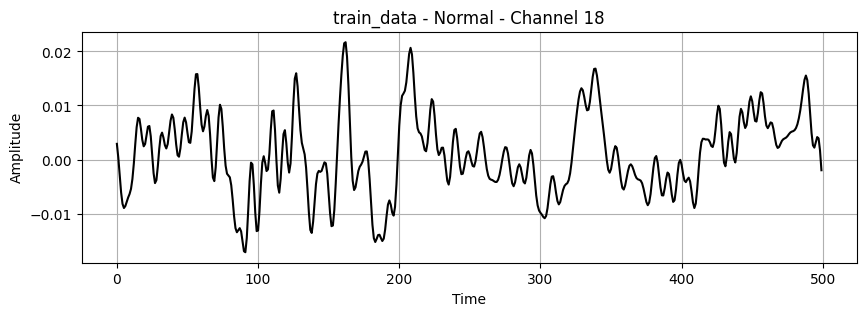

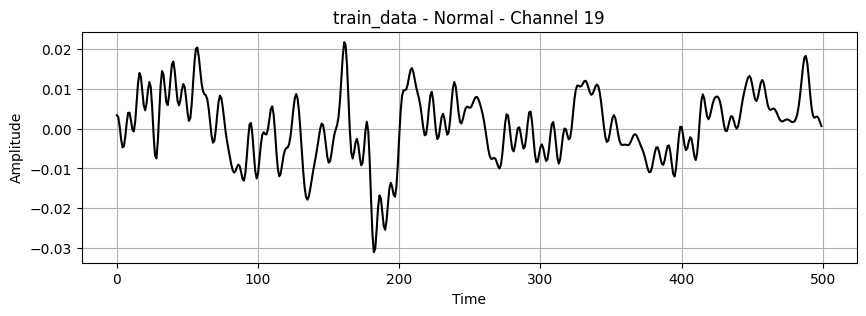







Complex_Partial_Seizures data point from train_data (Random Sample Index: 487)...


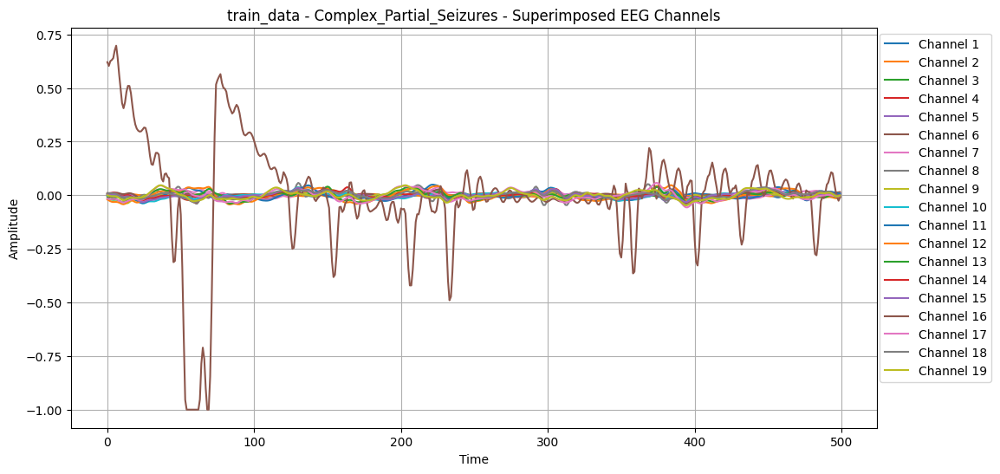

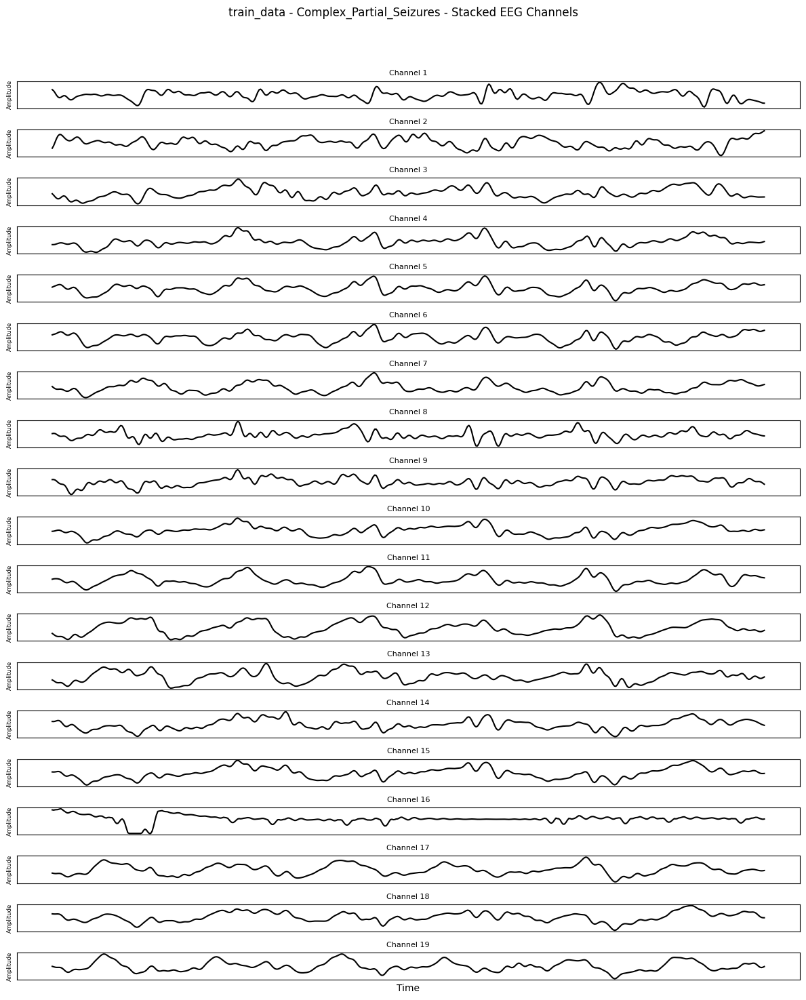

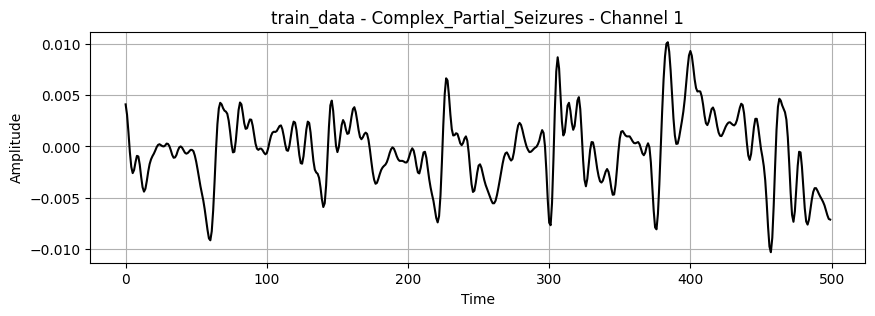

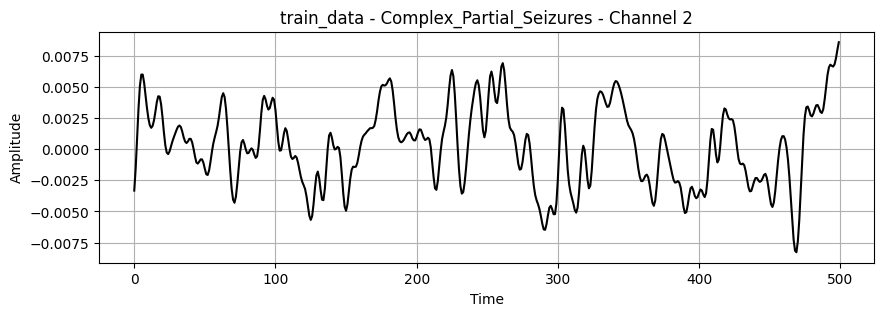

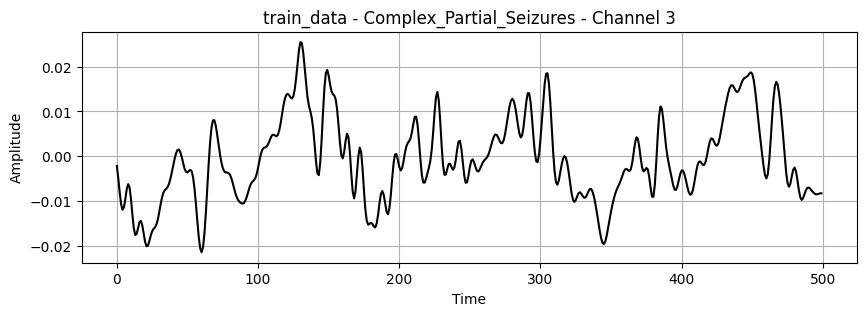

...

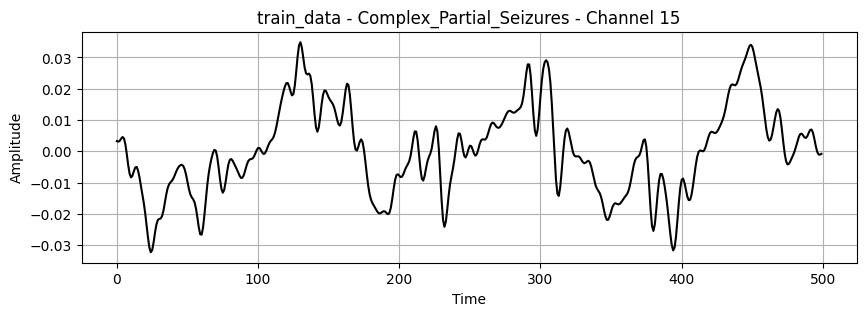

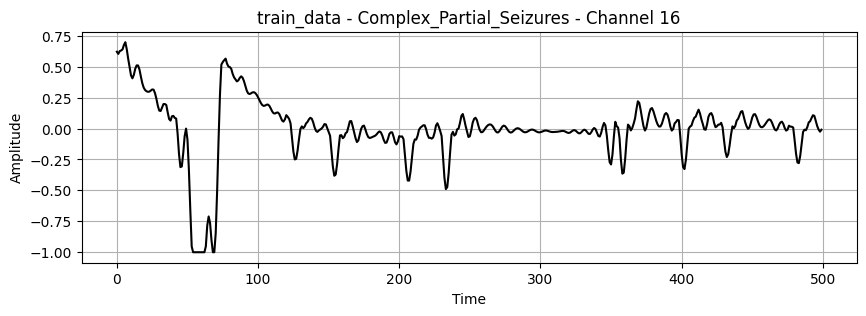

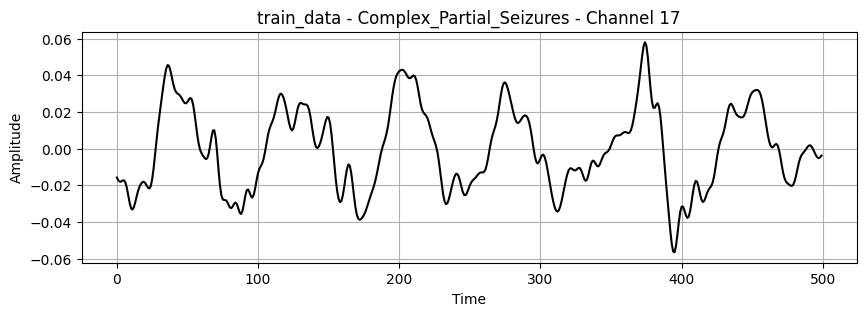

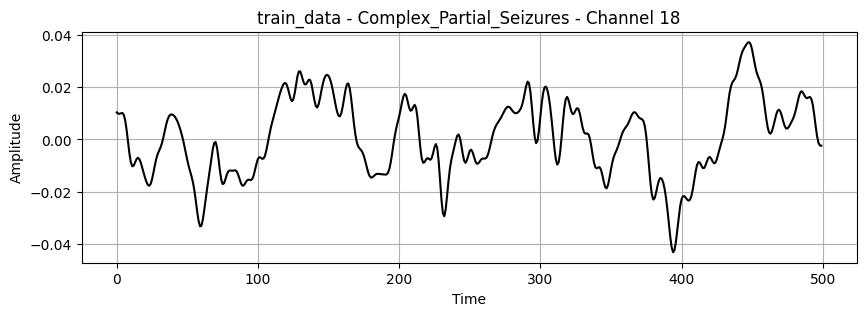

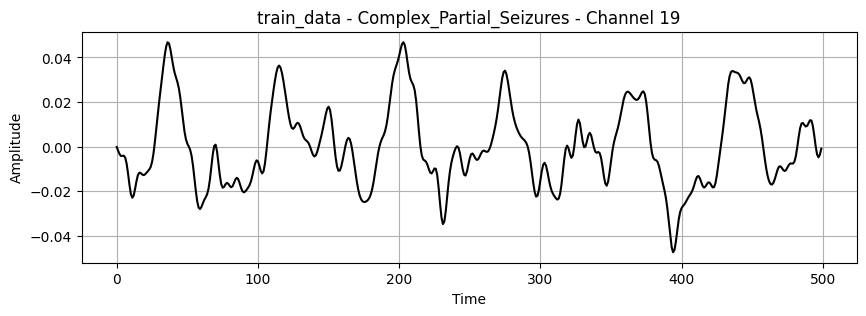







Electrographic_Seizures data point from train_data (Random Sample Index: 482)...


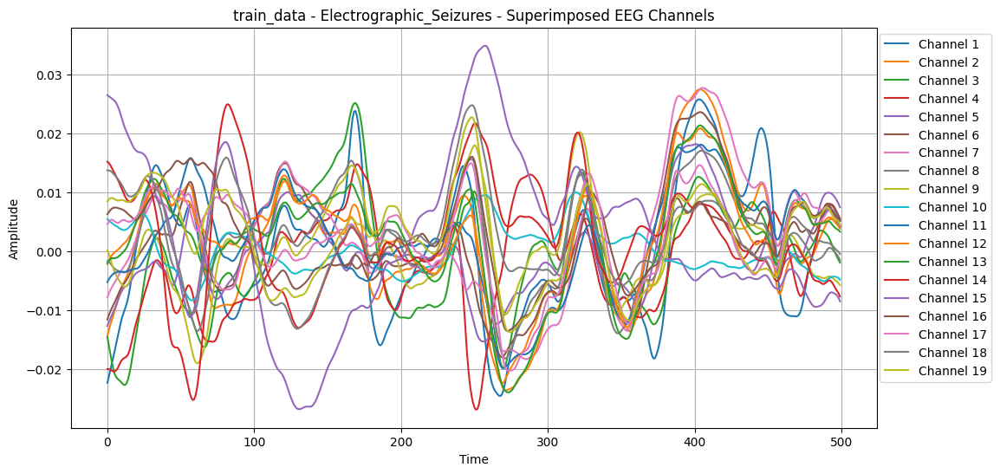

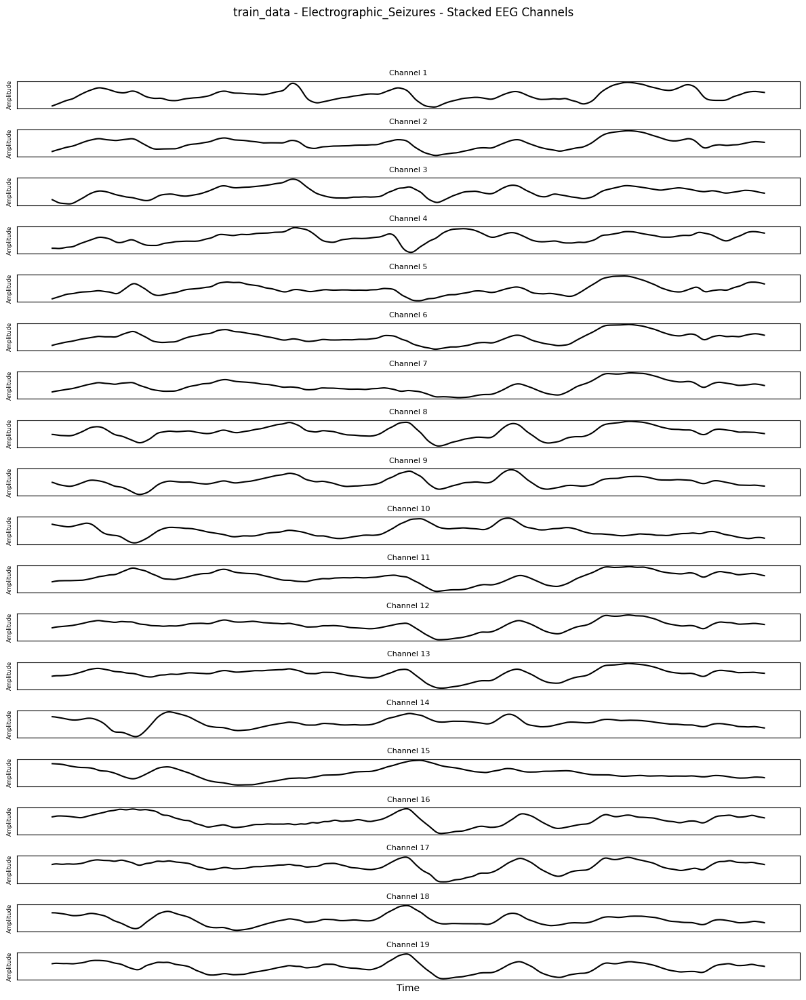

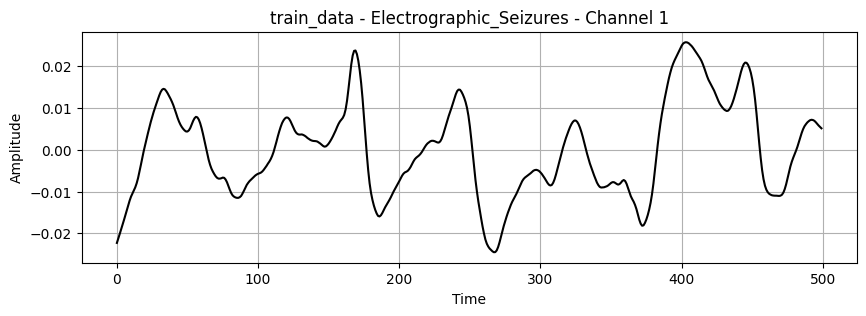

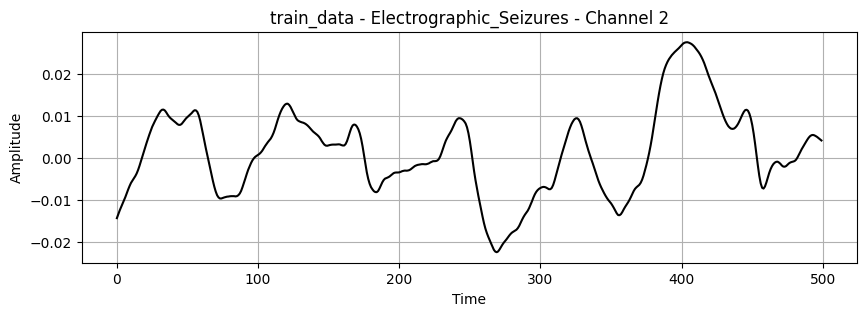

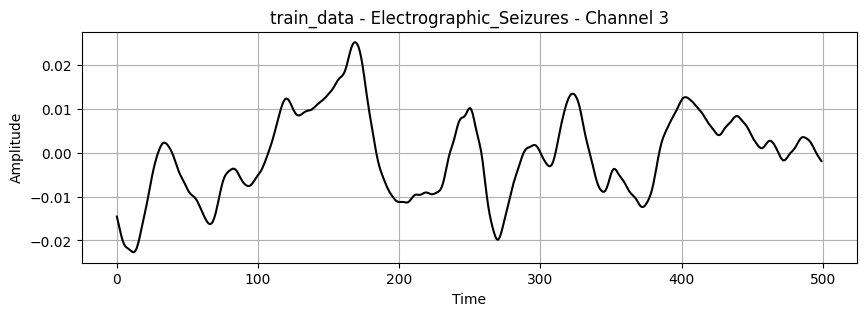

...

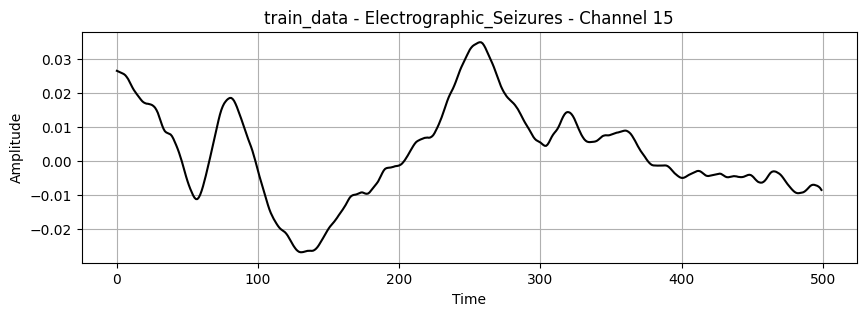

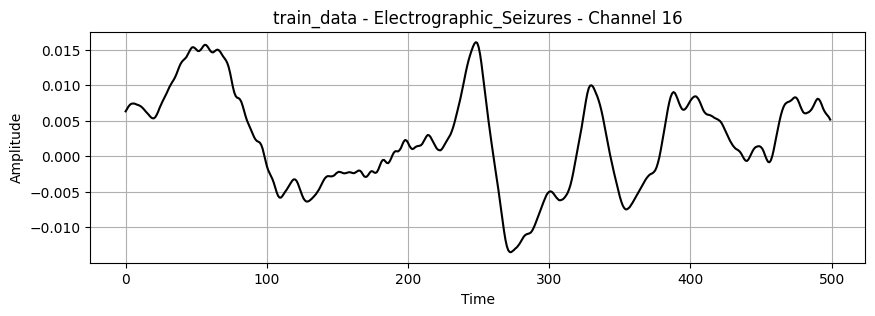

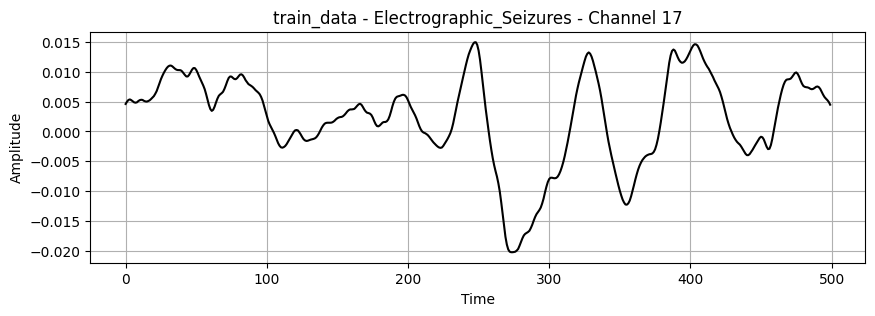

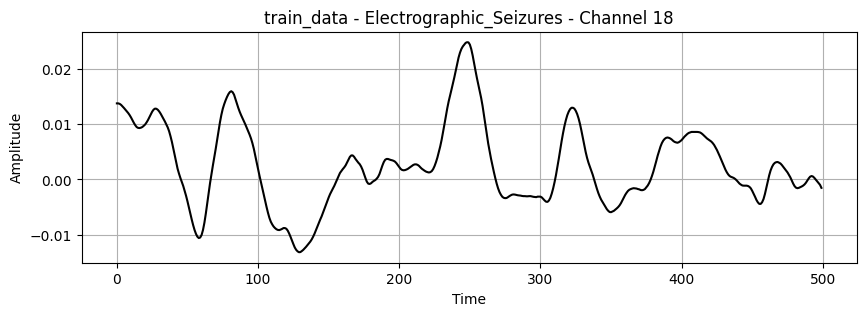

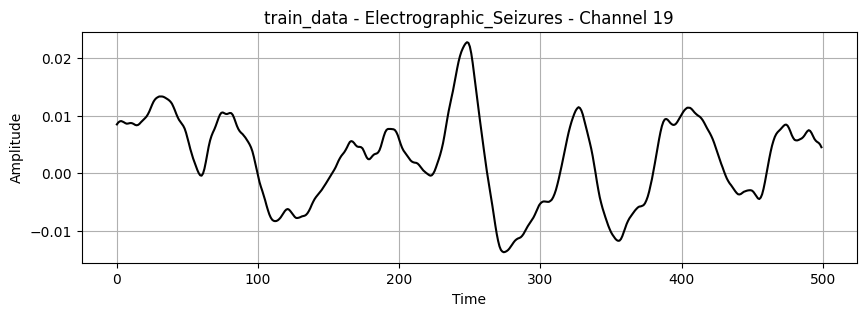







Video_detected_Seizures_with_no_visual_change_over_EEG data point from train_data (Random Sample Index: 31)...


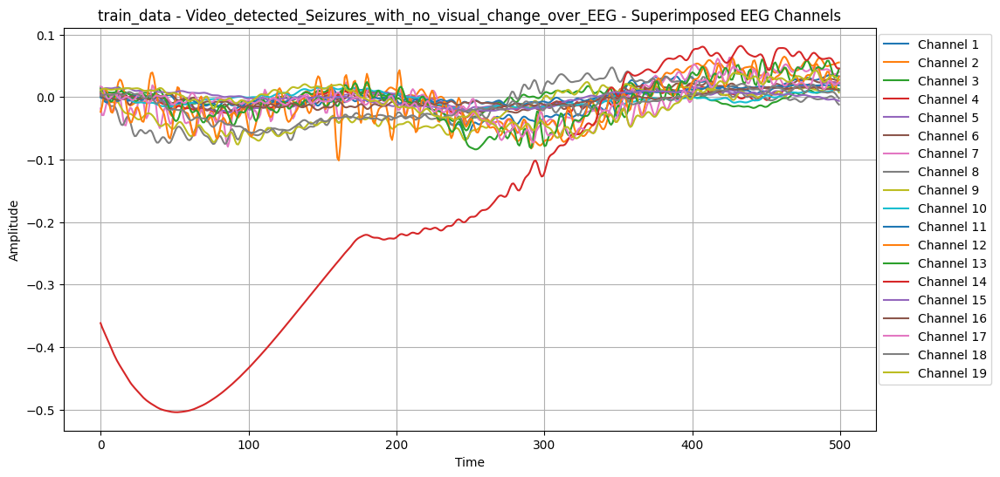

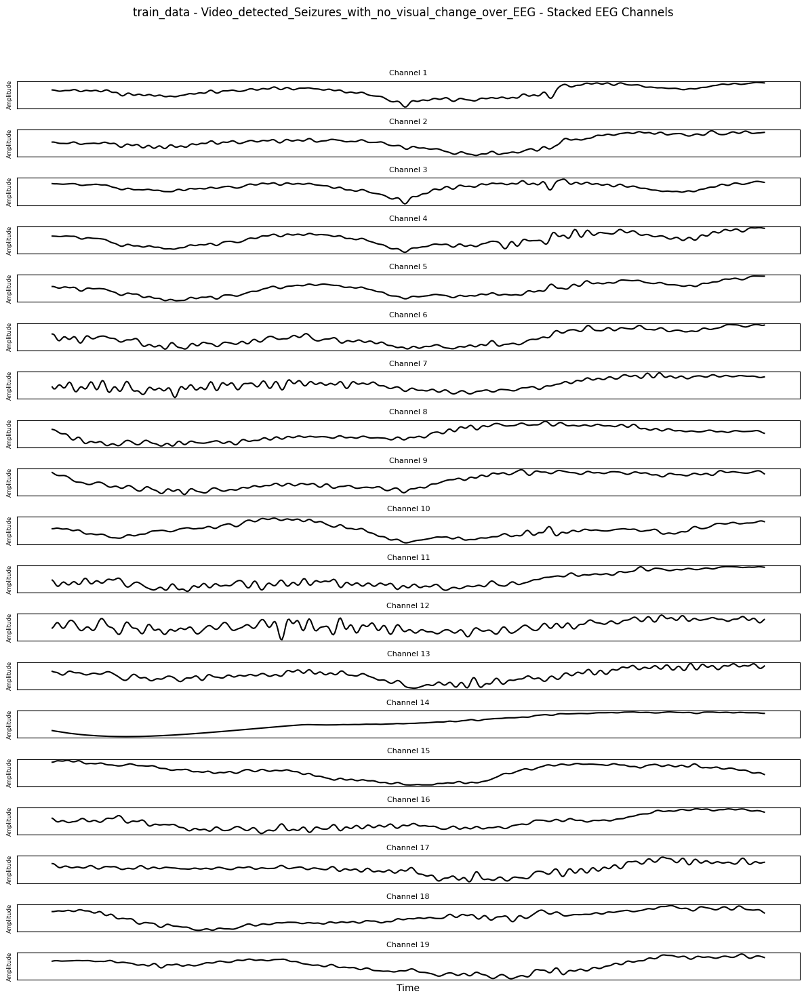

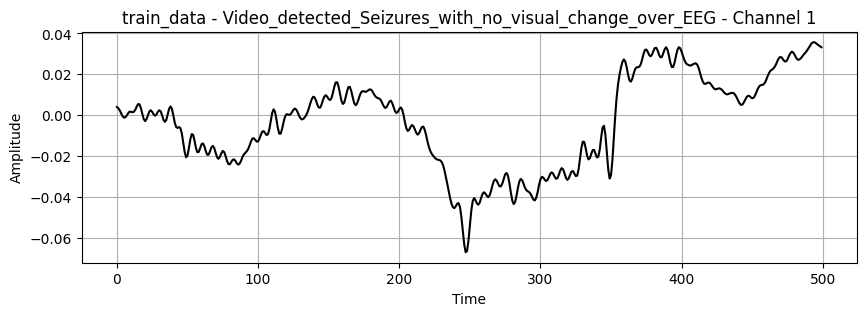

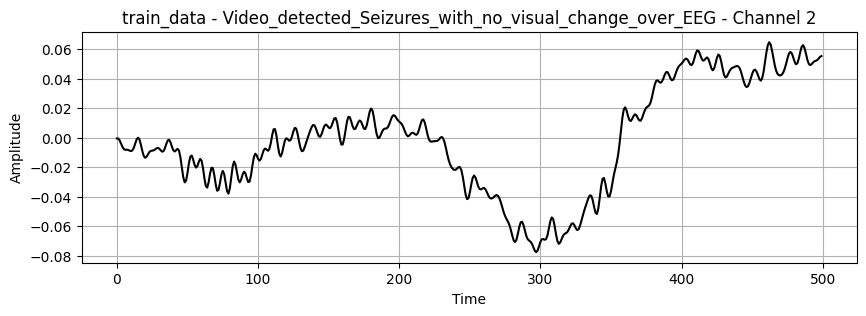

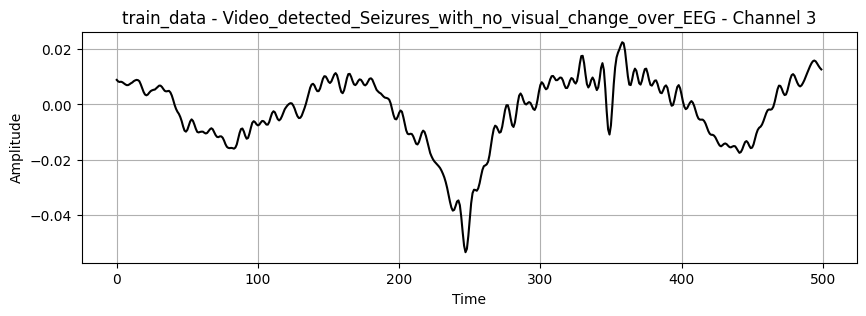

...

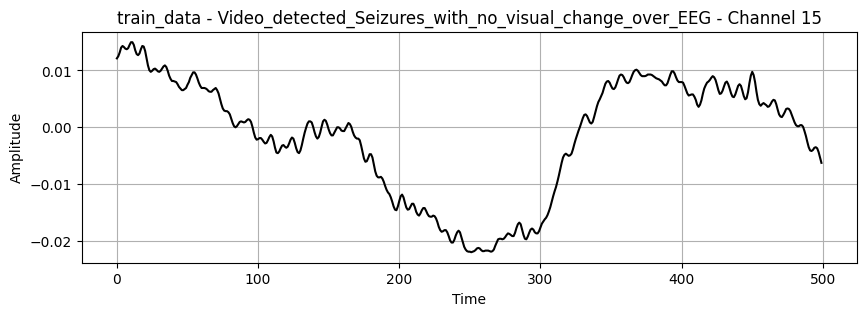

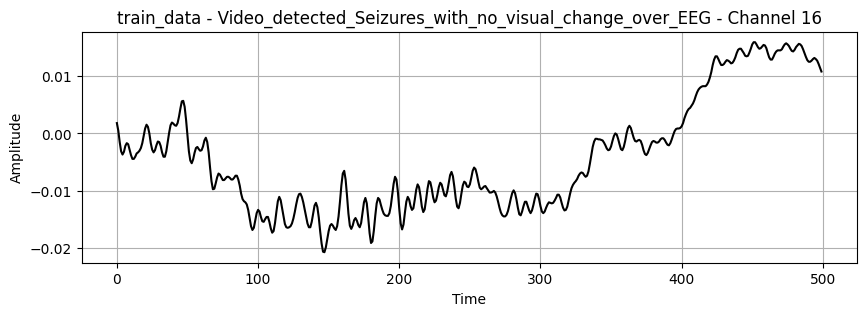

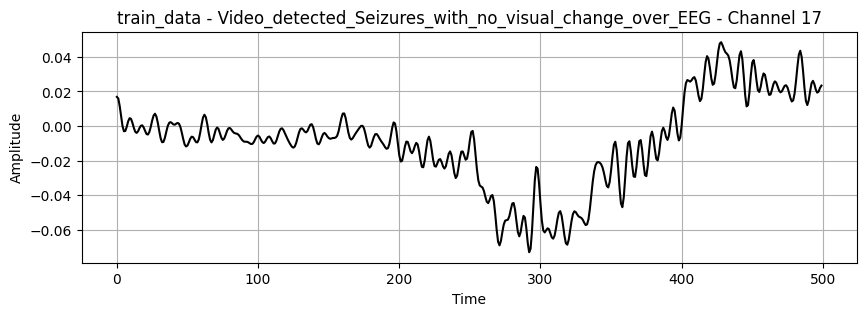

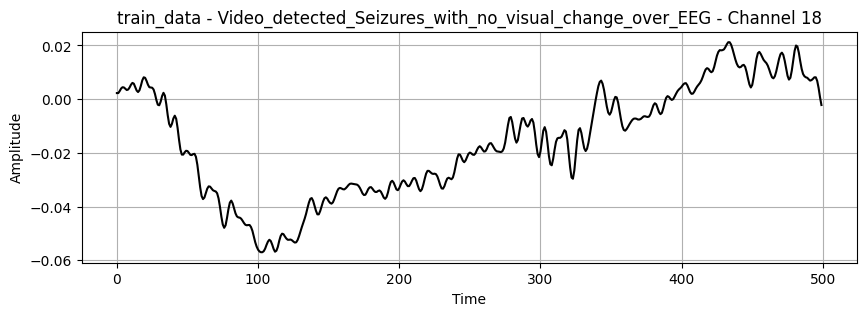

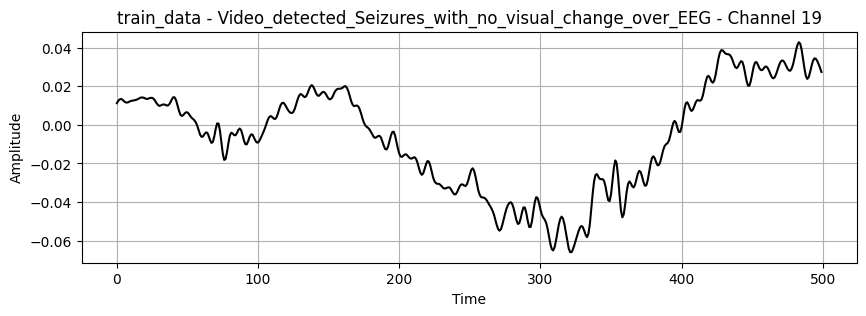

In [6]:
# Note: I have made functions to plot graph from a randomly selected data point rather than sticking to a fixed data point, so that we can understand
#       the overall behaviour of signals of different class and channels in a better way
# Function to plot each channel individually
random_indexes = []
def plot_eeg_individual(data, class_name, folder_name):
    for channel in range(data.shape[0]):
        plt.figure(figsize=(10, 3))
        plt.plot(data[channel], color='black')
        plt.title(f'{folder_name} - {class_name} - Channel {channel + 1}')
        plt.xlabel('Time')
        plt.ylabel('Amplitude')
        plt.grid(True)
        plt.show()

# Function to plot all channels superimposed
def plot_eeg_superimposed(data, class_name, folder_name):
    plt.figure(figsize=(12, 6))
    for channel in range(data.shape[0]):
        plt.plot(data[channel], label=f'Channel {channel + 1}')
    plt.title(f'{folder_name} - {class_name} - Superimposed EEG Channels')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
    plt.grid(True)
    plt.show()

# Function to plot channels in a stacked layout
def plot_eeg_stacked(data, class_name, folder_name):
    plt.figure(figsize=(12, 15))
    num_channels = data.shape[0]
    for channel in range(num_channels):
        plt.subplot(num_channels, 1, channel + 1)
        plt.plot(data[channel], color='black')
        plt.title(f'Channel {channel + 1}', fontsize=8)
        plt.xticks([])
        plt.yticks([])
        if channel == num_channels - 1:
            plt.xlabel('Time')
        plt.ylabel('Amplitude', fontsize=6)
    plt.suptitle(f'{folder_name} - {class_name} - Stacked EEG Channels', fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Randomly selecting a data point and plotting
def plot_eeg_data_random(data, class_name, folder_name):
    random_index = random.randint(0, len(data) - 1)
    random_indexes.append(random_index)
    random_data_point = data[random_index]
    print(f"{class_name} data point from {folder_name} (Random Sample Index: {random_index})...")
    plot_eeg_superimposed(random_data_point, class_name, folder_name)
    plot_eeg_stacked(random_data_point, class_name, folder_name)
    plot_eeg_individual(random_data_point, class_name, folder_name)
    print(("\n") * 5)

# Iterating over classes and plot
for class_name in class_names:
    plot_eeg_data_random(eeg_data['train_data'][class_name], class_name, 'train_data')


### Computing basic statistical time domain metrics from each channel

In [7]:
# Function to compute time-domain metrics
def computeTimeDomainMetrics(data):
    metrics = {
        'Channel': [],
        'Mean': [],
        'Zero Crossing Rate': [],
        'Range': [],
        'Energy': [],
        'RMS': [],
        'Variance': []
    }

    for channel in range(data.shape[0]):
        signal = data[channel]

        # Computing metrics
        mean = np.mean(signal)
        zcross = ((signal[:-1] * signal[1:]) < 0).sum()
        value_range = np.max(signal) - np.min(signal)
        energy = np.sum(signal ** 2)
        rms = np.sqrt(np.mean(signal ** 2))
        variance = np.var(signal)

        metrics['Channel'].append(f'Channel {channel + 1}')
        metrics['Mean'].append(mean)
        metrics['Zero Crossing Rate'].append(zcross)
        metrics['Range'].append(value_range)
        metrics['Energy'].append(energy)
        metrics['RMS'].append(rms)
        metrics['Variance'].append(variance)

    # Converting metrics to DataFrame for easy readability
    metrics_df = pd.DataFrame(metrics)
    return metrics_df

# Processing a random data point from each class
i=0
for class_name in class_names:
    random_index = random_indexes[i]
    i+=1
    data_point = eeg_data['train_data'][class_name][random_index]
    print(f"Metrics for {class_name} (Random Sample Index: {random_index}):\n")

    # Getting the metrics DataFrame
    metrics_df = computeTimeDomainMetrics(data_point)

   # displaying the summary table of different metrics for each channel
    print(tabulate(metrics_df, headers='keys', tablefmt='fancy_grid', showindex=False))
    print("\n" + "="*50 + "\n")

Metrics for Normal (Random Sample Index: 320):

╒════════════╤══════════════╤══════════════════════╤═══════════╤════════════╤════════════╤═════════════╕
│ Channel    │         Mean │   Zero Crossing Rate │     Range │     Energy │        RMS │    Variance │
╞════════════╪══════════════╪══════════════════════╪═══════════╪════════════╪════════════╪═════════════╡
│ Channel 1  │  0.00222482  │                   54 │ 0.107208  │ 0.17586    │ 0.0187542  │ 0.000346771 │
├────────────┼──────────────┼──────────────────────┼───────────┼────────────┼────────────┼─────────────┤
│ Channel 2  │  0.00202927  │                   40 │ 0.111878  │ 0.242029   │ 0.0220013  │ 0.000479941 │
├────────────┼──────────────┼──────────────────────┼───────────┼────────────┼────────────┼─────────────┤
│ Channel 3  │  0.000224943 │                   13 │ 0.0134277 │ 0.00432151 │ 0.0029399  │ 8.59242e-06 │
├────────────┼──────────────┼──────────────────────┼───────────┼────────────┼────────────┼─────────────┤
│ Chann

## Extracting Frequency Domain Features

In [8]:
def Extract_Channel_Features(channelData,channelNumber, className):

  features=[]
   # Fourier Transform Features
  fft_values = fft(channelData)
  fft_magnitude = np.abs(fft_values)
  freqs = np.fft.fftfreq(len(fft_values), d=1/250)

  features.append(np.mean(fft_magnitude))  # fft_mean
  features.append(np.std(fft_magnitude))  # fft_std
  features.append(freqs[np.argmax(fft_magnitude)])  # peak_frequency

  # Wavelet Decomposition Features
  wavelet = 'db4'  # Daubechies wavelet
  coeffs = pywt.wavedec(channelData, wavelet, level=4)

  approx_coeff = coeffs[0]
  detail_coeffs = coeffs[1:]

  features.append(np.sum(approx_coeff ** 2))  # approx_energy
  features.append(np.sum(detail_coeffs[0] ** 2))  # detail_energy_level_1
  features.append(np.sum(detail_coeffs[1] ** 2))  # detail_energy_level_2
  features.append(np.sum(detail_coeffs[2] ** 2))  # detail_energy_level_3
  features.append(np.sum(detail_coeffs[3] ** 2))  # detail_energy_level_4

  # Zero Crossing Rate (ZCR)
  zero_crossings = np.count_nonzero(np.diff(np.sign(channelData)))
  features.append(zero_crossings)  # zero_crossing_rate


  return np.array(features)

Combined_train_data = []

for class_name in class_names:
    for datapoint in eeg_data['train_data'][class_name]:
        channels = []
        for channel in datapoint:
            extracted_channel_features = Extract_Channel_Features(channel, i, class_name)
            channels.append(extracted_channel_features)


        channels = np.array(channels, dtype=object)


        Combined_train_data.append((channels, class_name))

Combined_train_data = np.array(Combined_train_data, dtype=object)

# Separate input (features) and output (class labels)
training_input = np.array([data[0] for data in Combined_train_data])  # Extract features (19, 18)
training_output = np.array([data[1] for data in Combined_train_data])  # Extract class labels


### Presenting Features of a data point from each class and visualizing spectrogram and presenting data of wavelet decomposition of each channel and datapoint features table for each class

Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                     Coefficient (First 10 values)
   Approximation 0.000001                        [0.030804480405627072, 0.030761683945030413, 0.031712352134295345, 0.030452476166860313, 0.03322140291713867, 0.022628254031850724, 0.003330211580414777, 0.0450986440600693, 0.03836758326447208, -0.0013600667753154807]
  Detail Level 1 0.000095            [6.253326939389988e-05, 0.0004307577663650679, 0.0027947571204171105, -0.0022288100930218336, 0.0036568060052030228, -0.002728067158917557, 0.000641407485420031, -0.0002868244229917751, 0.0015540215037947213, 0.002149542663301521]
  Detail Level 2 0.000096   

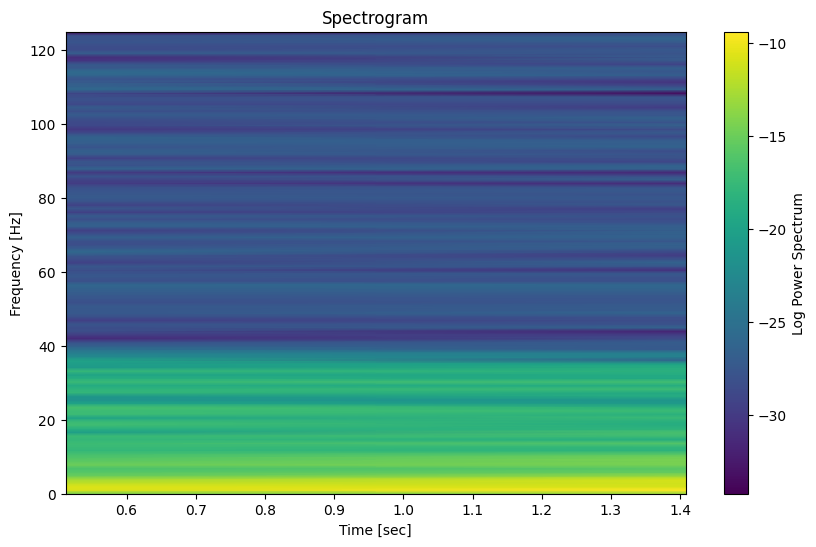



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type          MSE                                                                                                                                                                                                                  Coefficient (First 10 values)
   Approximation 8.077194e-07                       [0.03333653317897352, 0.03356403330135952, 0.034335666283230024, 0.03281032302293219, 0.03765729448944663, 0.019165736578685703, -0.030533422603357886, 0.004169105438294772, 0.03479478442079461, 0.024052427979424175]
  Detail Level 1 4.716347e-05           [8.337278869256429e-05, 0.0006123442750194746, 0.004265697414243443, -0.004797854698100677, 0.005479217151113367, -0.0032402224409196767, 0.003389681790156189, -0.007719130210524424, 0.0035324956327348923, 0.0003878607059750451]
  Detail Level 2 4.7660

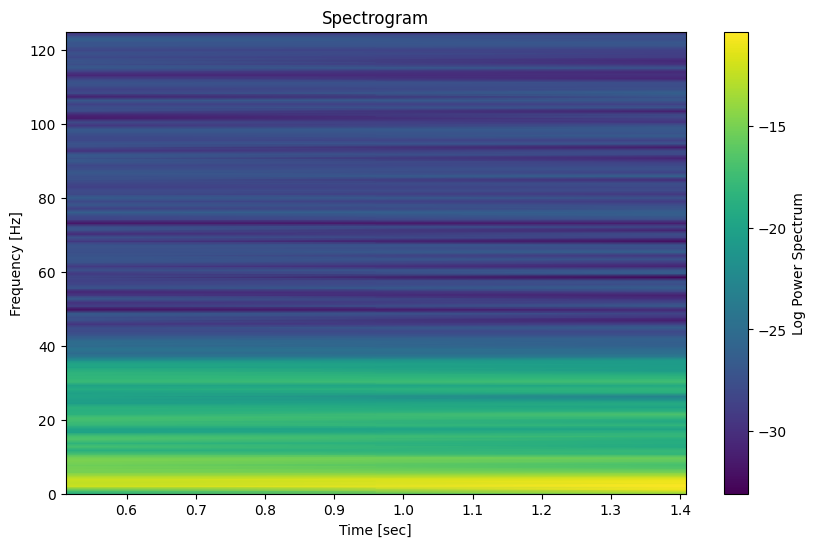



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000001                [0.007471854966686074, 0.007266388021148358, 0.007077537904390468, 0.007725221845125791, 0.005186745635991121, 0.014902609418723671, -0.033596665411609154, -0.019637716795625787, -0.012490145346058691, -0.0004679631896189144]
  Detail Level 1 0.000068         [-3.573567073228159e-05, -0.00023486539236062482, -0.0020122099714892077, 0.0025257645081218465, -0.0022093843512164062, 0.004034435456901121, -0.007395194124688335, 0.006145209485444666, -0.002876510263708667, 0.002747690801961705]
  Detail Level 2 0.000069    

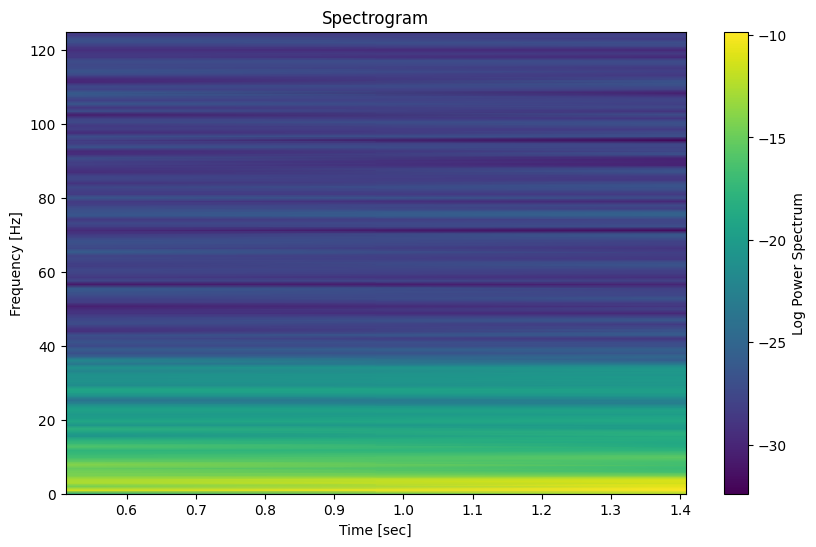



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                     Coefficient (First 10 values)
   Approximation 0.000001                [-0.007376168938963969, -0.0076790295537002414, -0.008575189044386802, -0.006844303337186129, -0.011772050098694031, 0.00622296369188341, 0.0021122189577613675, 0.015222492403116836, 0.019139254321409643, -0.02747110954222071]
  Detail Level 1 0.000095           [-9.169088400592392e-05, -0.000626931152182341, -0.0048997424233005816, 0.003731561052335942, 0.00030056200202689725, 0.004162737531807866, -0.008700601281358994, 0.0009716298920502975, 0.0036108756524588256, -0.005036597267542293]
  Detail Level 2 0.000095 

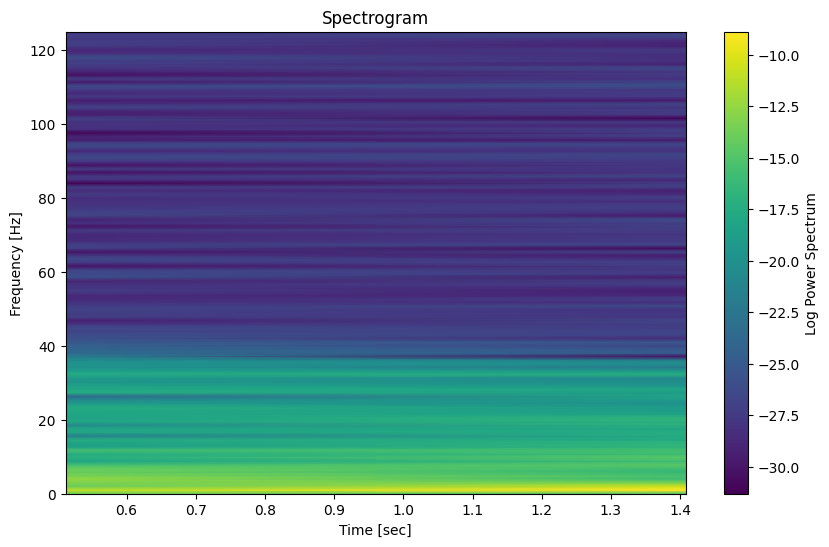



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type          MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 1.923269e-07          [-0.003161275237549942, -0.003165354696906896, -0.002824110273254431, -0.0033992092682530134, -0.0015544130612446779, -0.008829692328989256, -0.0048753205484132565, 0.027885643440764222, 0.041398143000983795, 0.0026348477744089585]
  Detail Level 1 1.750449e-05       [2.0593828330153903e-05, 0.00016146211050753936, 0.0011759249823259366, -0.0027140286726212437, 0.0038808974778010304, -0.0016549860532412031, 0.002855639698132683, -0.0032070220262715465, 0.003244953813578442, -0.0025634264536375847]
  Detail Level 2 

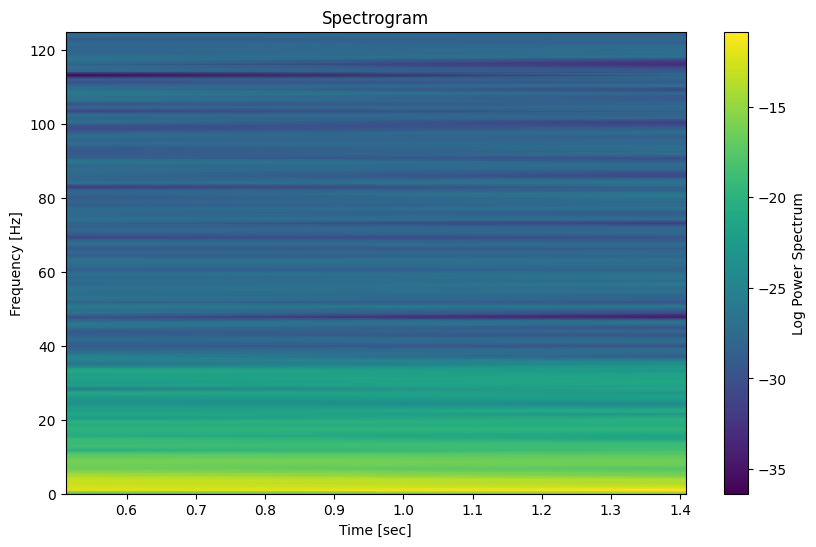



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type          MSE                                                                                                                                                                                                                  Coefficient (First 10 values)
   Approximation 5.799697e-07                  [0.01603849999594777, 0.01624511119688114, 0.016998626749234042, 0.015505469160427015, 0.020110949609336178, 0.0028737636602259834, -0.022974688708079394, -0.003385936161513752, 0.019994681280305703, 0.016299948456447853]
  Detail Level 1 3.842788e-05           [6.481424808422728e-05, 0.0005153694456350984, 0.004140665246740528, -0.004204369999457017, 0.0036969927463490894, -0.0029797695628834904, 0.005534509813551483, -0.00418626724881776, 0.0035995530317350626, 0.0011628947645604224]
  Detail Level 2 3.8877

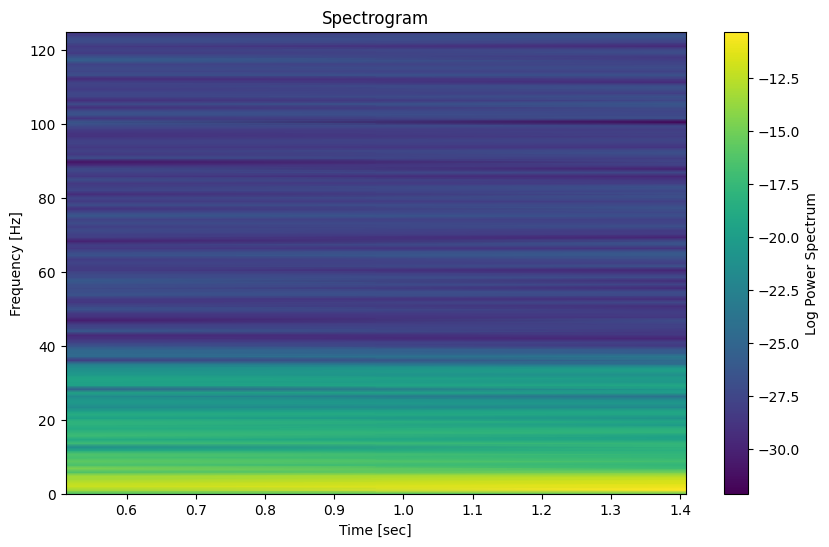



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type          MSE                                                                                                                                                                                                                     Coefficient (First 10 values)
   Approximation 9.837839e-07                        [0.047985676559988165, 0.047954114484253824, 0.048404844406664815, 0.04775549580335149, 0.049446867415756976, 0.0428426129738233, -0.030460917071185846, -0.03827350965633908, -0.005399910663436177, 0.03878892218558231]
  Detail Level 1 1.042558e-04            [3.503630285384406e-05, 0.00025967080529148035, 0.0014047865408859952, -0.0024715786654629264, 0.0015295904379311284, -0.005801682192465815, 0.005422957680551155, -0.0068661011210041445, 0.003224183927463427, 0.003120211036388955]
  Detail Level

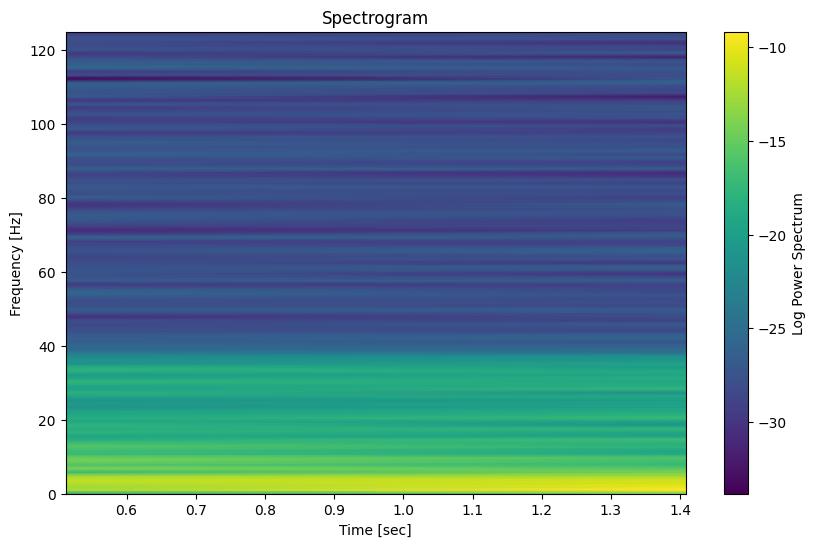



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000001                         [0.0775093561048207, 0.07742618923280524, 0.07768042484193431, 0.07748829622172708, 0.0775139629257478, 0.07717591411726125, -0.012901945044118422, -0.049630300215423126, -0.07163846655084846, 0.00017015325970453493]
  Detail Level 1 0.000084           [1.3036922649611567e-05, 8.448409230778914e-05, 0.0002080624494494944, -9.336571691797831e-05, -6.24740123562152e-05, -0.005132113025366788, -0.00043412672407419607, 0.00343557412367344, -0.00453034007072286, 0.004388483350464807]
  Detail Level 2 0.000086    

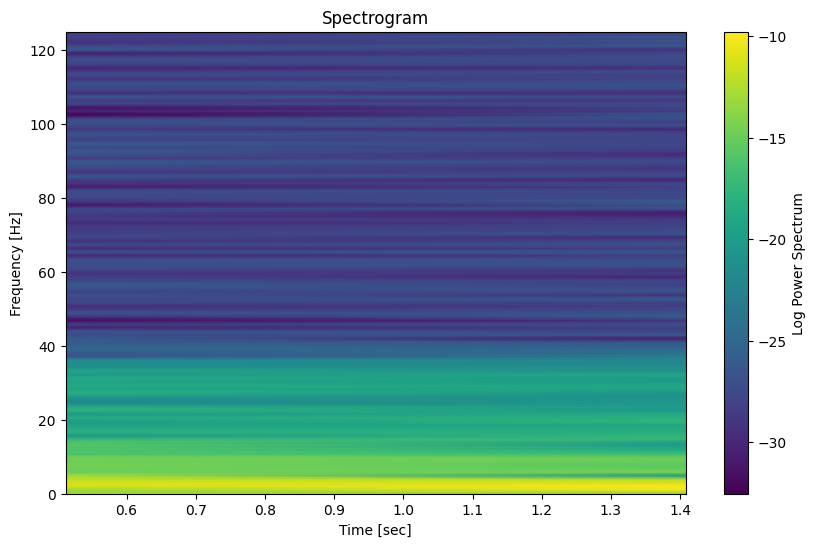



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                  Coefficient (First 10 values)
   Approximation 0.000003                [0.007844803915291586, 0.007375362742819422, 0.005593851540508698, 0.009095871750185771, -0.0017470361283856502, 0.038902606888588355, 0.0246755297099073, -0.019516633947481446, -0.048787004658915965, -0.030858521867659083]
  Detail Level 1 0.000066      [-0.00018221905125668394, -0.0012532050115317153, -0.009687265653835115, 0.008840621636088146, -0.013108537579305208, -0.0017241307443881186, -0.010779182398814813, 0.00889201613649128, -0.0058238535949947405, -0.0004164816947521753]
  Detail Level 2 0.000068          

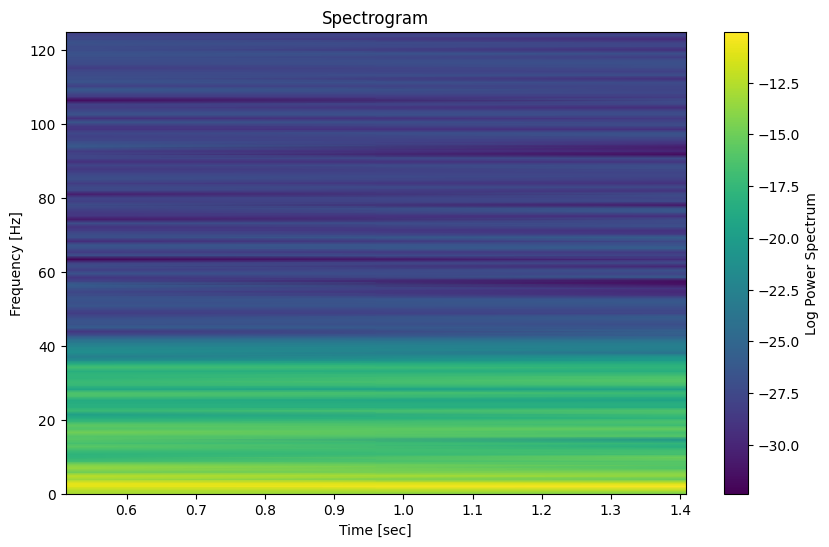



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000001                [-0.005104103188551545, -0.005395469584556719, -0.006740322063693055, -0.004018964690031522, -0.012927814860250193, 0.02077589806345724, 0.007103986292363675, -0.025705050569004618, -0.03590763529400605, -0.01155844896125378]
  Detail Level 1 0.000028           [-0.00010926400684120943, -0.0008238645176976724, -0.006714233549932348, 0.011027147484861033, -0.008143259583172151, 0.008847943656901483, -0.01316425749779713, 0.005190483886246392, -0.0012169938968076717, 0.0010219526917978343]
  Detail Level 2 0.000030    

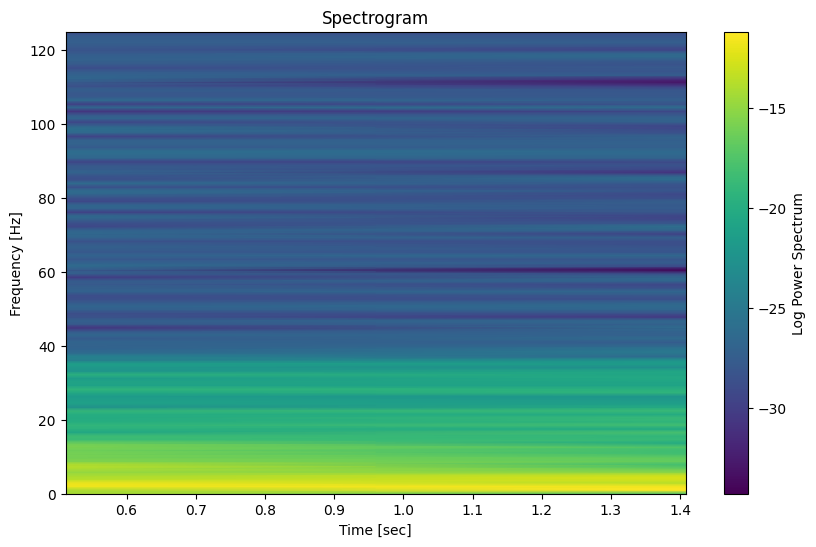



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type          MSE                                                                                                                                                                                                                     Coefficient (First 10 values)
   Approximation 6.952484e-07                         [0.036637752938613634, 0.03664605704945592, 0.03705993356738594, 0.03644005246891223, 0.038011783008470544, 0.03205820837527177, -0.01050116266513278, -0.027434478111818806, -0.02709562626202953, 0.016359510712955636]
  Detail Level 1 7.020316e-05           [3.9103881988678945e-05, 0.0002641050620355758, 0.0015236793036298626, -0.0015812665782788994, 0.0013023075005117735, -0.002281074689543178, 0.006166190376802228, -0.0036598145293459273, 0.0011868061916666627, 0.004023049692620707]
  Detail Level

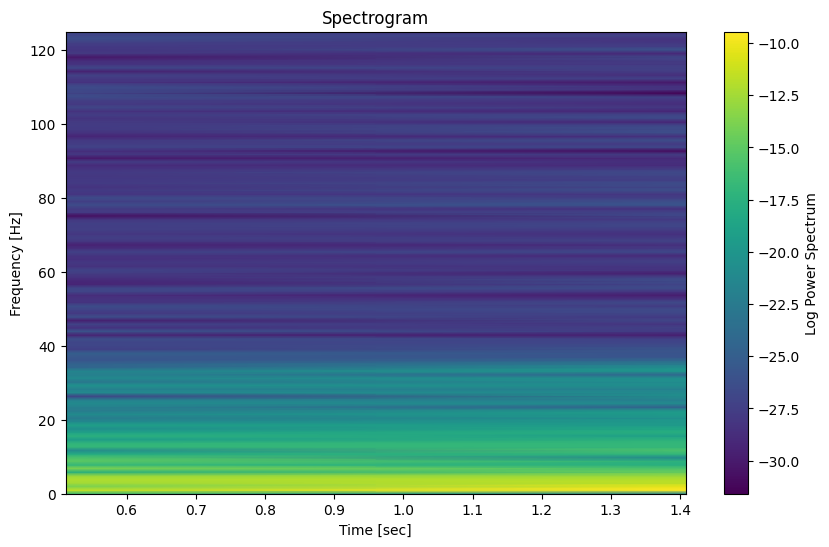



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                     Coefficient (First 10 values)
   Approximation 0.000001                               [0.07460683191677356, 0.07469347038607449, 0.07510682560577314, 0.07422089793986736, 0.0774152950063674, 0.06506234229715002, -0.02721559439676438, -0.05779359916369997, -0.0491084611557675, 0.03622794530622094]
  Detail Level 1 0.000133              [4.1219665261765705e-05, 0.0003174916496902285, 0.0021440634230430575, -0.004811178840378735, 0.004171033320210912, -0.0037061887443305534, 0.005303698378654251, -0.0034904596751605815, -0.001781491955201608, 0.0045338162695336]
  Detail Level 2 0.000134 

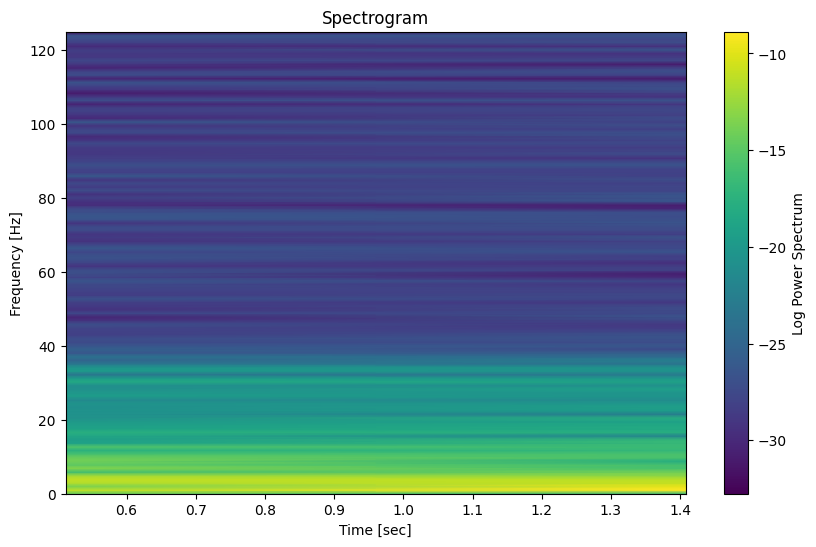



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                     Coefficient (First 10 values)
   Approximation 0.000002                           [0.08135813774592926, 0.08136120454480672, 0.08194358761871118, 0.0808950219067254, 0.08440053749718593, 0.07079736990082004, -0.034901995070581164, -0.059405847504464995, -0.044162349802699376, 0.04380791916917339]
  Detail Level 1 0.000125              [4.8409213510408264e-05, 0.0003514559564445749, 0.002171719093704314, -0.005859348375884518, 0.005014240654820246, -0.00453015523645981, 0.0047077723782142184, -0.004752940054371922, -0.0023121801011972173, 0.005831489456384112]
  Detail Level 2 0.000127 

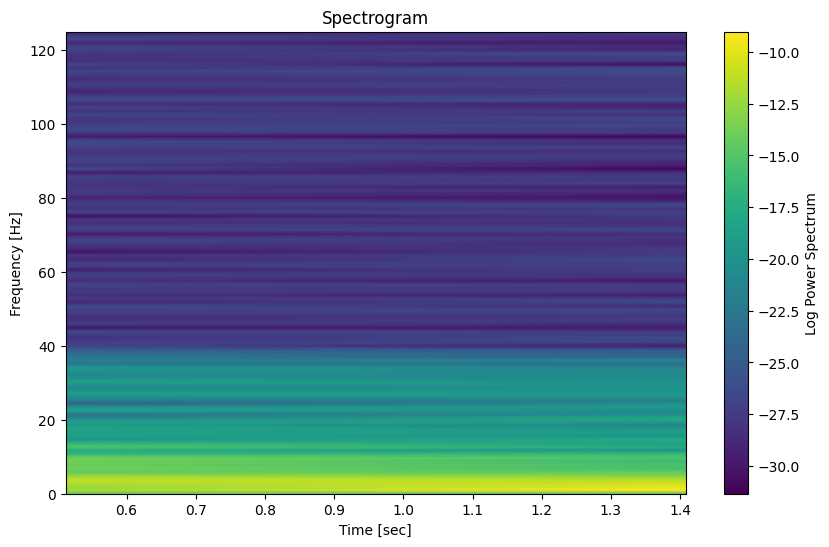



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00001)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                Coefficient (First 10 values)
   Approximation 0.000006                        [0.1024444548077081, 0.10294112272567144, 0.10212728373454182, 0.10263559002716283, 0.10272544192179242, 0.10176960476974148, 0.005360324261086733, -0.060984712670319643, -0.1202011624341216, 0.022722471403530252]
  Detail Level 1 0.000149     [-4.2464260605781616e-05, -0.00015847048655211985, 0.0005967459024142432, 0.0026230718042149614, -0.0005614312102583415, -0.012370060907823114, -0.006201412441074129, 0.01361918336592956, -0.015282763173574682, 0.007302193817722973]
  Detail Level 2 0.000154    [0.000940485

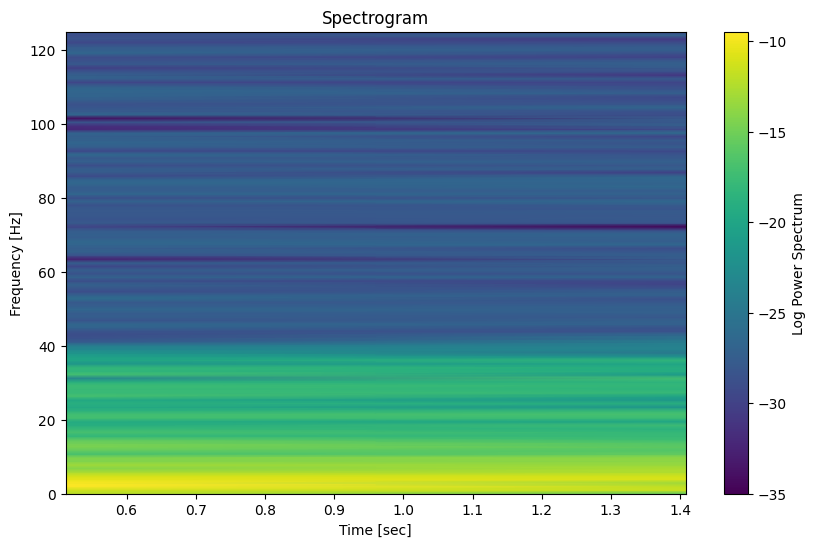



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                      Coefficient (First 10 values)
   Approximation 0.000005                           [0.035070400803080576, 0.03470961987274161, 0.03249526171931365, 0.03677637810347833, 0.023023922566647204, 0.07480423799945903, 0.07559709165407281, 0.0034946090150075183, -0.0862229818699838, -0.002475429265862354]
  Detail Level 1 0.000175                [-0.00018157093876977707, -0.0013309751820710439, -0.01020498154539319, 0.017979280037635215, -0.012187721151480715, 0.008533703656132772, -0.02044301266750426, 0.020102984023355034, -0.014630011569655207, 0.004526391748445279]
  Detail Level 2 0.0001

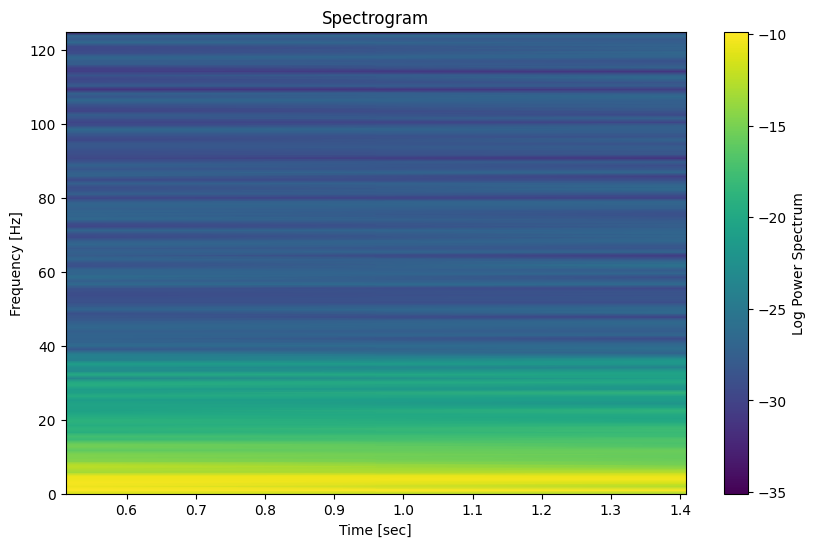



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type          MSE                                                                                                                                                                                                                     Coefficient (First 10 values)
   Approximation 8.170094e-07                          [0.056499438259569816, 0.05648838565153905, 0.05665515431784972, 0.05649708816549509, 0.05656137205916752, 0.05623676381391709, -0.0027148407615224367, -0.04478394929844055, -0.0647729044953086, 0.019501628649201942]
  Detail Level 1 1.045048e-04         [1.3897968793003034e-05, 0.00011099396882445402, 0.000531758092750423, 0.0006976811054562079, -0.00025684397969051126, -0.003106915901911077, 0.006866124855345971, -0.0008935778882732523, -0.0032219789792022843, 0.004534766261581683]
  Detail Level

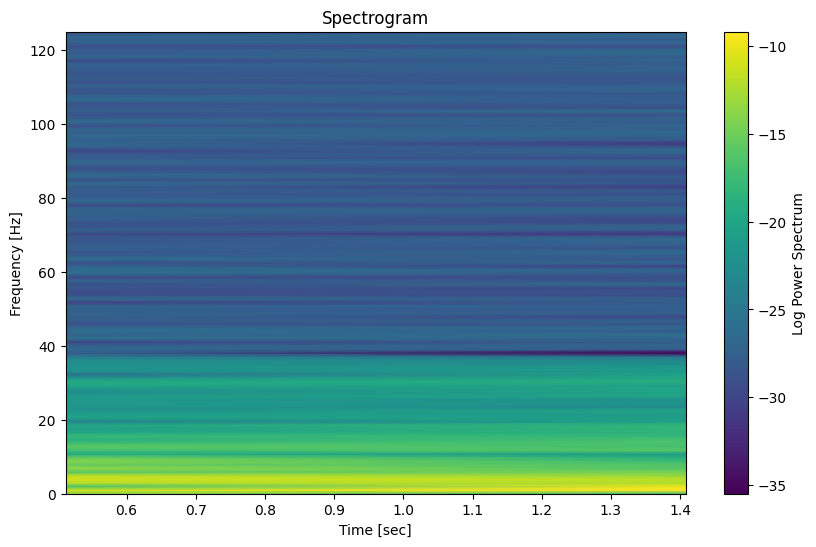



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                     Coefficient (First 10 values)
   Approximation 0.000002                              [0.07452111660765941, 0.07448357144515469, 0.07494509483873373, 0.07432008164810451, 0.0760424015941189, 0.06878256398919251, -0.01705700128628459, -0.06528915425603363, -0.09983411942327967, 0.02509498933271674]
  Detail Level 1 0.000163             [4.811483140304215e-05, 0.0003127628303705352, 0.001347504235522835, -0.0024034677547015437, 0.0051681397742227965, -0.0053627553578211975, 0.007553297499990945, -0.002343139309658487, -0.007571666708086798, 0.007474022642429623]
  Detail Level 2 0.000165 

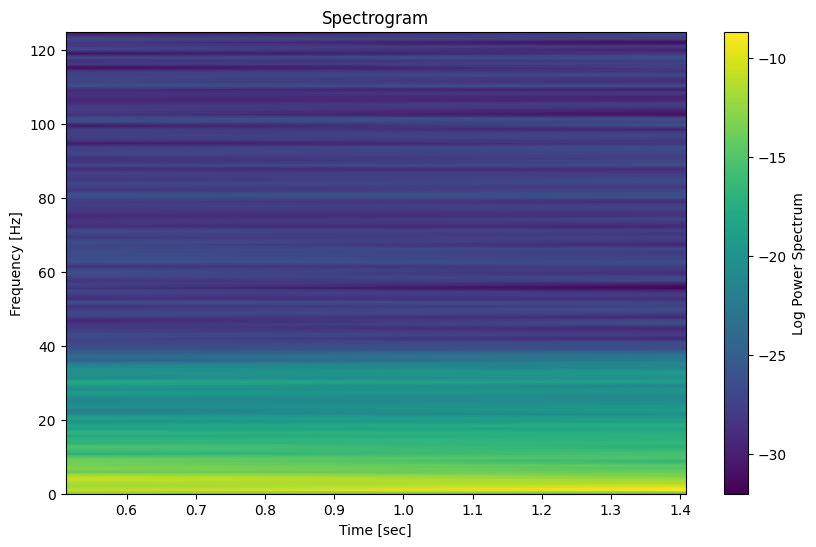



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000005                              [0.1306423289181509, 0.13141506720606216, 0.13083117228262728, 0.13041634705649546, 0.13446205682650508, 0.1185298195587219, 0.008532364268940322, -0.06109317513788604, -0.11371448716477489, 0.04464803062701219]
  Detail Level 1 0.000164         [-1.6063734387567223e-06, 0.00014022177702555723, 0.003246358332392063, -0.0026661789694018144, 0.0031656532877554853, -0.013132732532917739, -0.0013757228277932148, 0.007673096313540699, -0.014045536638458042, 0.007477056322847478]
  Detail Level 2 0.000168    

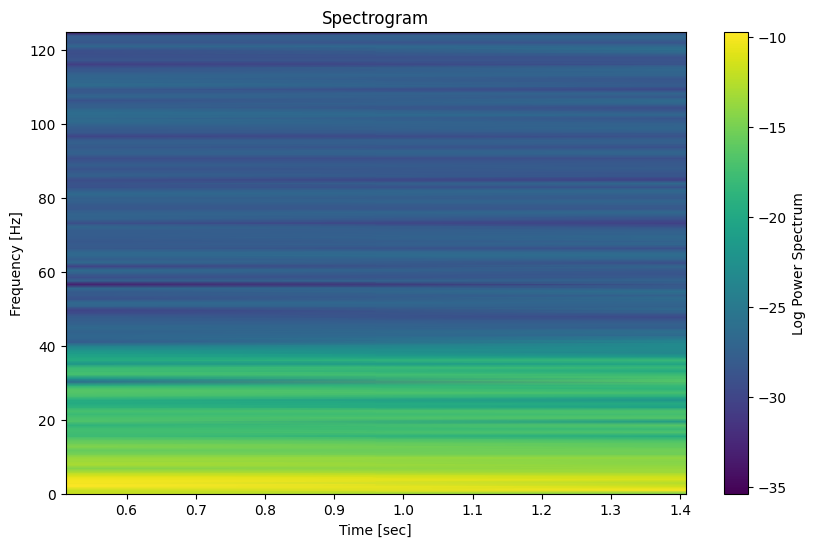



Class: Normal

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                Coefficient (First 10 values)
   Approximation 0.000002                          [0.0925645189444889, 0.09257092890759595, 0.09245360185900613, 0.0925648816830743, 0.09273305223407215, 0.09141339389940134, 0.0018786494129330918, -0.0591155419937343, -0.11340938738954405, 0.03938340486250519]
  Detail Level 1 0.000159       [-1.8783144000035067e-06, -8.26832495324462e-06, -0.0003857087401756052, -0.0014887153377929215, 0.0020880130270653718, -0.006141396730534563, 0.0049917307890968, 0.00010405748167782177, -0.010057630402662625, 0.00858103586460127]
  Detail Level 2 0.000161 [5.012465714690

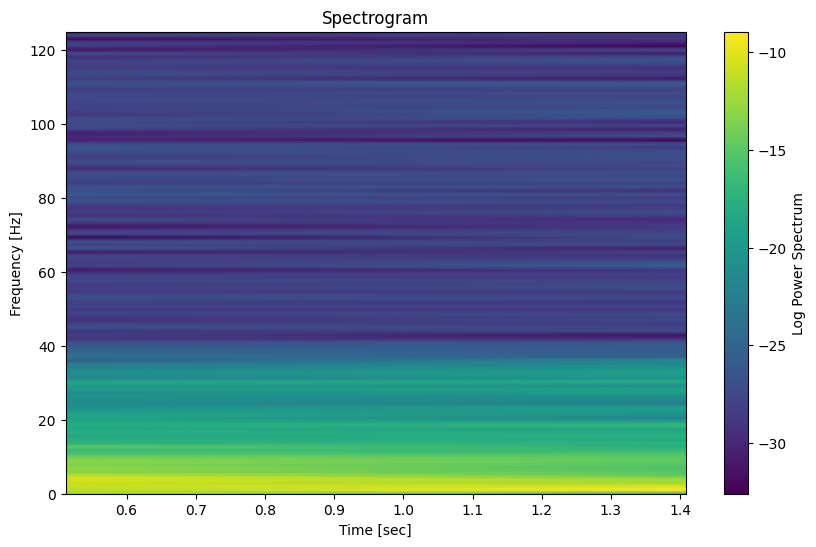



Feature Table:Normal
    FFT Mean  FFT Std Dev  Peak Frequency  Approx Energy  Detail Energy Level 1  Detail Energy Level 2  Detail Energy Level 3  Detail Energy Level 4  Zero Crossing Rate
0   0.056254     0.211808             1.0       0.052434               0.000390               0.000180               0.000038           6.367507e-07                11.0
1   0.044395     0.148280             1.5       0.029414               0.000332               0.000121               0.000028           4.298595e-07                16.0
2   0.045292     0.180685             1.0       0.035258               0.000617               0.000059               0.000005           1.096626e-07                10.0
3   0.049964     0.212790             1.0       0.048218               0.000409               0.000170               0.000025           5.084633e-07                 7.0
4   0.020915     0.091651             1.0       0.008790               0.000086               0.000019               0.000002       

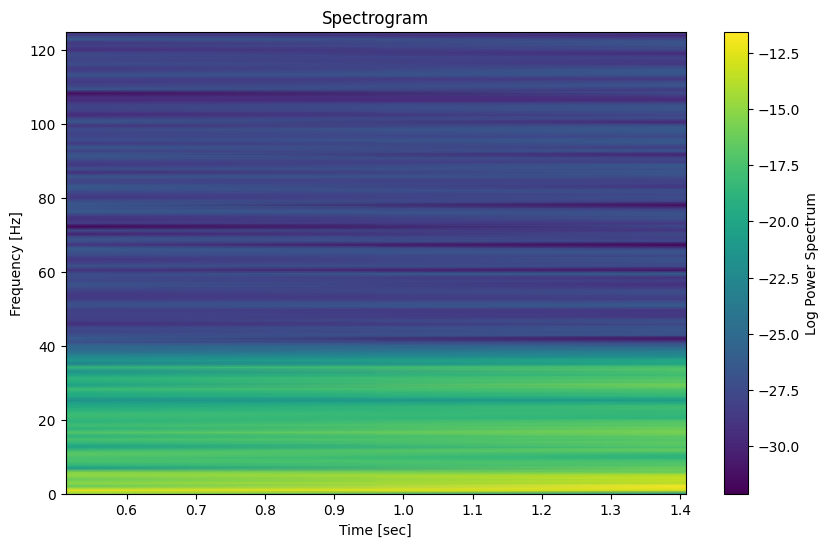



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type          MSE                                                                                                                                                                                                                  Coefficient (First 10 values)
   Approximation 3.666614e-07           [-0.007072131090090195, -0.007208425765132569, -0.007509848350573297, -0.00687504175554845, -0.008853316592981645, -0.0014366076485021746, 0.017760435681736245, 0.014876426954434849, 0.0035100420380292834, -0.004363384997590011]
  Detail Level 1 6.513322e-06   [-3.490959041380452e-05, -0.00025829585686623977, -0.0019150772904381567, 0.0016018619111044655, -0.0010470509389615104, 0.0015193245421635609, -0.0008236238372398793, 0.002394594901910376, -0.001891643960572953, -0.0011672887537948226]
  Det

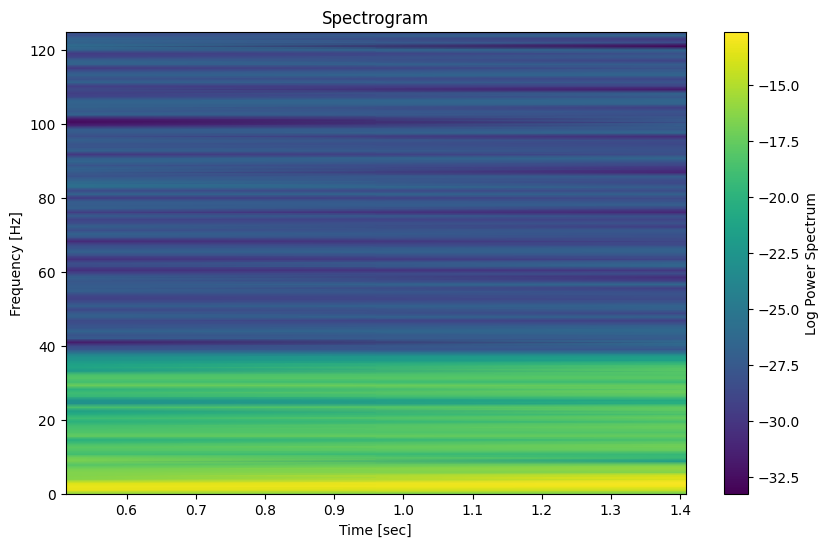



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                      Coefficient (First 10 values)
   Approximation 0.000004                          [-0.06102446599898196, -0.06135093887773421, -0.06319338598034226, -0.059839292746313735, -0.06989814939234806, -0.03252936414949886, 0.04532523368065132, 0.07129617852014652, 0.11738808791386887, 0.08642566671031891]
  Detail Level 1 0.000144           [-0.00016533039267870714, -0.0013047527194929391, -0.00875027751118061, 0.012078422830293397, -0.005235554423690664, 0.0022133511584907775, 0.0013485407326736126, -0.0010331864324984719, -0.002031568747449715, 0.0008684174846448233]
  Det

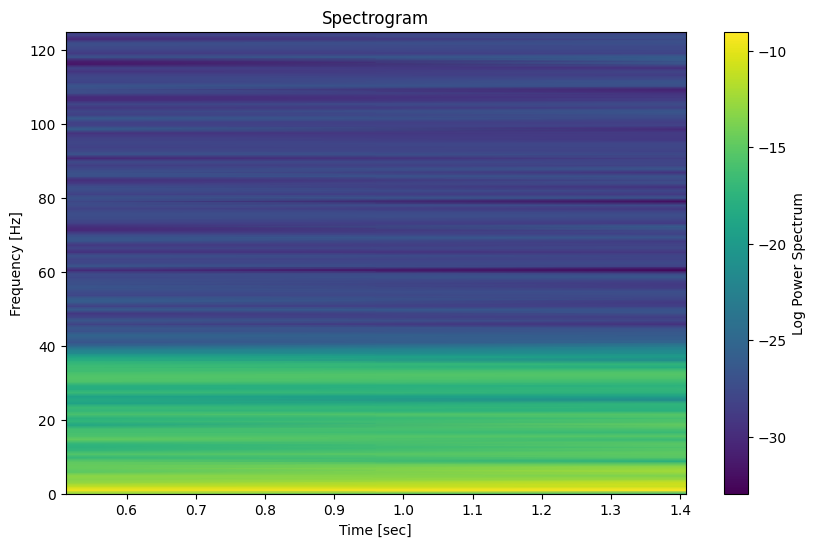



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                  Coefficient (First 10 values)
   Approximation 0.000003                      [-0.04536267795121382, -0.045719922457163345, -0.0463473747128003, -0.04463221827144144, -0.05157518827733307, -0.02491246468640415, 0.04029217838427313, 0.051385075353759746, 0.08691450305121892, 0.06549358901799099]
  Detail Level 1 0.000105           [-9.362696590223886e-05, -0.0006802498213475943, -0.0043134856438558, 0.01174689092467359, -0.006526547462408524, 0.0026744698753044197, 0.00396901915400165, 0.0011418089521637365, -0.003652390923234919, -0.00020685172689974773]
  Detail Level 2 

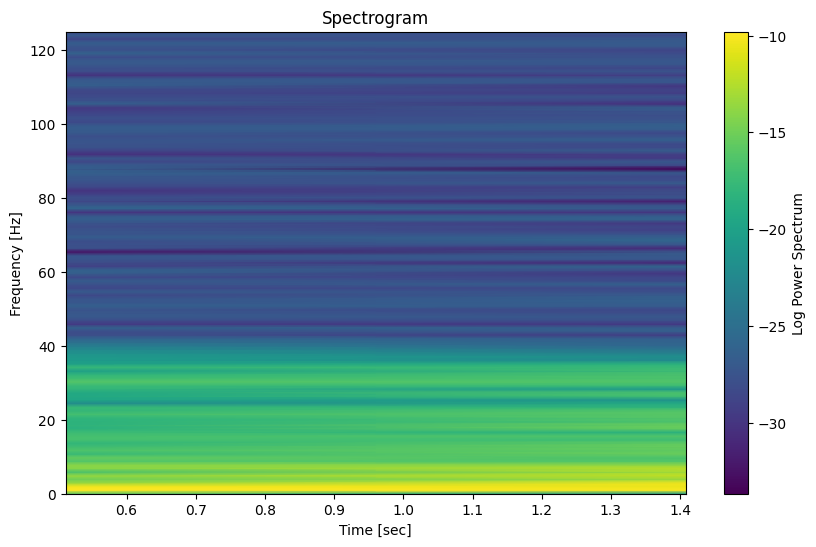



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000003                     [-0.011742120318266476, -0.01224649443466191, -0.013099674004310488, -0.011244185453780864, -0.017154315700881693, 0.005304296033461622, 0.06576549603347055, 0.0425425566020522, 0.03854365714400604, 0.014801525852637476]
  Detail Level 1 0.000034        [-0.00012945572699201403, -0.0008846740887615587, -0.005881465329550077, 0.004620288740272646, -0.0036782158853709912, 0.004103055019635857, 0.0050427580224276245, 0.0010895154702279617, -0.003165842919586165, -0.0004169413027070509]
  Detail Le

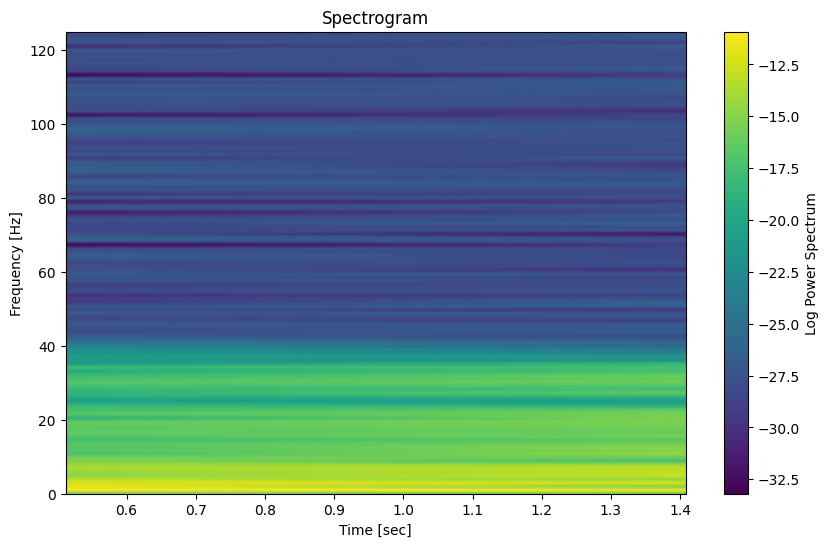



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                 Coefficient (First 10 values)
   Approximation 0.000003                     [0.023817254172773705, 0.023386080180402044, 0.022021027731673738, 0.02429854957244519, 0.018473071252929095, 0.04098588517062126, 0.07879311722298046, 0.02542458726318826, -0.007471619045811571, -0.03347440282854005]
  Detail Level 1 0.000051         [-0.0001653841570658533, -0.0010781158474431106, -0.006996794472549402, 0.0015357182649322458, -0.00546225918370922, 0.010096504658227548, -0.0013720858115649453, 0.003377056969985566, -0.003753670329799475, 0.000524399613194708]
  Detail Level 2 0.0

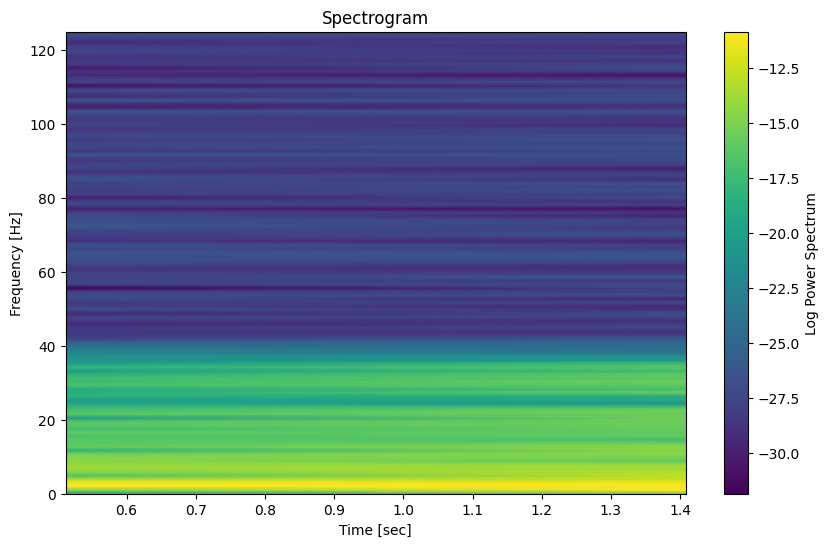



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00001)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                  Coefficient (First 10 values)
   Approximation 0.000008                         [0.05140942843102214, 0.0507991883735742, 0.04787822677069854, 0.052861122043422984, 0.03942047336910596, 0.09010856279475589, 0.09935930587505282, -0.024438938555434213, -0.06530940177923697, -0.08963558660296138]
  Detail Level 1 0.000231            [-0.000282431665772399, -0.0019546184299102606, -0.013795106036004923, 0.009068316624853082, -0.009800649530986175, 0.015926769547692787, -0.013761060417635862, 0.007145907214074171, -0.005684651832420865, 0.002401628117102533]
  Detail Level 2 

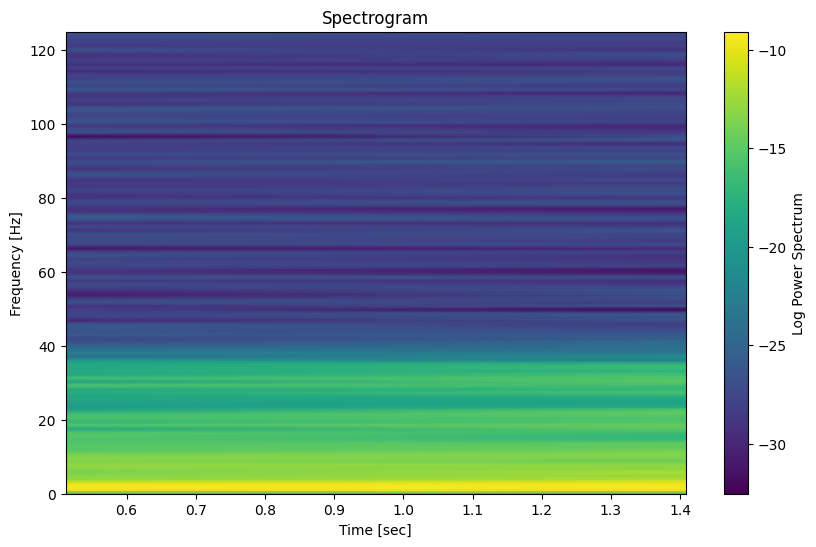



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00001)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                      Coefficient (First 10 values)
   Approximation 0.000011                              [-0.1076920418789202, -0.10865973594238673, -0.10909672040559393, -0.1052920118049711, -0.12472059030518386, -0.05180029934279044, 0.04154355747465202, 0.04319070061812508, 0.0814024862685589, 0.03476657449464522]
  Detail Level 1 0.000571               [-7.562136379249927e-05, -0.0009199725291575232, -0.009882053943950185, 0.03396147509188636, -0.019161216886422954, -0.002928880932460975, -0.006559433717300743, 0.003655739879018967, 0.0009829982068401643, 0.009140607746345848]
  Det

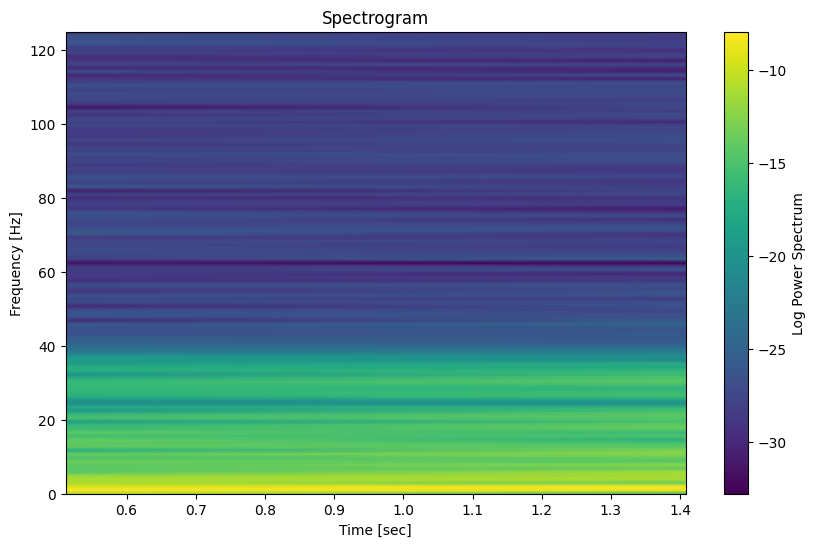



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00001)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                  Coefficient (First 10 values)
   Approximation 0.000015                      [-0.07461397640574201, -0.0757023481347375, -0.07698247166016983, -0.07276938083188104, -0.08938033312619234, -0.028828250915599075, 0.07209769822635226, 0.07418617355727926, 0.07578231965764631, 0.012806858120177834]
  Detail Level 1 0.000450       [-0.00021734559085303563, -0.0016520763642734082, -0.012232385933321228, 0.023599624875160395, -0.0016120984163419533, -0.006956608838653715, 0.0025566595261758075, -0.002657851566640567, 0.0003446580041095189, 0.002958870002587013]
  Detail Level 2 

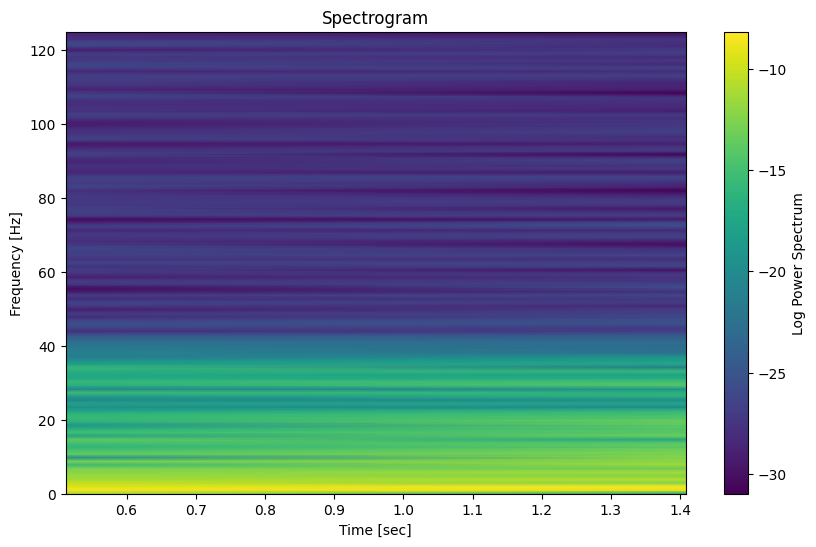



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00001)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                       Coefficient (First 10 values)
   Approximation 0.000008                           [-0.06594493786460401, -0.06672471744643267, -0.06798876317593877, -0.06408903849865775, -0.07977941426802686, -0.021463715254290534, 0.06090808691788929, 0.07239798107517074, 0.11515083026033811, 0.05293326480468614]
  Detail Level 1 0.000158            [-0.00014156695067775443, -0.0011593912300427182, -0.009914923823701512, 0.02470694402304488, -0.007927867478632205, 0.001872778002189616, 0.004395631459368713, 0.00037636609956061154, -0.0032251615641388284, 0.00025301335244381606]
  

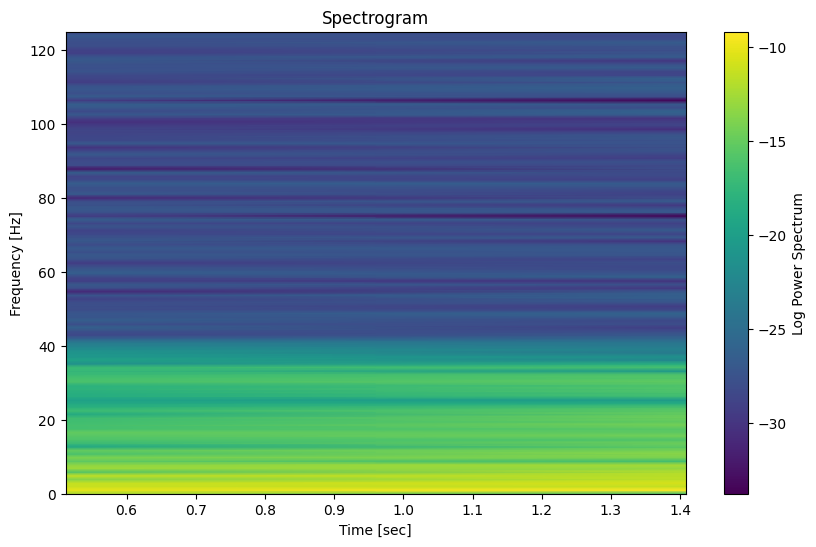



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00001)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                               Coefficient (First 10 values)
   Approximation 0.000010                     [0.055852473638428116, 0.0549729703744515, 0.05218712954109726, 0.05743969700590261, 0.041915032135427945, 0.10105694409117384, 0.13174248501811076, -0.01601409427745804, -0.029864630171019396, -0.07977637048772218]
  Detail Level 1 0.000228         [-0.00031000292617092053, -0.0021910776326797836, -0.01536702100557305, 0.011212791600552153, -0.01520843365666999, 0.01595330405656024, -0.010001986894571487, 0.009300604314122086, -0.007512987132072298, 0.0032371377615133413]
  Detail Level 2 0.000234 

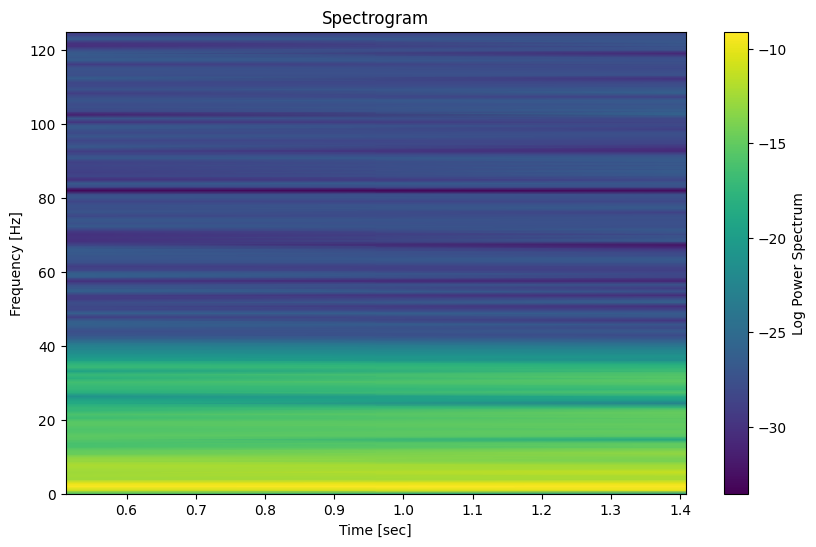



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00002)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000020                   [-0.05525429248359768, -0.056410097628397764, -0.05955412166810375, -0.052367607536027705, -0.07718269918577886, 0.016007731465167513, 0.10565450254626021, -0.040058664913496744, -0.04406462370632554, -0.06165283412458904]
  Detail Level 1 0.000457             [-0.000323135441933026, -0.0024557032777173847, -0.01926745787087425, 0.030168017525264983, -0.018083048406973355, 0.017933158395051454, -0.016982373982302103, 0.005021625893211431, -0.004865753609429139, 0.00027016029345467406]
  Detail Le

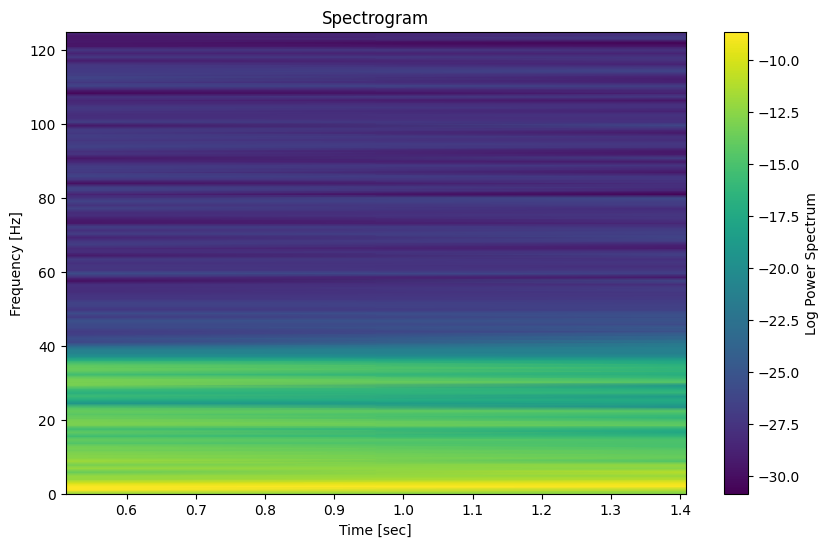



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00001)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000011                    [-0.0971058023705341, -0.09864322764034142, -0.10141880121481842, -0.09428506960251931, -0.1193583158148374, -0.026379102882555048, 0.05850458455748919, -0.026302963804931672, 0.014194594948807008, -0.0030954603170243846]
  Detail Level 1 0.000544          [-0.00029041771076299626, -0.0022726962807925626, -0.020316690187226014, 0.027154861490783576, -0.011383062650342007, 0.015193369485287196, -0.014856957948391217, -0.004338384697213597, -0.00195422104786062, -0.0044970516532880644]
  Detail Le

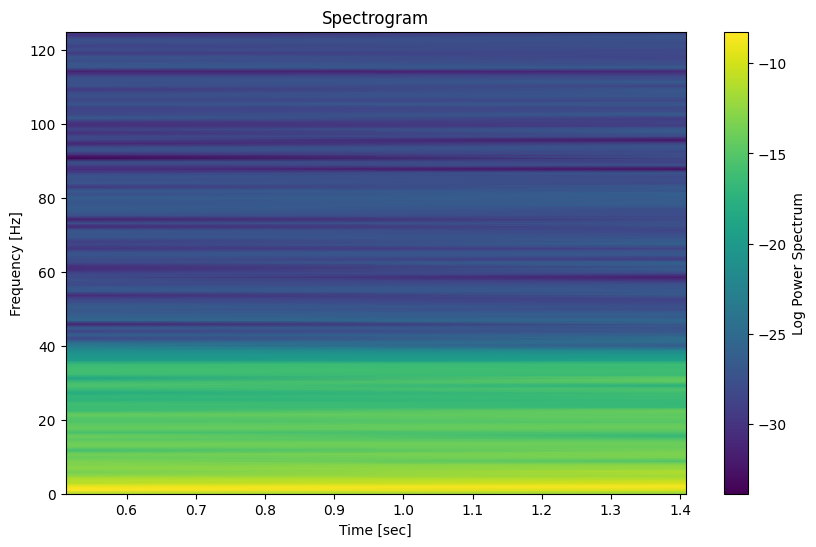



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00002)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                   Coefficient (First 10 values)
   Approximation 0.000023                       [-0.056757777665245895, -0.05778328438266983, -0.05945222090907605, -0.05306543108797508, -0.08193387193014574, 0.025478058488569377, 0.0908402890869408, 0.06996657808433351, 0.03692510396319869, -0.07395483251840966]
  Detail Level 1 0.000680          [-0.00019284632142985042, -0.0016418244839921155, -0.014137378721325294, 0.05511525204811529, -0.019265089720404298, -0.006024184364776317, -0.014501777062205113, 0.008259990271071431, -0.0037663328550104473, 0.009885875486843625]
  Detail Level

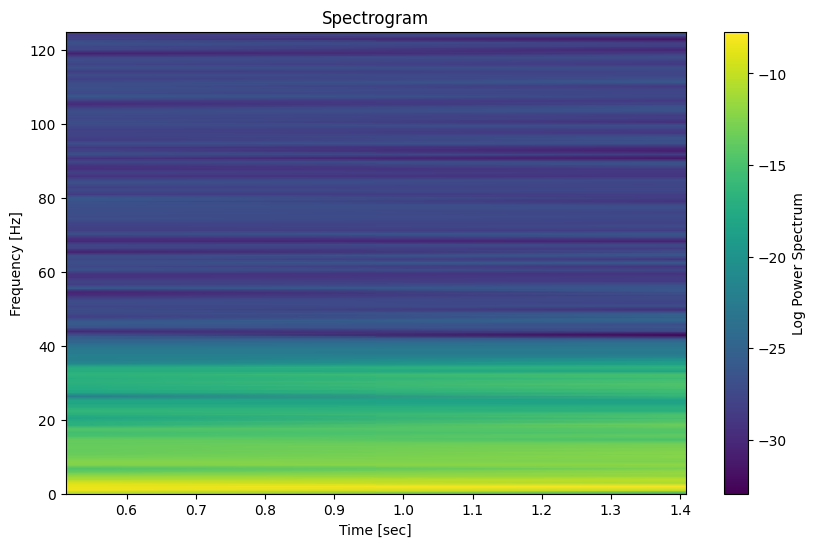



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00001)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                       Coefficient (First 10 values)
   Approximation 0.000013                          [-0.050923938452283345, -0.052000768155127775, -0.05354128383755043, -0.0480365589239772, -0.07187076269495167, 0.01724024710129589, 0.07627248557215949, 0.07573060784925197, 0.09325116368814265, -0.036226336606957475]
  Detail Level 1 0.000382                [-0.00018328771230057404, -0.0015613868262315217, -0.013406233616570541, 0.041208628429726245, -0.015789077724946, 0.002358857456277707, -0.007221206259550105, 0.0003659518092127953, -0.0032024003097832258, 0.005179352064504209]
  

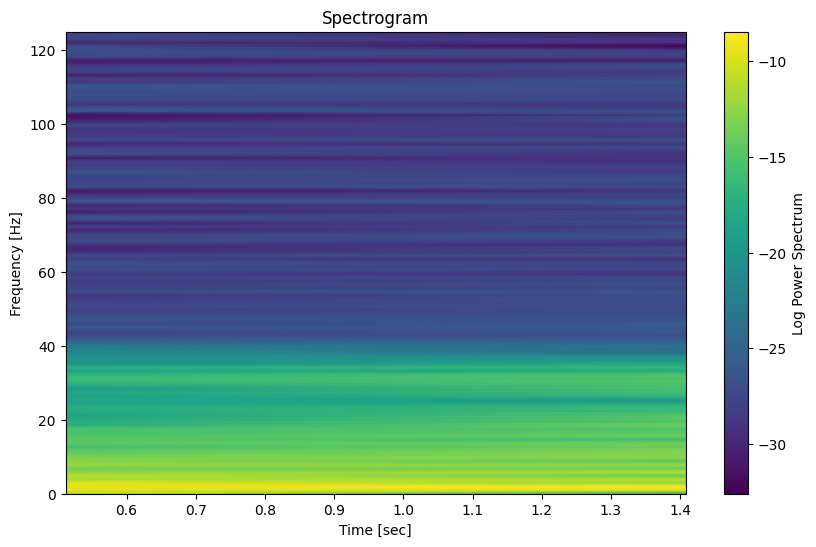



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00019)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                      Coefficient (First 10 values)
   Approximation 0.000192                             [0.008651648175477908, 0.008773085990952572, 0.00851213674236952, 0.008753534267961305, 0.009559751576925919, 0.006640867268192192, 0.006310260060643799, 0.03935193692836012, 0.5609707122389314, 0.5032241186520633]
  Detail Level 1 0.002324                      [-1.896194264245866e-05, -8.981370816935511e-05, -0.0002556047030426816, 0.000429009478162871, 0.022949400707692472, 0.07277892399970359, -0.1042518622229564, 0.1967469255845159, 0.04491008101125359, 0.006715798001918752]
  Det

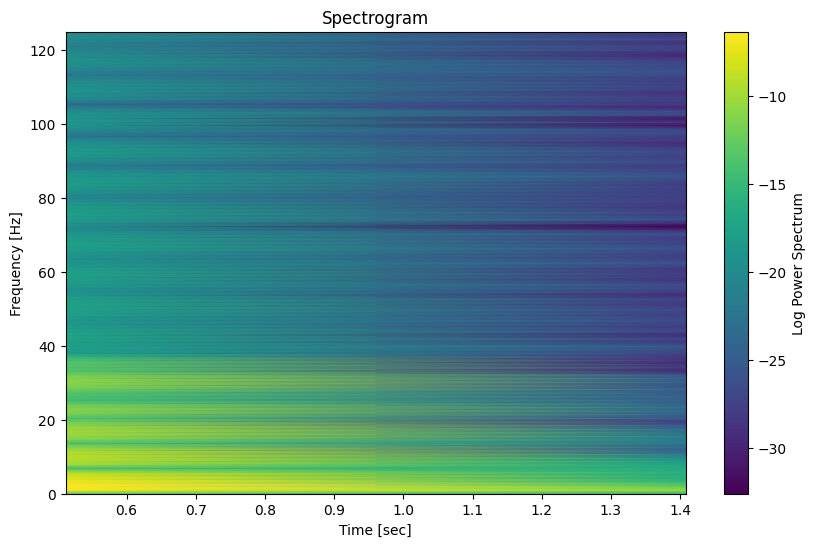



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00128)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.001275                          [0.06380418336002058, 0.06344647795006629, 0.06720110924766758, 0.0629997637150142, 0.06997124588407817, 0.04376747695657958, -0.017128485615378858, -0.05757808673225795, -0.07778205833347367, -0.031431502561913086]
  Detail Level 1 0.019766               [0.0004213566095652321, 0.0022567157922432843, 0.008626703353985986, -0.0066245525245189636, 0.0026815348866896255, 3.158822599403006e-05, -0.0011593915257390155, -0.04822983712116243, -0.2970733803594767, 0.17439636758783383]
  Detail Le

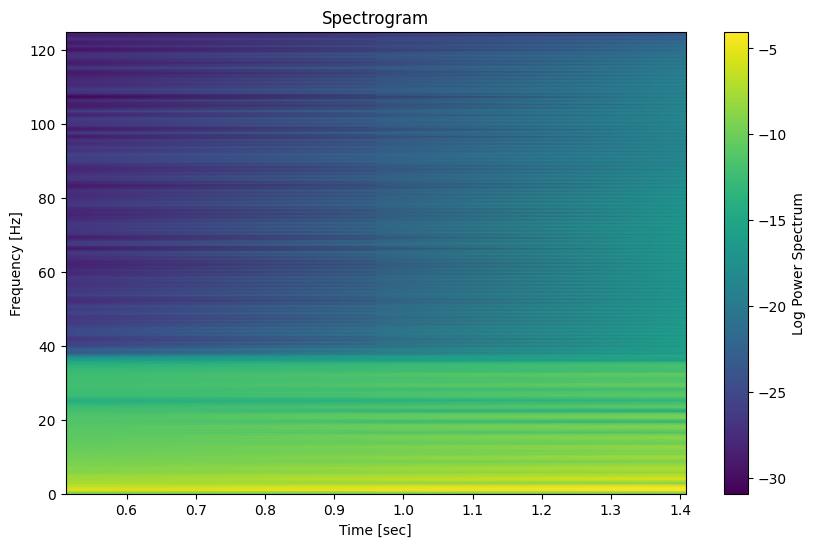



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00003)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000034                        [-0.04901101839994802, -0.04995167404092523, -0.05152388408217935, -0.04433740222626011, -0.08080289032591932, 0.059821696328875816, 0.13104755212536914, 0.0547236814504294, 0.061181412893512185, -0.09012301166401081]
  Detail Level 1 0.000613               [-0.00021754505635598098, -0.0017526222370096464, -0.013438754862342969, 0.07855013758163634, -0.04695151425396223, 0.020342032641790842, -0.03871815785492262, 0.013873880260345594, -0.005950874561201165, 0.009864825172546993]
  Detail Le

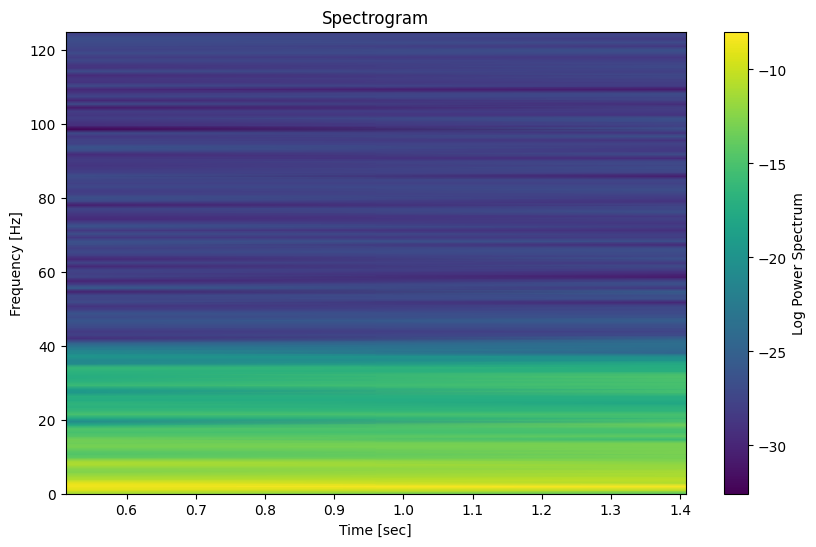



Class: Complex_Partial_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00002)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                   Coefficient (First 10 values)
   Approximation 0.000020                        [-0.0385192268196519, -0.040129380733367234, -0.042503950217367234, -0.034906242339788805, -0.06621337271982983, 0.0522096588048899, 0.09411140171267533, -0.0335412520315396, 0.03376103630790654, -0.0481456207835973]
  Detail Level 1 0.000664             [-0.0003097190961949266, -0.0025078088237957545, -0.0200128449629493, 0.048408242391110246, -0.023910497789499746, 0.02237251363771878, -0.021632685893078124, 0.0018925233218697712, 0.005074096826784768, -0.0017292918779363588]
  Detail Level

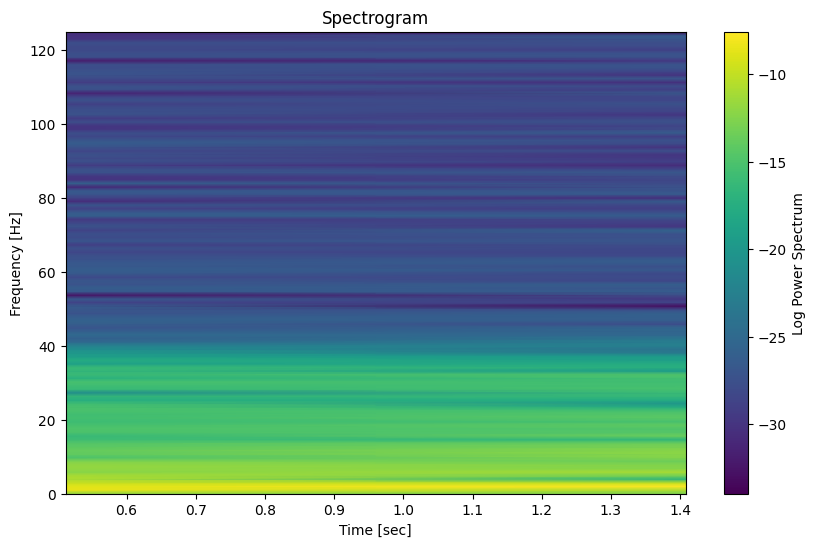



Feature Table:Complex_Partial_Seizures
    FFT Mean  FFT Std Dev  Peak Frequency  Approx Energy  Detail Energy Level 1  Detail Energy Level 2  Detail Energy Level 3  Detail Energy Level 4  Zero Crossing Rate
0   0.023158     0.070743             1.5       0.007000               0.000172               0.000149               0.000057           1.001800e-06                19.0
1   0.019324     0.054557             1.5       0.003446               0.000092               0.000066               0.000037           5.563793e-07                15.0
2   0.076536     0.259697             0.5       0.090993               0.001040               0.001014               0.000196           5.514063e-06                19.0
3   0.057185     0.225330             1.5       0.063309               0.001280               0.000292               0.000110           1.755630e-06                10.0
4   0.040483     0.127601             1.5       0.017368               0.001032               0.000351            

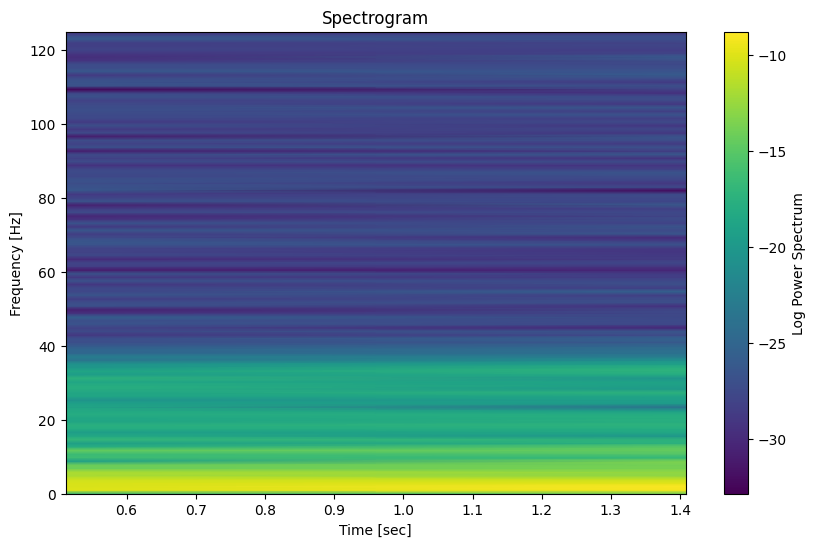



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000002                     [0.027402623506119484, 0.027534182837869913, 0.027802887173369963, 0.027117544974893028, 0.02946966649737749, 0.020922407425631704, 0.012235921637593367, -0.008793894158007208, 0.034489287988982056, 0.049109430853146514]
  Detail Level 1 0.000153        [2.245918091619081e-05, 0.0001963306688204013, 0.001886275685925756, -0.0028136528782653505, -0.0004432642594281406, -0.002606028827051924, 0.0017301211118889253, -0.0034417303767658473, 0.0013461565793724086, -0.0012290228715721384]
  Detail Lev

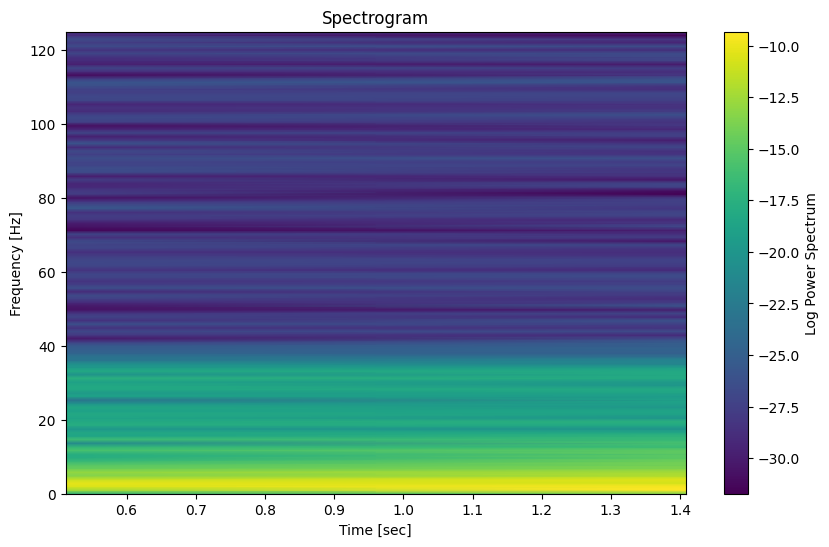



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000002                       [0.049573803128407076, 0.04977504753760135, 0.04975297982570646, 0.04951409541834479, 0.05049816511607675, 0.047131215109084204, -0.029724956645805996, -0.04482917341020021, -0.007381939488013477, -0.02340330379082906]
  Detail Level 1 0.000092        [2.0797314741878147e-05, 0.00015167623006856842, 0.0013762727289538786, 0.0004073102689132467, -0.0013369808521924232, -2.663349572807846e-05, 0.0010219492534821, -0.00027699448189666106, 0.0002552909155300471, -0.003432230365119353]
  Detail Lev

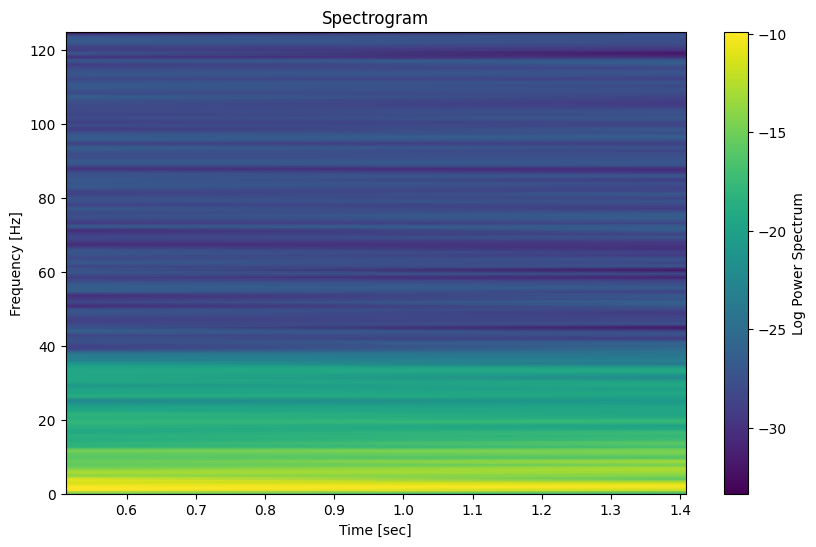



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000002                  [0.002779688033257722, 0.0026320174359144317, 0.0027888459387946326, 0.002853522632939462, 0.001793771329142206, 0.006192548424847388, -0.01471905041136096, -0.006726409033725414, 0.03750037137077636, -0.007968163320126447]
  Detail Level 1 0.000120        [2.7255028743886675e-07, 1.1849701545810656e-05, -0.0003755485918967523, 0.0015076645507687845, -0.0027851513197868515, 0.0021360116337414228, 0.0010057004476279321, -0.005094214580296988, 0.003456155469469298, -0.004368660600809614]
  Detail Lev

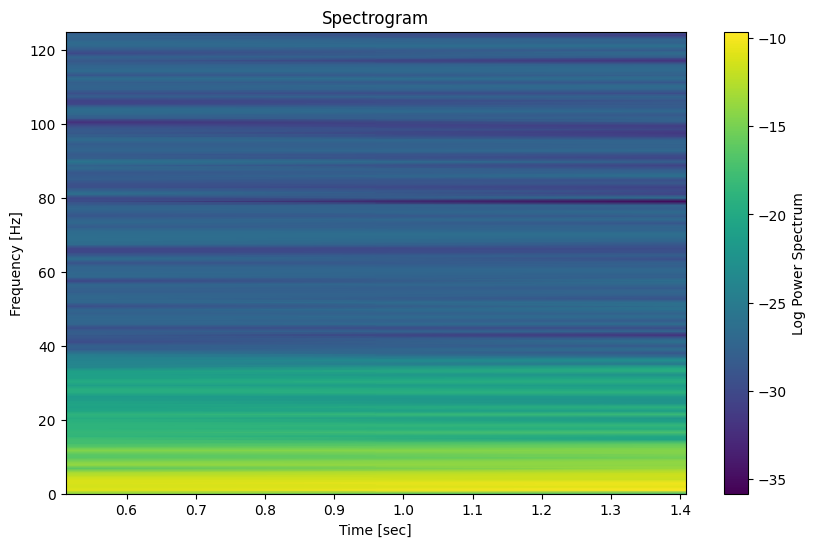



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                      Coefficient (First 10 values)
   Approximation 0.000002                            [0.01494381942949047, 0.014775428507341065, 0.01467273665407468, 0.015251982383988411, 0.012365644290701978, 0.02389434812213241, 0.030184665945198988, 0.026690651036403792, 0.07805188250102632, 0.07063369468606395]
  Detail Level 1 0.000123       [-1.583922066260377e-05, -0.00013672804174875587, -0.0015734234250688486, 0.003985024716352907, -0.006803707541140441, 0.0024696458520123005, -0.0009628478474574446, -0.0045546001022621005, 0.0017952924941258574, -0.0010368522588339577]
  Deta

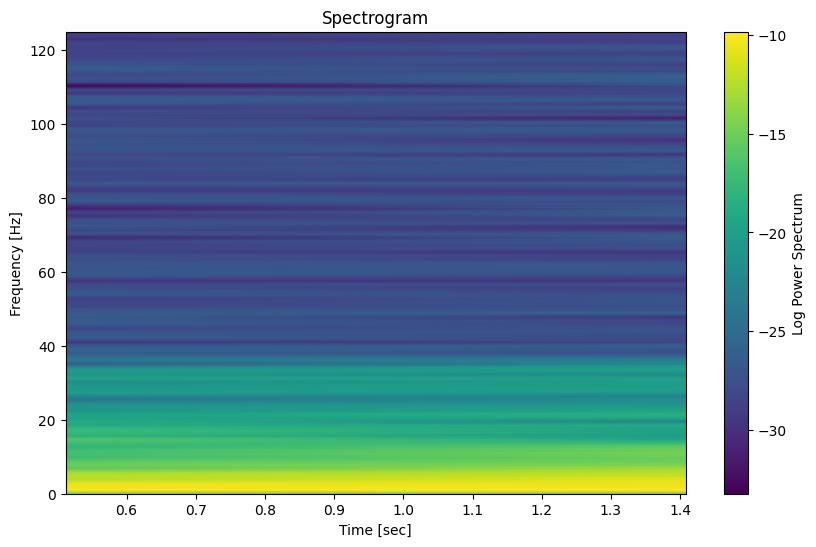



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000002                           [0.025027623705184823, 0.02507528048138176, 0.02513731629087871, 0.024954267062711557, 0.025562207695393885, 0.023473819701621924, 0.04474404485002463, 0.03748800372256818, 0.07805792284280048, 0.08478465418097801]
  Detail Level 1 0.000176    [7.019950549895748e-06, 3.8586836668934587e-05, 0.0004427269314419988, -0.0009466946239474036, -0.0016375042713609117, -0.001925818821622247, 0.00042407666879493513, -0.0035883995926365773, 0.00024588576551190045, -9.161700011767269e-05]
  Detail Lev

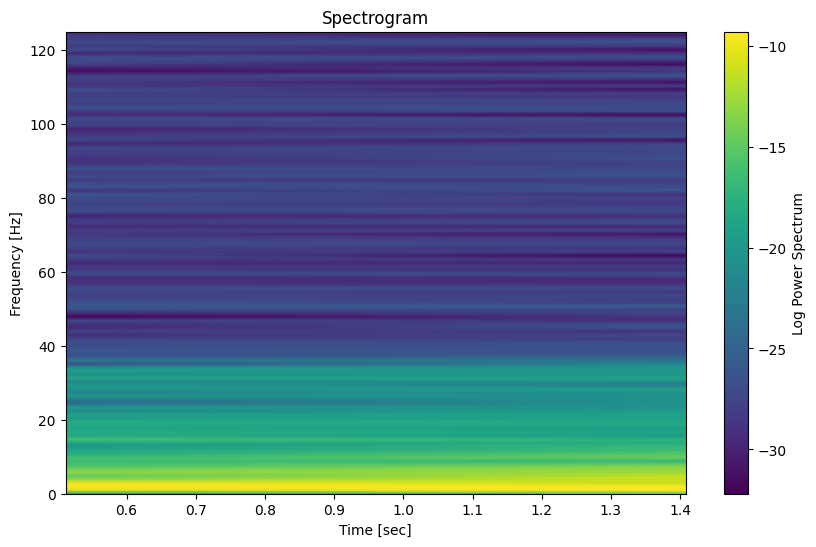



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000002             [0.0039786271548923335, 0.004173059437519359, 0.004400510086728481, 0.0036397287539827244, 0.006743528943976772, -0.005268957765576565, 0.007084553668213691, -0.010228391485045375, -0.0020515789161664483, -0.0018137264543338356]
  Detail Level 1 0.000179        [2.9441692110678324e-05, 0.00021301479510349623, 0.002068118717970052, -0.004021776811482411, 0.003219646627398633, -0.00627904858156955, 3.4372337301508083e-05, -0.0011305964307500738, -0.0002400330534098686, -0.0010277499834550063]
  Detail Lev

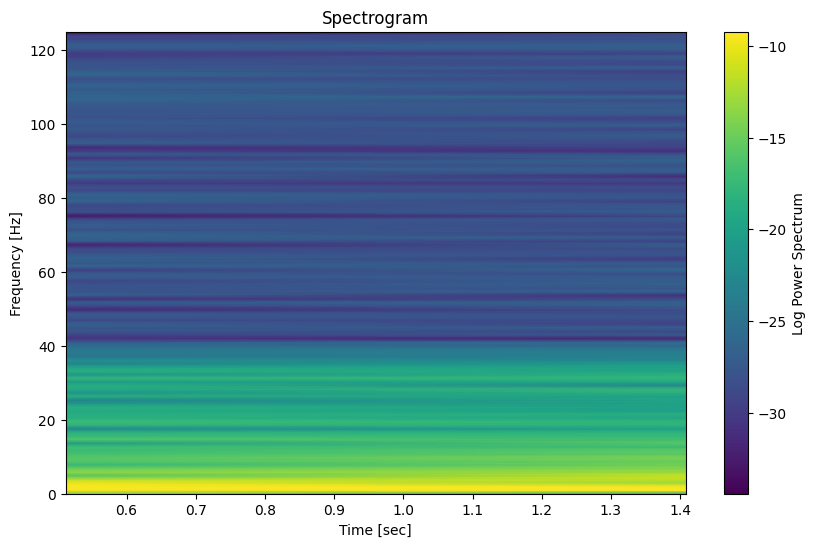



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                     Coefficient (First 10 values)
   Approximation 0.000002                       [0.016432918493810362, 0.016559216165037867, 0.0160432193046144, 0.01635542516464881, 0.017104156721706967, 0.013887217732291478, -0.029622413925901127, -0.05170653378935574, -0.049764760495203605, -0.03409021714279204]
  Detail Level 1 0.000068       [-2.5218810646559267e-05, -0.00014962270346698873, -0.0007335045501545165, -0.0036197925656324633, 0.0009608214824180677, -0.005059626951409488, -0.001387705713024172, 0.002669018259600357, -0.003004360366237624, -0.003526181158625078]
  Detail 

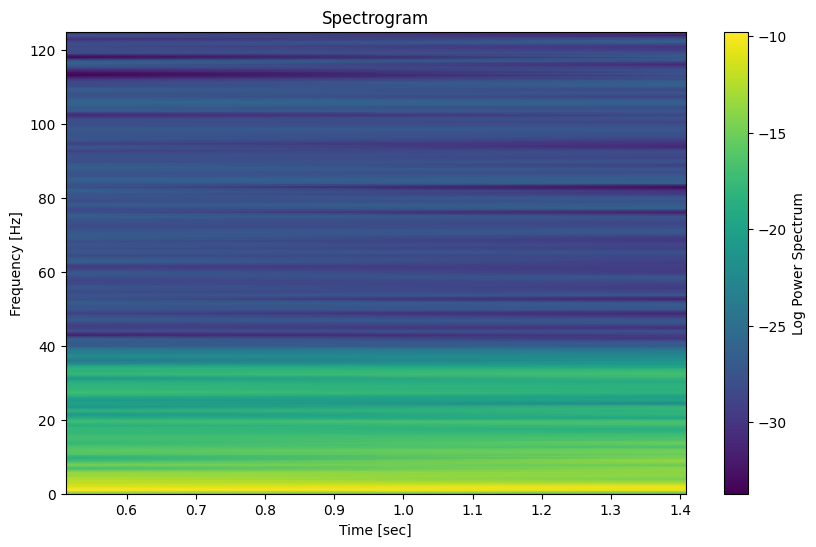



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000002                     [0.027861153464481994, 0.027959874904047395, 0.027943893682096606, 0.02775975776451533, 0.028842584569527645, 0.024295562613302076, -0.03248544368257788, -0.04068412447092518, -0.03196434605082265, -0.024248554739619996]
  Detail Level 1 0.000038       [5.717909686596152e-06, 6.609541948736852e-05, 0.0007869090127768463, -0.0007580942524998766, 0.003600985119794652, -0.0037322074338414822, 2.2499071377814428e-05, 0.0034509554982562855, -0.0028091985243189656, -0.0012384656693447068]
  Detail Lev

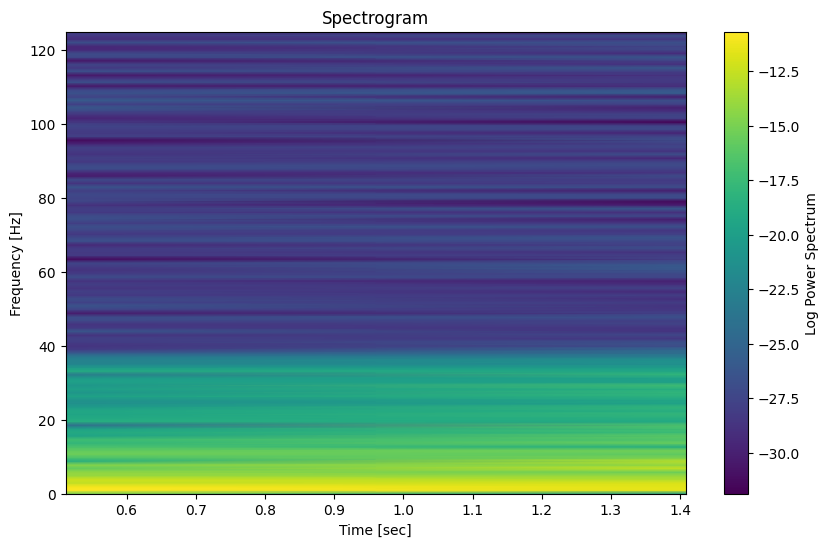



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type          MSE                                                                                                                                                                                                                   Coefficient (First 10 values)
   Approximation 5.953911e-07                  [0.011162137841028055, 0.011275572021644207, 0.01153369530498519, 0.010972407984300497, 0.01279315616234342, 0.005773582998382312, -0.005835790018364945, -0.005524847733052104, -0.012590330480709991, -0.019630217301407384]
  Detail Level 1 6.751018e-06         [2.624126900733768e-05, 0.00019326859507587282, 0.0016920781443546466, -0.001090060354943665, 0.0028510454647182573, -0.001822743745366459, 0.0015537910318427133, 0.0004376155829725198, 0.000569968292577821, -0.0005193121821894863]
  D

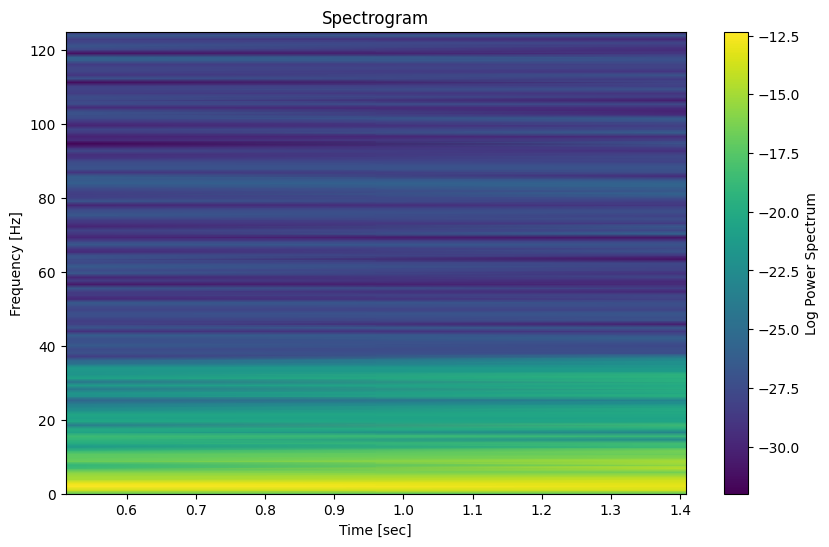



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                      Coefficient (First 10 values)
   Approximation 0.000001                        [0.009763999881602217, 0.009928754460935897, 0.00981525603054854, 0.009605738271848492, 0.011167838347976267, 0.005043672202807331, 0.021635509375371693, 0.015877600836960153, 0.027360406260400066, 0.039357858923012454]
  Detail Level 1 0.000104         [-1.1677478524230213e-05, -2.398701543306967e-05, 0.0007769941413113779, -0.0021341976650534485, 0.0019365361090189206, -0.00419522558813448, -0.0016437704882454284, 0.0004979337269351749, -0.0011186596360211122, 0.001797939045730418]
  Deta

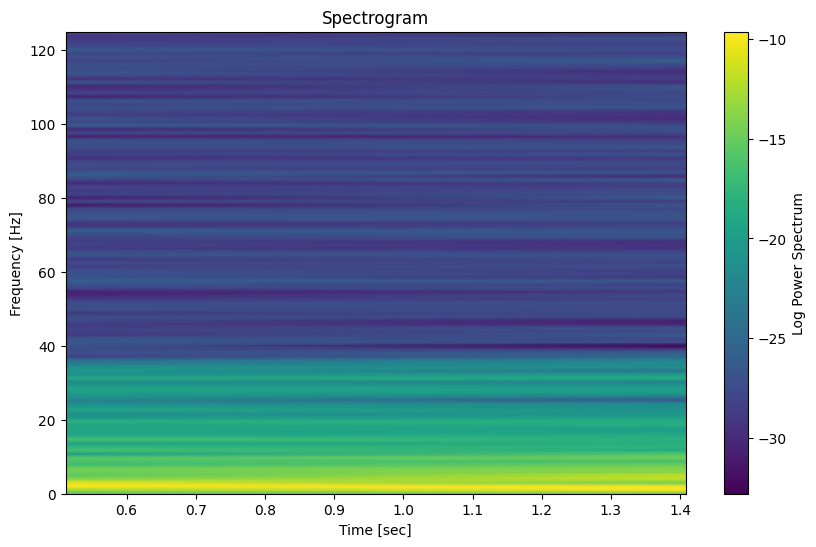



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                       Coefficient (First 10 values)
   Approximation 0.000002               [-0.011617173923579189, -0.011432075223919626, -0.011136006737270696, -0.011900075164389658, -0.009167757716465792, -0.01972254858651217, -0.020343410308760353, -0.025807059221742527, -0.023073862744502592, -0.012254978938615175]
  Detail Level 1 0.000122          [3.3912586257106944e-05, 0.00022714545843105285, 0.0021407228078993024, -0.002695957531627078, 0.0027724720312791522, -0.00557152449005398, -0.0011560784051294452, 0.0010390916168448174, -0.0033189116780250527, -0.0009287342834426431]
  D

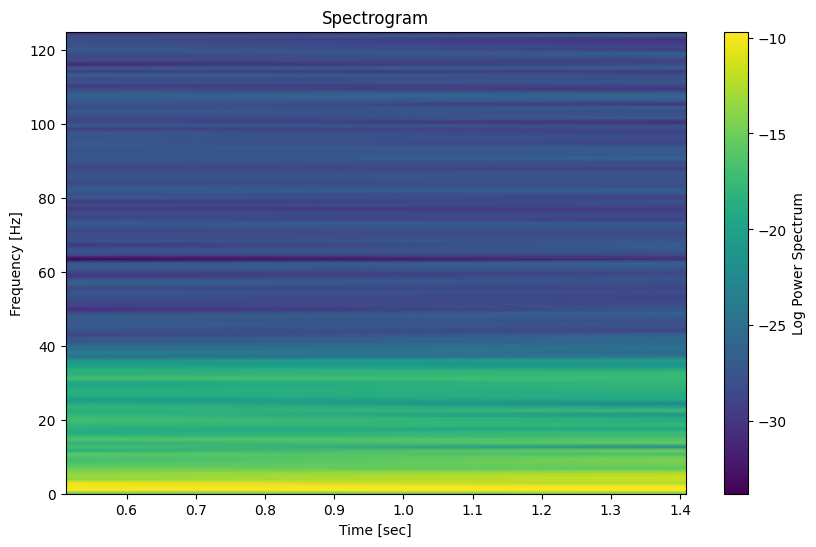



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                       Coefficient (First 10 values)
   Approximation 0.000002                  [-0.0028374130521443, -0.0026149792415409373, -0.002730275152196485, -0.00298201959249723, -0.0012328051666471238, -0.008278110322347576, -0.02465518988941807, -0.05108376020027729, -0.04877350591430468, -0.037663646592192145]
  Detail Level 1 0.000108            [-1.2885112795346586e-06, 1.652071612997321e-05, 0.0010527194010251685, -0.001770652386395908, 0.002835029159555758, -0.00604451284004608, -0.0026469190686541667, 0.005504521803170489, -0.0033793336188620905, -0.0025706949312225215]
  D

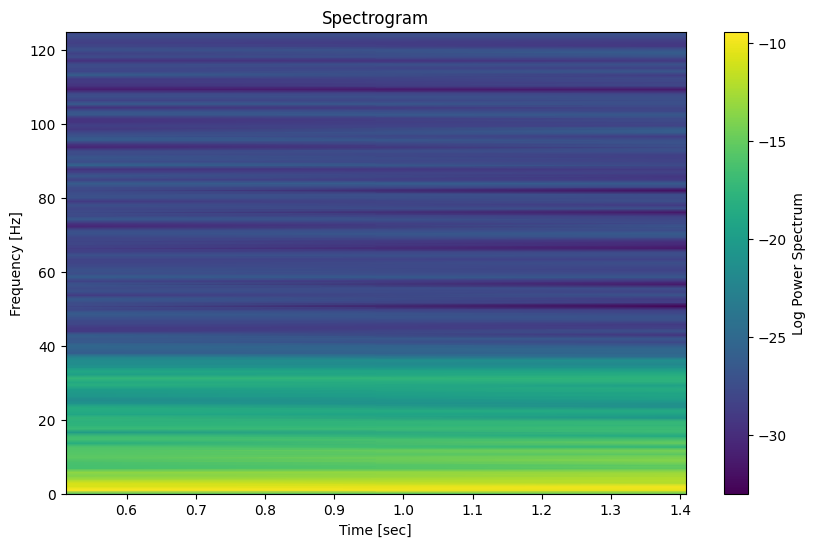



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00002)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                  Coefficient (First 10 values)
   Approximation 0.000016                   [0.014097824220718643, 0.014263737984483943, 0.0137241268346525, 0.014033682647468348, 0.014940642756075095, 0.010722032903461949, -0.029173659845856067, -0.04159816506009679, -0.04840331923322284, -0.038954987230369914]
  Detail Level 1 0.000064    [-4.393202203285166e-05, -0.00020658309442031085, -0.0004462632529877003, -0.002367325115072019, 0.005768091757988972, -0.0020521259099712413, -0.0011866530753493673, 0.003083065157189403, -0.002758796435814535, -0.0009160391345056332]
  Detail Level 2 0

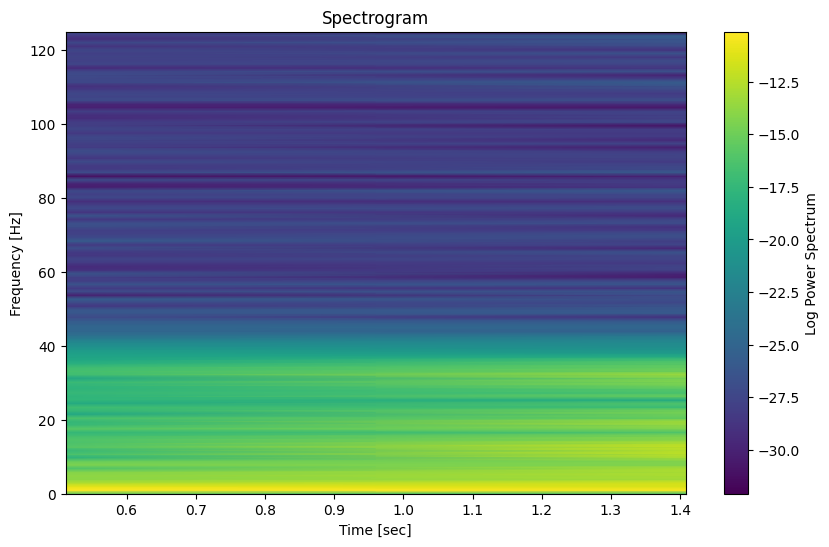



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000002             [0.0015969393579712233, 0.0017348531343797822, 0.0016837126056487156, 0.0015242804958487545, 0.002472864914037064, -0.0012886730410331016, -0.018356306180005205, -0.0263355832188287, -0.037620182873636325, -0.044600701674608216]
  Detail Level 1 0.000033        [1.4191864383881698e-06, 4.289048231952112e-05, 0.0008271753761856578, -0.0003656451073549444, 0.0015654743041661665, -0.002724403299236889, 0.0013059679175436703, 0.0034979588783568636, 0.0002717821053488621, -0.0017244293385793585]
  Detail Lev

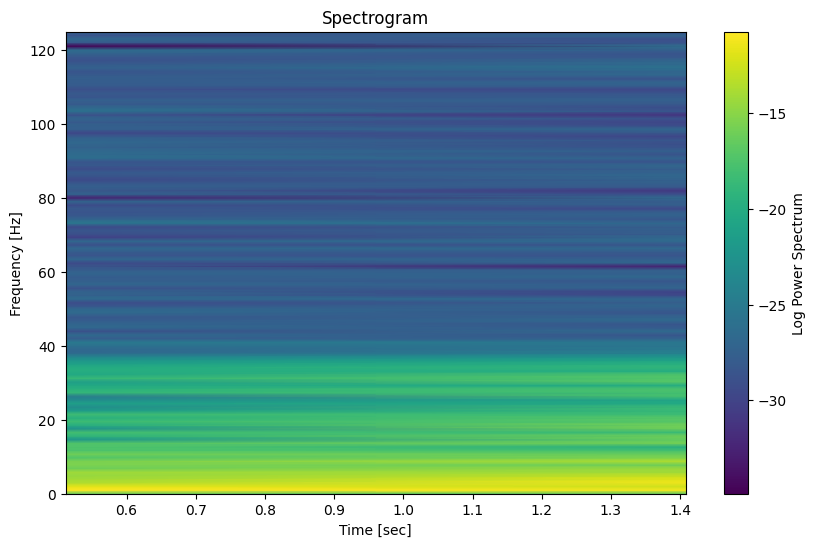



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                        Coefficient (First 10 values)
   Approximation 0.000001              [-0.003838338078913617, -0.0036506102069858467, -0.0036819805166410763, -0.003996590442164525, -0.0021994635991101964, -0.009590755772773662, 0.011204741529497879, 0.013176357232503474, -0.012466752997509094, -0.024057467884105295]
  Detail Level 1 0.000072             [-3.7508756612090465e-06, 4.128344783154571e-05, 0.001236272143379727, -0.001424231135742541, 0.004622531752838559, -0.0056643429061655455, -0.0020647703873592853, 0.004970118518265083, -0.0022732821976725955, 0.0014581954641142835]


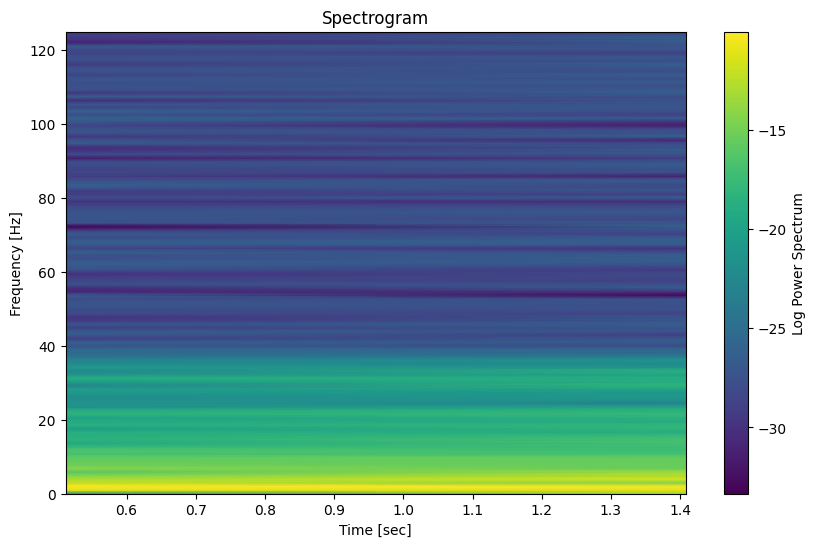



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                   Coefficient (First 10 values)
   Approximation 0.000003            [-0.011207484606849862, -0.010964014719130796, -0.011041794328494664, -0.011400853365303101, -0.009160122750145931, -0.018321268863906358, -0.018111324553473144, -0.01696299297045557, -0.036938228956847244, -0.03345153760982745]
  Detail Level 1 0.000099         [-1.2333141416836878e-06, 5.200376045520201e-05, 0.0014422383045005404, -0.002014466597244619, 0.005573432897622601, -0.005867676664488358, -0.0018362706974811563, 0.003601812703536577, -0.003930694713735612, -0.000172347477469998]
  Detail Level 

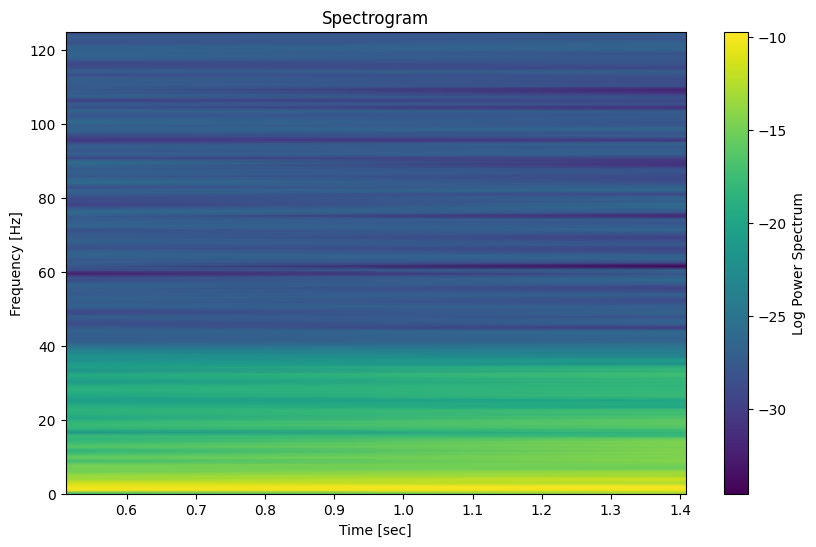



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                    Coefficient (First 10 values)
   Approximation 0.000002                   [0.006459345297016665, 0.006645057200131798, 0.006210588345859283, 0.006438519735191476, 0.0071320790145717895, 0.003846634298518316, -0.024563666250965923, -0.043187192244415834, -0.05189457774889479, -0.0465328943070573]
  Detail Level 1 0.000053     [-3.354563698532034e-05, -0.00015954694839918394, -0.0001153427371791129, -0.0010742255878452703, 0.003947108588691496, -0.004044421860802345, 0.0017113147279040177, 0.0029878629991376914, -0.0008787633801194703, -0.0015747987360639555]
  Detail Lev

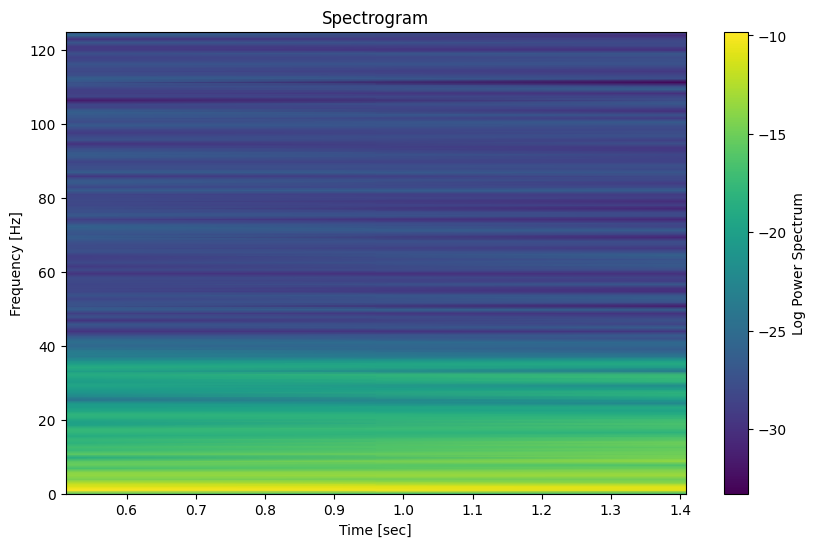



Class: Electrographic_Seizures

Most similar coefficient to original signal: Approximation (MSE: 0.00000)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                   Coefficient (First 10 values)
   Approximation 0.000002                  [-0.004926547372101439, -0.0047478234196774, -0.005100531295522436, -0.004958698996551426, -0.004144980934257147, -0.007961746214766476, -0.0147127096286403, -0.02892759876798616, -0.0475442133831163, -0.05124920714112138]
  Detail Level 1 0.000073   [-2.2424573994342028e-05, -0.00011494229428455499, 2.564193504541468e-05, -0.0011760823344179635, 0.003946935981296169, -0.005698001955582013, -0.0002979943149159813, 0.0036905489069674964, -0.0021744297611482875, -0.0020897800117616857]
  Detail Level 

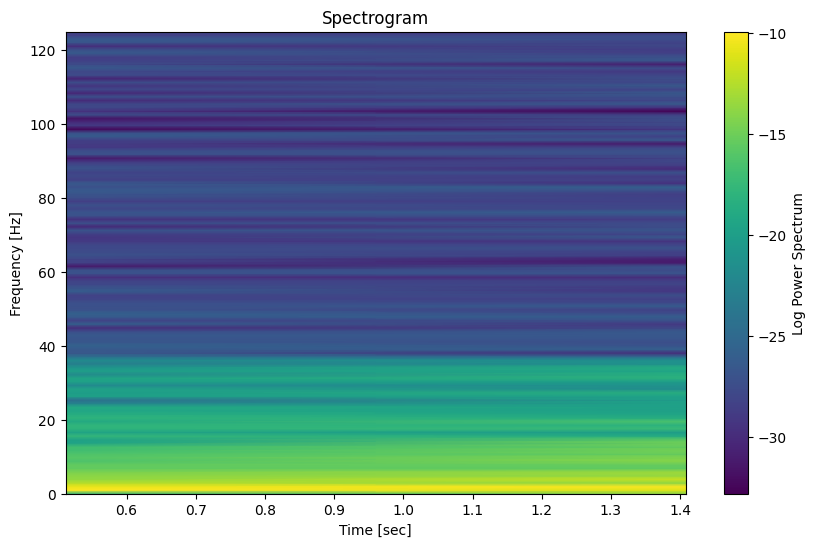



Feature Table:Electrographic_Seizures
    FFT Mean  FFT Std Dev  Peak Frequency  Approx Energy  Detail Energy Level 1  Detail Energy Level 2  Detail Energy Level 3  Detail Energy Level 4  Zero Crossing Rate
0   0.078662     0.344288             2.0       0.142474               0.001353               0.000185               0.000023           6.799103e-07                12.0
1   0.069918     0.269819             2.0       0.080660               0.000954               0.000117               0.000015           4.102171e-07                15.0
2   0.050997     0.210722             2.0       0.060038               0.001147               0.000138               0.000011           2.057924e-07                14.0
3   0.071913     0.235536             0.5       0.064430               0.000733               0.000131               0.000007           1.325851e-07                14.0
4   0.062490     0.241300             1.0       0.063200               0.000822               0.000067             

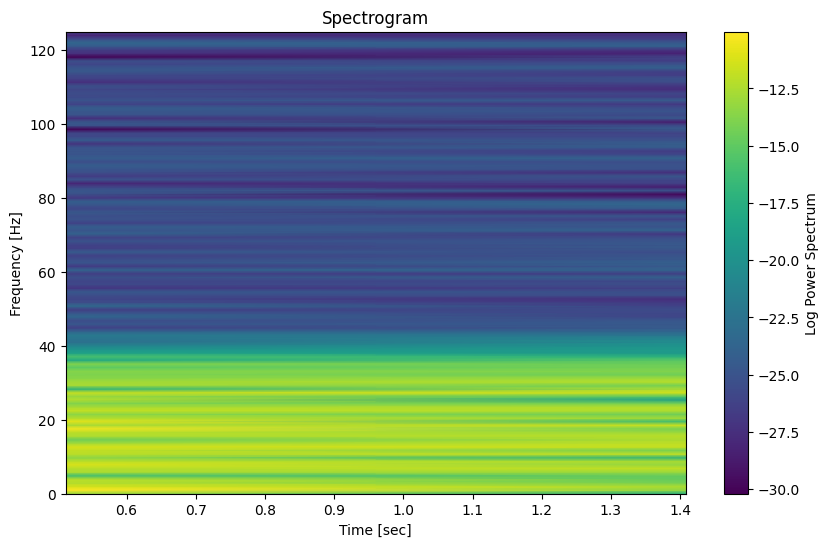



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Approximation (MSE: 0.00012)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                               Coefficient (First 10 values)
   Approximation 0.000124              [0.026321524528784206, 0.028756815009199386, 0.025511547031718037, 0.025815858386288335, 0.031325531555442744, 0.015415420342310433, 0.00023949093871878345, -0.02469019809427343, -0.00375237888802078, -0.04570642698498323]
  Detail Level 1 0.000233            [-0.0008295135796383365, -0.0035082349999023053, 0.009453277499595372, 0.032507896541276886, 0.01644034907254208, 0.03559182458411939, 0.006464808226048424, -0.05804118725318216, -0.019045308315227646, 0.00339796506859184

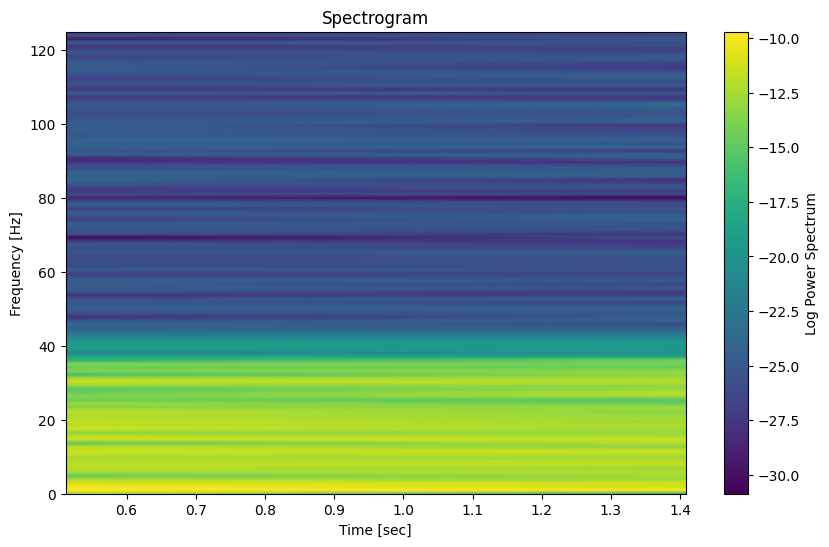



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Approximation (MSE: 0.00010)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                Coefficient (First 10 values)
   Approximation 0.000104                      [0.030768551976987087, 0.03233873571109866, 0.029317650190408794, 0.03101860511425383, 0.03311558495195574, 0.02695675811967453, 0.06667413997703464, 0.05219563610695217, 0.03528131585454156, 0.00038821172727051406]
  Detail Level 1 0.000117             [-0.0003809425769020181, -0.001751964092539807, 6.458793049544958e-05, 0.0035491835247532977, 0.007766310832527931, 0.05438694339784708, 0.02211648651465243, -0.02695406890387097, -0.005578455261369904, 0.0015414576669

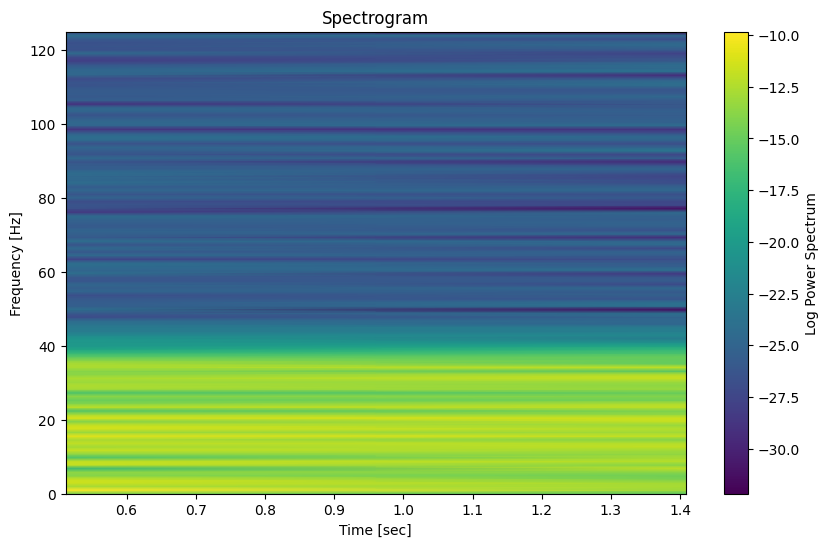



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Approximation (MSE: 0.00007)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                 Coefficient (First 10 values)
   Approximation 0.000067               [-0.008048921802794318, -0.008281112839708244, -0.011437906309879656, -0.0066894643892883975, -0.01690104555604543, 0.01833221707121645, 0.004405250899697052, 0.03438418150362776, 0.006971251881307914, 0.019132748971730416]
  Detail Level 1 0.000075           [-0.0005122900952086851, -0.0023508135722938865, -0.01253555411650557, 0.001345563941878575, 0.003842890787151256, -0.0020964856580566724, -0.0009632816628715565, 0.01103065944688735, 0.008136093677526521, 0.0107140832

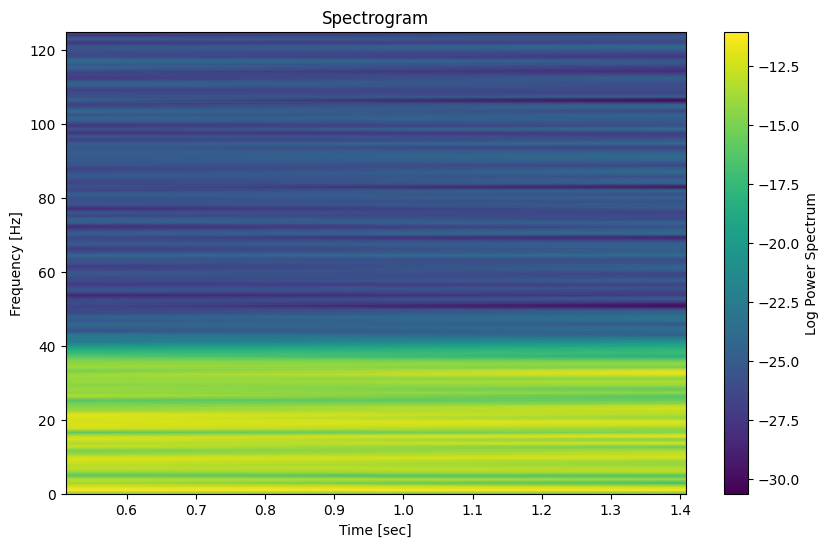



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Approximation (MSE: 0.00002)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                      Coefficient (First 10 values)
   Approximation 0.000019                 [0.002412566633803818, 0.001255442265754368, 0.0017464417807407078, 0.0024978139388808465, -0.0010775268926368343, 0.010985335262609225, -0.0034623885415173794, 0.03458863145625215, 0.0008798678433360506, 0.017138090648483754]
  Detail Level 1 0.000039              [-4.956465524358167e-05, -0.0003597434692362158, -0.006687435992954751, -0.00957826365748193, 0.0015687726938142725, -0.0013378287793581005, -0.011327616979557902, 0.024403671707761598, 0.00981249427953076

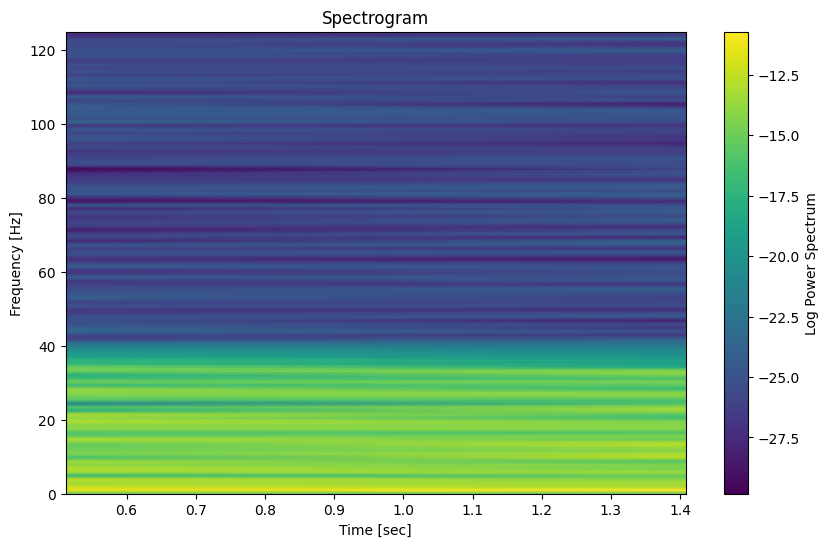



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Approximation (MSE: 0.00006)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                            Coefficient (First 10 values)
   Approximation 0.000062     [-0.008617953967165371, -0.010796177037048474, -0.008233412778580885, -0.008874298741194305, -0.012778339149693979, 0.0010987677752883106, -0.016466865664514677, 0.04317171801949463, -0.012887765544259262, -0.005315875003560061]
  Detail Level 1 0.000089         [4.419550727886145e-05, 0.0005052699940317231, -0.00575482105625228, -0.01452294400568839, -0.006114037825623727, -0.010330496636672695, -0.01669235006468605, 0.046860034020660295, 0.006131125287749852, 0.015242061649384712]
  Det

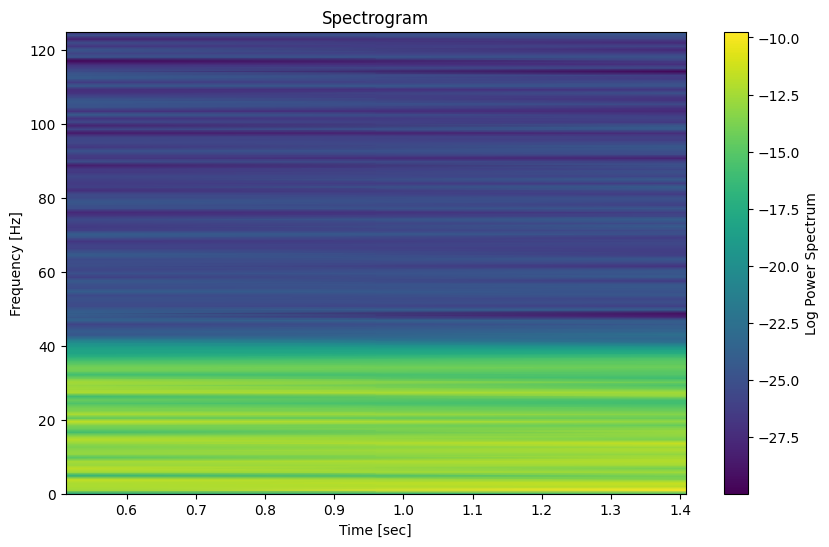



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Approximation (MSE: 0.00004)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                  Coefficient (First 10 values)
   Approximation 0.000037               [0.006908047793024095, 0.005262375121800882, 0.0073011573502440585, 0.006130077774408516, 0.007075964507679788, 0.001610131473520912, -0.016130673759718404, -0.010330531965814757, -0.04134870221087264, -0.031721205452905396]
  Detail Level 1 0.000101       [-3.9788561356268455e-05, -0.0003103065563993244, -0.004627020102712391, -0.016599425282121143, 0.013485617181196953, -0.006353170333203186, -0.00047918849819102854, -0.008981037928112251, 0.0003335857386921044, 0.016857

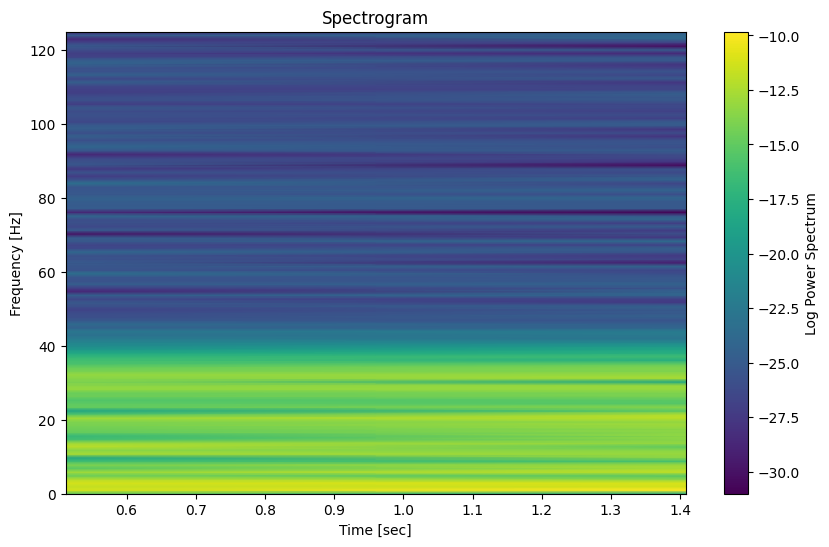



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Detail Level 2 (MSE: 0.00027)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                        Coefficient (First 10 values)
   Approximation 0.000292                [0.03480357244979286, 0.02911923004701073, 0.030634050888320285, 0.03261423117022113, 0.02577425008853389, 0.05519952078684029, 0.024112112820508364, 0.055845871450621434, 0.04523694216689307, 0.10698497787786398]
  Detail Level 1 0.000299    [-0.0008800778700947137, -0.006249578112941597, -0.03531253616780884, -0.059351955331445334, 0.010151972001707988, 0.08796307071808106, -0.012161889397584152, -0.027087852532694325, 0.005628979689703466, 0.052000006481169606]
  Detail Level 2

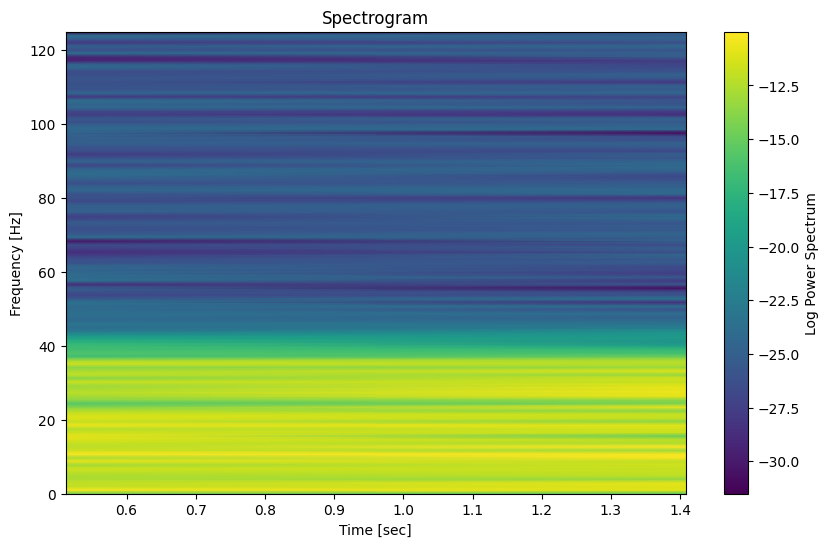



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Detail Level 2 (MSE: 0.00049)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                 Coefficient (First 10 values)
   Approximation 0.000776                            [0.10898023640939672, 0.10814094003863164, 0.1092895767233722, 0.10528981740052268, 0.12491283715233986, 0.05687820331392948, 0.01892059631999658, 0.015772055277377444, 0.03590826947287235, 0.03370327446806735]
  Detail Level 1 0.000615                 [-0.0005460551164107735, -0.0036584274020351, -0.006108326771226684, -0.06449833580388165, -0.0048319460042065745, 0.038641819402735755, -0.0118863594158848, -0.027381041472523796, 0.07595868276367986, 0.1222887

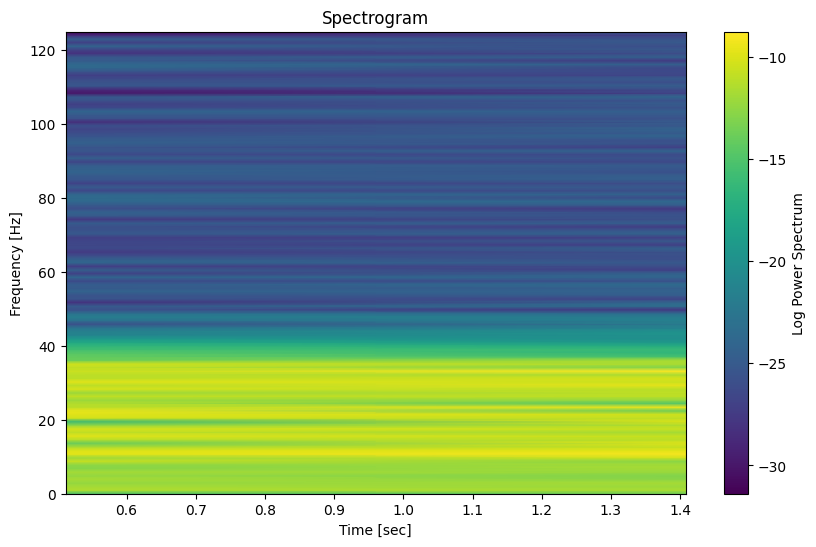



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Detail Level 2 (MSE: 0.00001)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                               Coefficient (First 10 values)
   Approximation 0.000016                  [0.012376351158129071, 0.013009059683253988, 0.01236499127945511, 0.01321200403866285, 0.012006197546436899, 0.01360256638337582, 0.017546445503023245, 0.01410196333124417, 0.004808442586248014, -0.0005179304912970672]
  Detail Level 1 0.000019  [0.00024247635202747405, 0.0009218999355878857, -0.0003223482369217163, 0.0018182660516285049, 0.008679674704757147, 0.006726397624591902, -1.5040538432206933e-05, -0.0021008978599807706, -0.003018676841720523, -0.0076393712143979

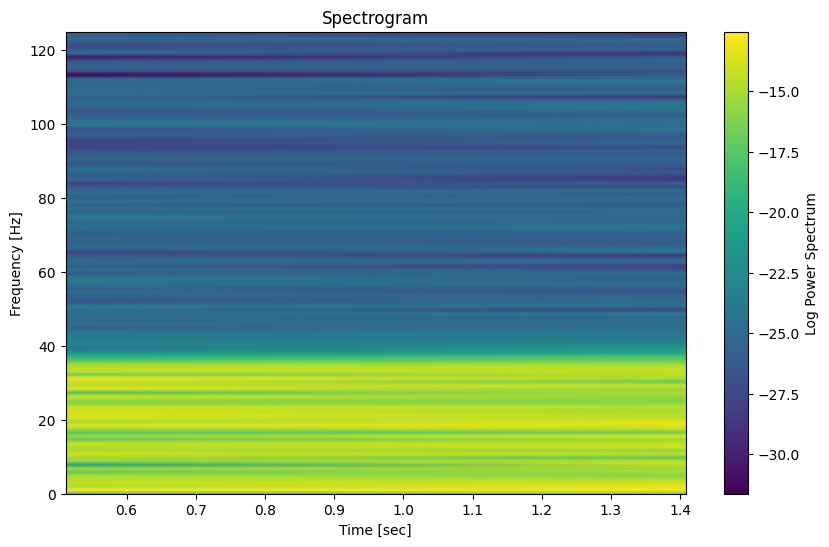



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Approximation (MSE: 0.00001)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                      Coefficient (First 10 values)
   Approximation 0.000006             [-0.0028325657163622633, -0.0038411031306415143, -0.0019949924304959905, -0.002798274827400364, -0.005403505492911444, 0.003910113375366376, 0.004987363991563531, 0.021071086559915596, -0.015938303440581898, -0.046177144351949403]
  Detail Level 1 0.000045              [0.0001328778514505095, 0.0007262036144364786, -0.0004964052705457052, 0.001276513952050687, -0.002766173626853847, -0.011982386852240252, 0.0016165990083731136, 0.0101846456914509, -0.0030102398784084498,

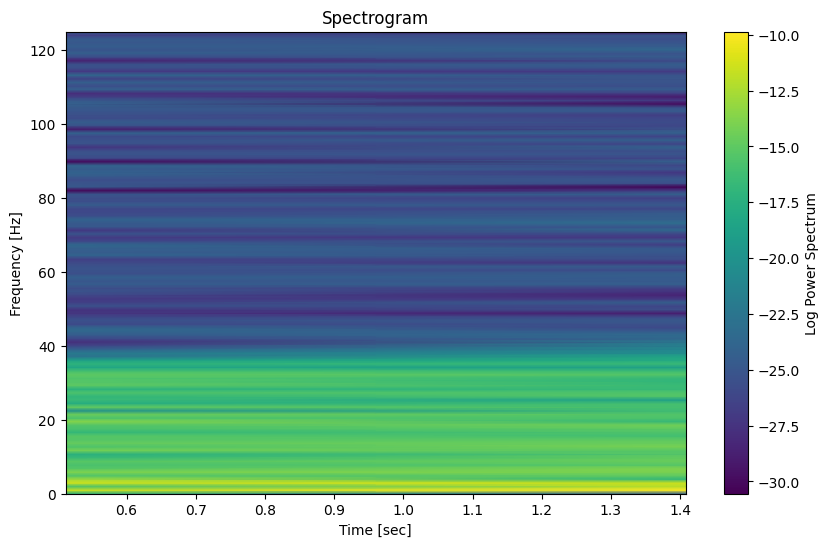



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Detail Level 2 (MSE: 0.00045)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                            Coefficient (First 10 values)
   Approximation 0.000714                   [0.05456787452240385, 0.05524239871293871, 0.04905823451443148, 0.05109369436548729, 0.07155265147434046, -0.009599580119222021, 0.015864301798351653, 0.02219172858691253, -0.04550779143549133, 0.01081235024916996]
  Detail Level 1 0.000588       [-0.0016777452436217816, -0.006349968057089205, -0.009017726134406785, -0.07053236884771508, 0.04977054078390092, -0.029993932550162423, -0.045967621291619534, -0.013976339776636015, 0.0008313628049955132, 0.06022370005437217]
  De

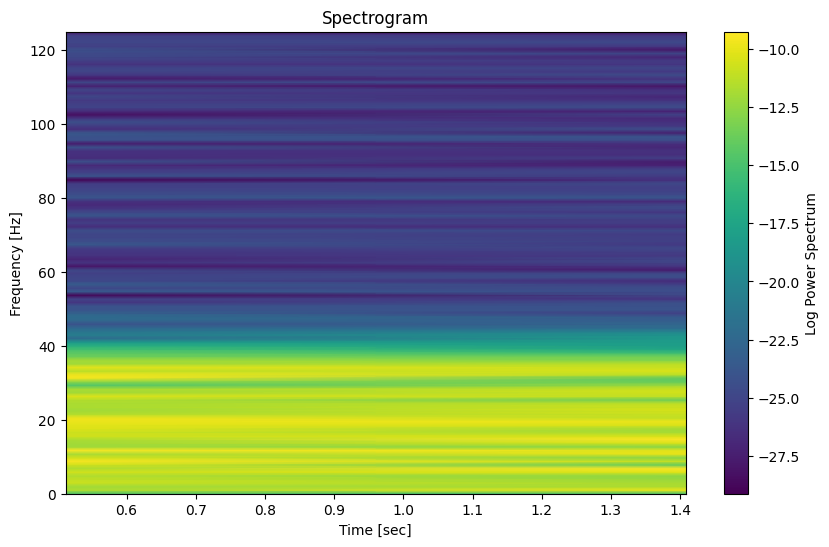



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Detail Level 2 (MSE: 0.00042)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                Coefficient (First 10 values)
   Approximation 0.000857               [-0.050660549729178564, -0.06659664258423297, -0.05097220820462304, -0.052783324870118206, -0.08133423494774955, 0.012368820725437091, -0.016283461724814426, 0.02084259529614954, 0.04414589626749593, -0.001446899587029309]
  Detail Level 1 0.000808             [0.0007282884322495926, 0.0017344776842749352, -0.05502482826577642, -0.10054105341075126, 0.030353321401726023, -0.08729267031933988, -0.014168419621804257, -0.00661975989867618, -0.05528763739012573, -0.017700439650

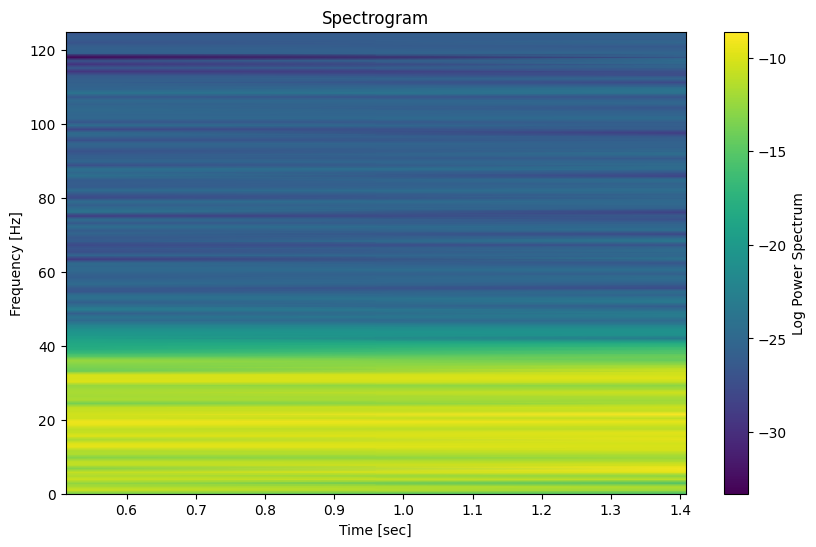



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Detail Level 2 (MSE: 0.00020)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                 Coefficient (First 10 values)
   Approximation 0.000272                   [0.015430819505867685, 0.012985506604713466, 0.01774882627958159, 0.015686760991682758, 0.010786931419067301, 0.026081830381702625, 0.005348133053194646, -0.012529078870082316, 0.027115368293491267, 0.06606668844358511]
  Detail Level 1 0.000268         [0.0007674578915868186, 0.0023684971850802287, -0.004594986552597375, -0.0011809172554158244, 0.023342359394361273, 0.03462828205051841, -0.015295259607688572, 0.0013204808188209687, -0.0023847112958775693, -0.002776929

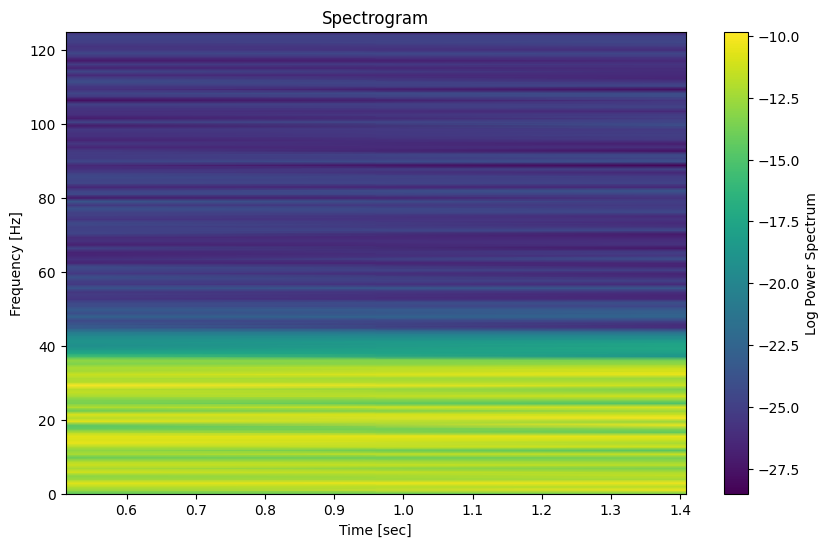



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Approximation (MSE: 0.00001)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                 Coefficient (First 10 values)
   Approximation 0.000011             [0.0009785330152814482, 0.0014144415770520188, 0.000913717050720478, 0.0013997583856336514, 0.001107526822029342, 0.00035477061134899196, -0.001111167832933053, 0.007213507376374611, 0.02016406157564237, 0.032595981603511195]
  Detail Level 1 0.000017      [0.00011384573698476718, 0.00040186963309905735, 0.00027469893138915377, 0.002829178768784176, 0.009560078626924406, 0.005166248689744308, -0.0034884382765261886, 2.812717165762599e-05, -0.0070079181349122855, -0.0058335795

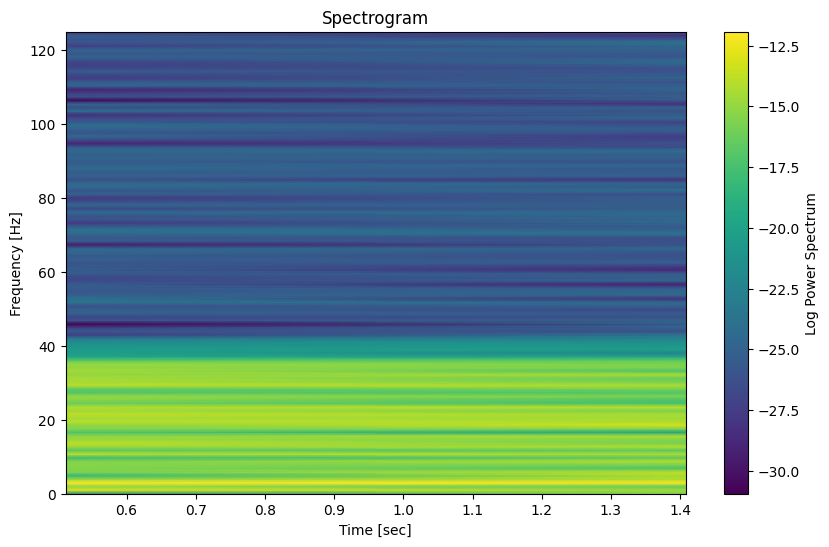



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Approximation (MSE: 0.00001)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                                        Coefficient (First 10 values)
   Approximation 0.000006           [-0.0026794518197111625, -0.003396710753832835, -0.0010669738706678908, -0.0028244333203738614, -0.0031206701013601727, -0.0017889710453506211, -0.011578498418022658, 0.00510544881623998, -8.441514849120806e-05, -0.013689511205259368]
  Detail Level 1 0.000016                [0.00024932177997454973, 0.001276829521929205, 0.0028973969914512674, 0.002733024865439442, -0.004243078463398773, -0.010145549518727773, 0.0052729226456587255, 0.006289067135889987, -0.0031492076151

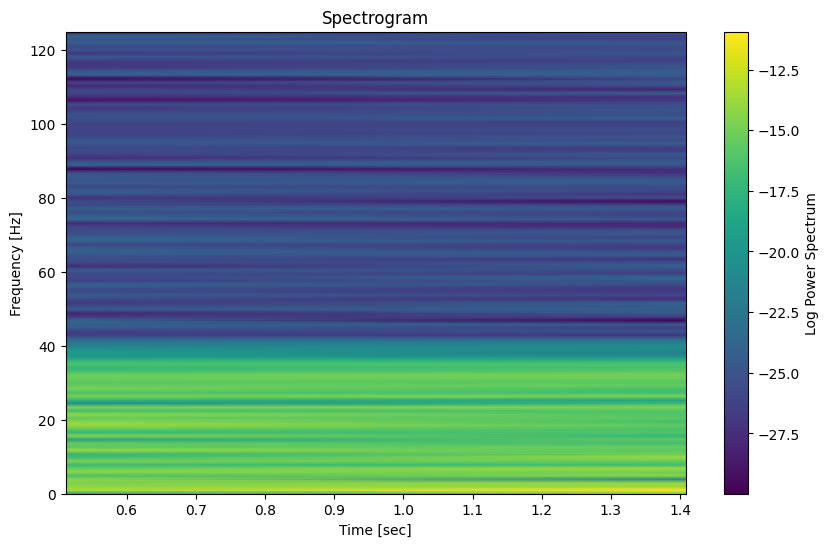



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Detail Level 2 (MSE: 0.00026)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                             Coefficient (First 10 values)
   Approximation 0.000511                  [-0.1212623228545313, -0.13516709248729133, -0.1143713951497118, -0.12349381766415876, -0.1476227904309625, -0.0581992265177161, 0.00832787986557565, -0.012525781438166168, 0.01703823902484427, -0.029929085858718188]
  Detail Level 1 0.000467              [0.000742034648957711, 0.003095800106150017, -0.02282491229001361, -0.026612313045013908, -0.007702536770478412, -0.05950256488621623, 0.04092658852323888, 0.03598984970440808, -0.03273758930504094, -0.09250949337006653]
 

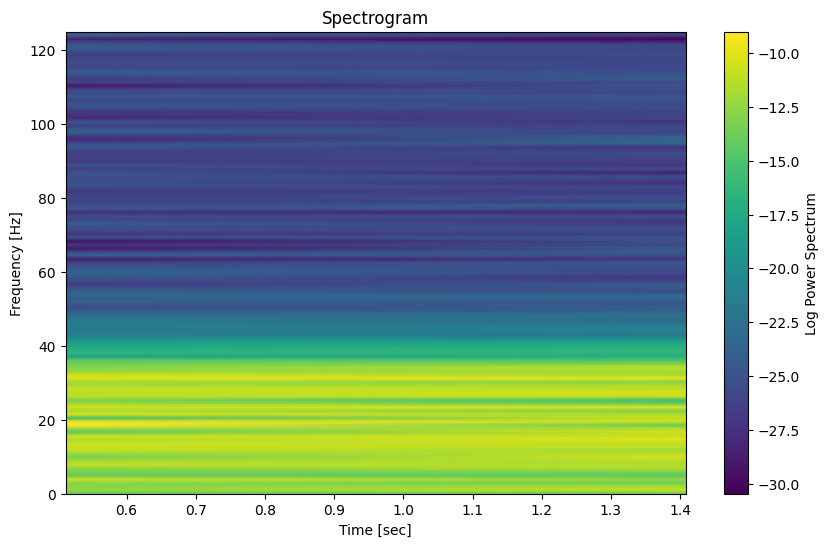



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Approximation (MSE: 0.00012)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                              Coefficient (First 10 values)
   Approximation 0.000121                    [0.04854741360760216, 0.05345127124369686, 0.04458814226450709, 0.04966120168692798, 0.05360365073590654, 0.041532263072317346, -0.025006838019326495, -0.004004512686195864, 0.03257317010505232, 0.03942975935699122]
  Detail Level 1 0.000200          [-0.00035510130628836834, -0.0014969548501117843, 0.005375036938529567, 0.015017757797451263, -0.01724604333637135, 0.009089029494724813, -0.0184470864744148, -0.0017560744805655915, 0.019076666589824785, 0.04446244213761466]

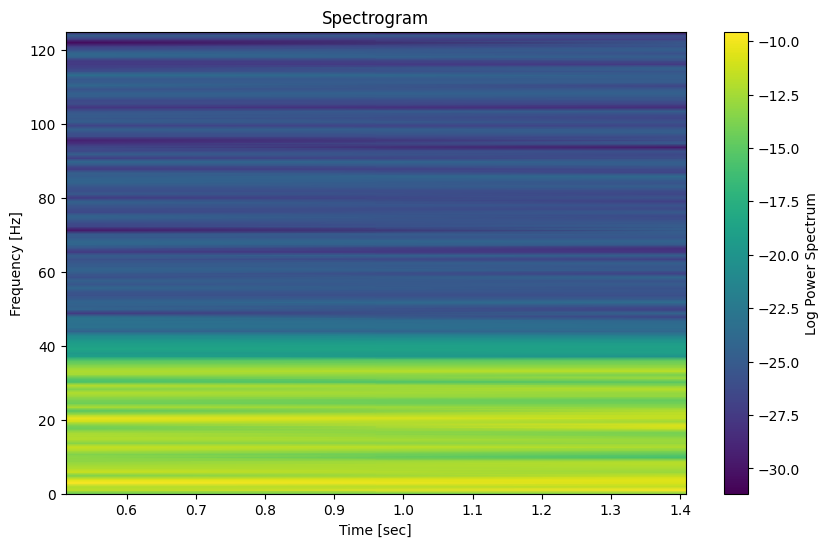



Class: Video_detected_Seizures_with_no_visual_change_over_EEG

Most similar coefficient to original signal: Approximation (MSE: 0.00005)

Wavelet Decomposition for the Channel Data (First 10 values of coefficients):
Coefficient Type      MSE                                                                                                                                                                                                              Coefficient (First 10 values)
   Approximation 0.000053               [0.04621609680117148, 0.04948244764283307, 0.043778289772755705, 0.04662436684327146, 0.049957686814933004, 0.04104583079686348, -0.003556333186489709, -0.0034592277548020824, 0.007008564691293427, -0.007078579862420488]
  Detail Level 1 0.000100        [-0.0003239966878764684, -0.0012612305863574985, 0.005805279715621437, 0.014607030816732, -0.018867676140704896, -0.005935912956635365, -0.026726013966942665, -0.0028260158800356796, 0.015162261816558904, 0.0037196743005537946]

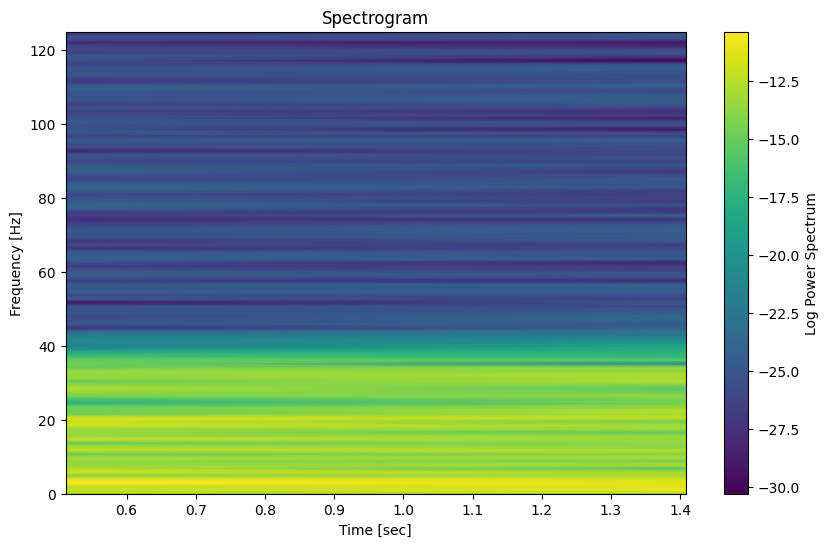



Feature Table:Video_detected_Seizures_with_no_visual_change_over_EEG
    FFT Mean  FFT Std Dev  Peak Frequency  Approx Energy  Detail Energy Level 1  Detail Energy Level 2  Detail Energy Level 3  Detail Energy Level 4  Zero Crossing Rate
0   0.144216     0.256781             0.5       0.083872               0.025220               0.026778               0.005026               0.000102                67.0
1   0.157467     0.340484             1.0       0.083467               0.027039               0.032592               0.007500               0.000143                46.0
2   0.138172     0.241240             0.5       0.033869               0.019794               0.025496               0.008069               0.000186                64.0
3   0.105134     0.198020             1.0       0.022143               0.014710               0.016518               0.005463               0.000115                73.0
4   0.067966     0.140890             1.0       0.018256               0.004871     

In [9]:
def showTableFeature(features,className):
    # Display features in a tabular format
    print("Feature Table:"+ className)
    headers = ["FFT Mean", "FFT Std Dev", "Peak Frequency",
               "Approx Energy", "Detail Energy Level 1", "Detail Energy Level 2", "Detail Energy Level 3",
               "Detail Energy Level 4","Zero Crossing Rate"]


    if isinstance(features, list):

        features = [list(feature) if isinstance(feature, (list, tuple, np.ndarray)) else [feature] for feature in features]

    # Creating a pandas DataFrame
    df = pd.DataFrame(features, columns=headers)

    # Displaying the DataFrame
    print(df.to_string(index=True))

def perform_wavelet_decomposition(channelData, wavelet='db4', level=4):
    # Perform wavelet decomposition
    coeffs = pywt.wavedec(channelData, wavelet, level=level)
    approximation = coeffs[0]  # Approximation Coefficients (Level 1)
    details = coeffs[1:]  # Detail Coefficients (Levels 2-4)
    return approximation, details

def calculate_mse(original, reconstructed):

    # Calculate the Mean Squared Error (MSE) between the original and reconstructed signal.

    if len(original) != len(reconstructed):
        raise ValueError("Original and reconstructed signals must have the same length.")
    return np.mean((original - reconstructed) ** 2)

def reconstruct_with_zeros(coeffs, wavelet):

    # Helper function to reconstruct signals by zeroing out all coefficients except one.

    reconstructed_signals = []
    for i, coeff in enumerate(coeffs):
        zero_coeffs = [np.zeros_like(c) if j != i else c for j, c in enumerate(coeffs)]
        reconstructed_signal = pywt.waverec(zero_coeffs, wavelet)
        reconstructed_signals.append(reconstructed_signal)
    return reconstructed_signals

def show_wavelet_decomposition_table(channelData, wavelet='db4', level=4):
    # Perform wavelet decomposition and show the approximation and detail coefficients in a tabular format.
    try:
        # Perform wavelet decomposition
        coeffs = pywt.wavedec(channelData, wavelet, level=level)
        approximation = coeffs[0]
        details = coeffs[1:]

        # Reconstruct the signal from each set of coefficients
        approx_reconstructed = pywt.waverec([approximation] + [np.zeros_like(d) for d in details], wavelet)
        detail_reconstructed = reconstruct_with_zeros(coeffs, wavelet)

        # Calculate MSE values
        mse_approx = calculate_mse(channelData, approx_reconstructed)
        mse_details = [calculate_mse(channelData, d_reconstructed) for d_reconstructed in detail_reconstructed[1:]]

        # Create a DataFrame to display the coefficients and MSE
        data = {
            'Coefficient Type': ['Approximation'] + [f'Detail Level {i+1}' for i in range(len(details))],
            'MSE': [mse_approx] + mse_details,
            'Coefficient (First 10 values)': [list(approximation[:10])] + [list(d[:10]) for d in details]
        }
        df = pd.DataFrame(data)

        # Display the DataFrame
        print(f"\nWavelet Decomposition for the Channel Data (First 10 values of coefficients):")
        print(df.to_string(index=False))
    except Exception as e:
        print(f"Error in show_wavelet_decomposition_table: {str(e)}")

def show_wavelet_decomposition_and_similarity(channelData, wavelet='db4', level=4):
    # Show wavelet decomposition and MSE for each channel, and indicate the most similar coefficient to the original signal.

    try:
        # Perform wavelet decomposition
        coeffs = pywt.wavedec(channelData, wavelet, level=level)
        approximation = coeffs[0]
        details = coeffs[1:]

        # Reconstruct signals to calculate MSE
        approx_reconstructed = pywt.waverec([approximation] + [np.zeros_like(d) for d in details], wavelet)
        detail_reconstructed = reconstruct_with_zeros(coeffs, wavelet)

        # Calculate MSE values
        mse_approx = calculate_mse(channelData, approx_reconstructed)
        mse_details = [calculate_mse(channelData, d_reconstructed) for d_reconstructed in detail_reconstructed[1:]]

        # Determine the most similar coefficient
        mse_values = [mse_approx] + mse_details
        min_mse = min(mse_values)
        most_similar = 'Approximation' if mse_approx == min_mse else f'Detail Level {mse_values.index(min_mse)}'

        # Display the most similar coefficient and its MSE
        print(f"\nMost similar coefficient to original signal: {most_similar} (MSE: {min_mse:.5f})")

        # Show the wavelet decomposition table
        show_wavelet_decomposition_table(channelData, wavelet, level)
    except Exception as e:
        print(f"Error in show_wavelet_decomposition_and_similarity: {str(e)}")

def showSpectrogram(channelData):
    # Generate and plot the spectrogram of the data
    f, t, Sxx = spectrogram(channelData, 250)
    plt.figure(figsize=(10, 6))
    plt.pcolormesh(t, f, np.log(Sxx), shading='gouraud')
    plt.title("Spectrogram")
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.colorbar(label="Log Power Spectrum")
    plt.show()


random_indexes = [random.randint(0, len(eeg_data['train_data'][class_name]) - 1) for class_name in class_names]
i = 0
for class_name in class_names:
    selectedDataPoint = eeg_data['train_data'][class_name][random_indexes[i]]
    i += 1
    channels = []
    j=1
    for channel in selectedDataPoint:
        print(f"Class: {class_name}")
        show_wavelet_decomposition_and_similarity(channel)
        channels.append(Extract_Channel_Features(channel, i, class_name))
        print("\nSpectrogram for channel "+str(j)+":"+class_name)
        j+=1
        showSpectrogram(channel)
        print('\n')
    showTableFeature(channels,class_name)
    print("\n" + "="*50 + "\n")


### Label Encoding of different classes of seizures in training output

In [10]:
# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the labels
print(class_names)
encoded_labels = label_encoder.fit_transform(training_output)
training_output = encoded_labels
a =set(training_output)
print(a)

['Normal', 'Complex_Partial_Seizures', 'Electrographic_Seizures', 'Video_detected_Seizures_with_no_visual_change_over_EEG']
{0, 1, 2, 3}


## Building the Baseline Model

#### Training the SVM Model

In [11]:
x_train = training_input.reshape(training_input.shape[0], training_input.shape[1] * training_input.shape[2])
y_train = training_output

svm_model = SVC(kernel='linear',probability=True)

svm_model.fit(x_train, y_train)


SVC(kernel='linear', probability=True)

#### importing validation dataset

In [12]:
### Importing validation dataset
Combined_validation_data = []
i=0
for class_name in class_names:
    for vdatapoint in eeg_data['validation_data'][class_name]:
        vchannels = []
        for channel in vdatapoint:
            vextracted_channel_features = Extract_Channel_Features(channel, i, class_name)
            vchannels.append(vextracted_channel_features)


        vchannels = np.array(vchannels, dtype=object)


        Combined_validation_data.append((vchannels, class_name))


Combined_validation_data = np.array(Combined_validation_data, dtype=object)

# Separate input (features) and output (class labels)
validation_input = np.array([data[0] for data in Combined_validation_data])
validation_output = np.array([data[1] for data in Combined_validation_data])


#### Presenting the classification report, roc auc score and balanced accuracy

In [13]:
# Flatten the validation input to match the model's expected input shape
X_valid = validation_input.reshape(validation_input.shape[0], validation_input.shape[1] * validation_input.shape[2])

# Label encoding for validation output
label_encoder = LabelEncoder()
y_valid = label_encoder.fit_transform(validation_output)



# Predict on the validation data
y_pred = svm_model.predict(X_valid)
y_prob = svm_model.predict_proba(X_valid)

# Classification Report
print("Classification Report:")
print(classification_report(y_valid, y_pred))

# ROC AUC Score (multi-class average='macro' or 'weighted')
roc_auc = roc_auc_score(y_valid, y_prob, multi_class='ovr', average='weighted')
print("ROC AUC Score: ", roc_auc)

# Balanced Accuracy Score
balanced_accuracy = balanced_accuracy_score(y_valid, y_pred)
print("Balanced Accuracy: ", balanced_accuracy)


Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.82      0.87       549
           1       0.95      0.85      0.90       137
           2       0.86      0.96      0.90       696
           3       0.89      0.81      0.85        21

    accuracy                           0.89      1403
   macro avg       0.91      0.86      0.88      1403
weighted avg       0.90      0.89      0.89      1403

ROC AUC Score:  0.9594457946349401
Balanced Accuracy:  0.8601229507378028


## Building the Best Model

##### Training the deep learning CNN model

X_train shape: (5626, 19, 9, 1)
X_valid shape: (1403, 19, 9, 1)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - accuracy: 0.7192 - loss: 0.7786 - val_accuracy: 0.8845 - val_loss: 0.3615
Epoch 2/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.8766 - loss: 0.3210 - val_accuracy: 0.9102 - val_loss: 0.2618
Epoch 3/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.9119 - loss: 0.2423 - val_accuracy: 0.9337 - val_loss: 0.1873
Epoch 4/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.9403 - loss: 0.1747 - val_accuracy: 0.9309 - val_loss: 0.1993
Epoch 5/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.9470 - loss: 0.1479 - val_accuracy: 0.9451 - val_loss: 0.1487
Epoch 6/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.9592 - loss: 0.1140 - val_accuracy: 0.9530 - val_loss: 0.1330
Epoch 7/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - accuracy: 0.9620 - loss: 0.1095 - val_accuracy: 0.9494 - val_loss: 0.1303
Epoch 8/10
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - accuracy: 0.9667 - loss: 0.0885 - val_accu

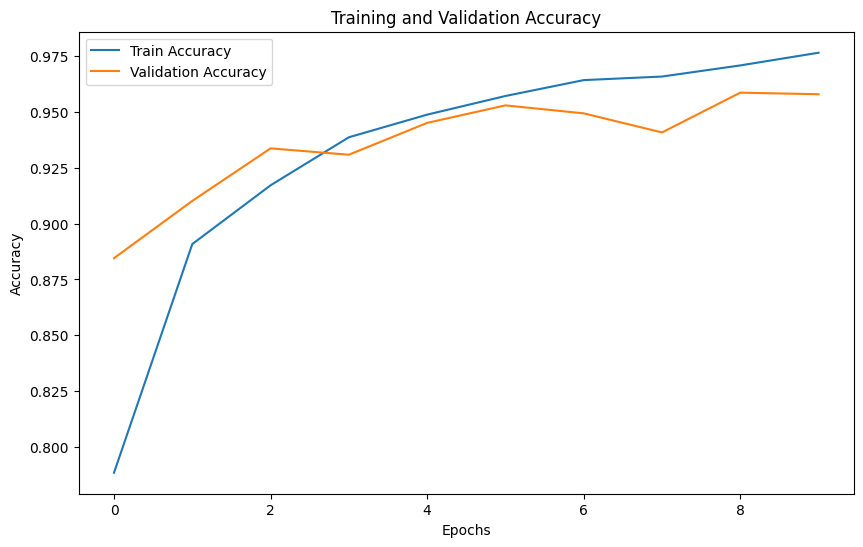

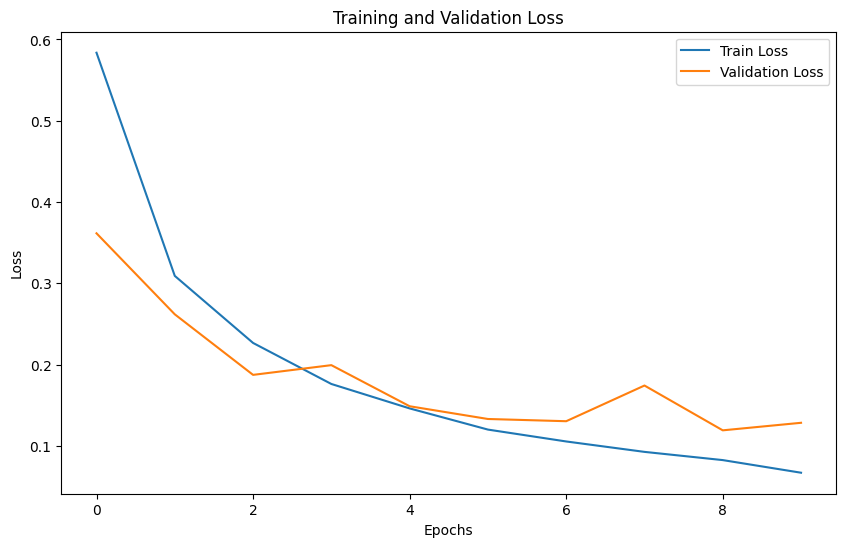

44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
ROC AUC Score: 0.9861
Balanced Accuracy: 0.9511
              precision    recall  f1-score   support

           0       0.94      0.97      0.95       549
           1       0.97      0.99      0.98       137
           2       0.97      0.95      0.96       696
           3       1.00      0.90      0.95        21

    accuracy                           0.96      1403
   macro avg       0.97      0.95      0.96      1403
weighted avg       0.96      0.96      0.96      1403



In [14]:
# One-hot encode the true labels for ROC AUC
from tensorflow.keras.losses import Huber
y_train_bin = label_binarize(y_train, classes=np.unique(y_train))
y_valid_bin = label_binarize(y_valid, classes=np.unique(y_valid))


# Reshape the input data
X_train = training_input.reshape(training_input.shape[0], training_input.shape[1], training_input.shape[2], 1)
X_valid = validation_input.reshape(validation_input.shape[0], validation_input.shape[1], validation_input.shape[2], 1)

# Reshape the data for scaling
X_train_reshaped = X_train.reshape(-1, X_train.shape[1] * X_train.shape[2])  # Flatten to 2D
X_valid_reshaped = X_valid.reshape(-1, X_valid.shape[1] * X_valid.shape[2])  # Flatten to 2D

# Initialize StandardScaler
scaler = StandardScaler()

# Fit the scaler on training data and transform both train and validation data
X_train_scaled = scaler.fit_transform(X_train_reshaped)
X_valid_scaled = scaler.transform(X_valid_reshaped)

# Reshape back to original shape (add the channel dimension)
X_train = X_train_scaled.reshape(-1, 19, 9, 1)
X_valid = X_valid_scaled.reshape(-1, 19, 9, 1)

X_train = X_train.astype('float32')
X_valid = X_valid.astype('float32')

# Check input shapes
print(f"X_train shape: {X_train.shape}")
print(f"X_valid shape: {X_valid.shape}")
y_train = np.array(y_train).astype('int32')
y_valid = np.array(y_valid).astype('int32')

# Build the CNN model
model = models.Sequential()

# First convolutional layer
model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(19, 9, 1)))
model.add(layers.MaxPooling2D((2, 2), padding='same'))  # Max Pooling

# Second convolutional layer
model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

# Third convolutional layer
model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(layers.MaxPooling2D((2, 2), padding='same'))

# Flatten the output for fully connected layers
model.add(layers.Flatten())

# Fully connected dense layer
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.5))  # Dropout to reduce overfitting

# Output layer with softmax for multi-class classification
model.add(layers.Dense(len(np.unique(y_train)), activation='softmax'))

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model using test_data
history = model.fit(X_train, y_train,
                    epochs=10,
                    batch_size=32,
                    validation_data=(X_valid, y_valid))

# Evaluate the model using validation_data
val_loss, val_acc = model.evaluate(X_valid, y_valid)
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Validation Loss: {val_loss:.4f}")

# Plot training and validation accuracy
plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Save the model
model.save('cnn_model.h5')

# Predict on validation data
predictions = model.predict(X_valid)

# Example: Convert predictions to class labels
predicted_labels = np.argmax(predictions, axis=1)

# Calculate ROC AUC Score
y_valid_bin = label_binarize(y_valid, classes=np.unique(y_valid))
roc_auc = roc_auc_score(y_valid_bin, predictions, average='macro', multi_class='ovr')
print(f"ROC AUC Score: {roc_auc:.4f}")

# Calculate Balanced Accuracy
balanced_acc = balanced_accuracy_score(y_valid, predicted_labels)
print(f"Balanced Accuracy: {balanced_acc:.4f}")

# Optional: Print a classification report
from sklearn.metrics import classification_report
print(classification_report(y_valid, predicted_labels))


#### Testing our model with test_data

In [15]:
### Importing our test data
Combined_test_data = []
i = 0

for tdatapoint in test_data:
    tchannels = []
    for channel in tdatapoint:  # Fixed variable name
        textracted_channel_features = Extract_Channel_Features(channel, i, class_name)
        tchannels.append(textracted_channel_features)

    Combined_test_data.append(tchannels)

Combined_test_data = np.array(Combined_test_data)

test_input = np.array(Combined_test_data)
test_input = test_input.reshape(test_input.shape[0], test_input.shape[1] * test_input.shape[2])
test_input = scaler.transform(test_input)
test_input = test_input.reshape(-1, 19, 9, 1)

## Predicted test data output
test_input = test_input.astype('float32')
test_output = model.predict(test_input)  # Output probabilities for each class
predicted_labels = np.argmax(test_output, axis=1)  # Convert probabilities to class labels

# Print the predicted labels
print("Predicted Labels:", predicted_labels)

# File names for the predictions
file_names = [f"test_{i+1}.npy" for i in range(len(predicted_labels))]

# Creating a pandas DataFrame with the file names and labels
df = pd.DataFrame({
    'file_name': file_names,
    'label': predicted_labels,
})

# Save the DataFrame to a CSV file
df.to_csv('test_outputs.csv', index=False)

print("\ntest_outputs.csv file has been created successfully.")

25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Predicted Labels: [2 2 0 0 2 0 0 2 2 2 0 2 2 2 0 2 2 1 1 2 2 0 2 0 0 2 0 0 0 0 1 2 2 0 0 2 2
 0 3 2 0 2 2 0 2 0 2 2 2 0 0 2 2 0 0 2 1 2 2 2 0 2 2 0 2 2 2 1 0 0 2 2 0 0
 0 2 0 2 1 2 2 2 2 2 0 1 2 2 2 1 1 2 2 2 2 2 2 0 0 0 2 1 0 2 2 0 2 2 2 2 0
 0 0 2 2 1 0 0 2 2 0 0 0 2 2 2 0 2 1 2 2 1 0 0 0 2 2 0 0 0 2 2 2 0 0 0 2 2
 1 0 2 2 2 2 2 2 1 1 2 0 2 2 2 0 0 0 2 2 0 0 0 0 2 0 2 3 1 2 2 2 2 2 2 0 2
 2 1 2 2 2 2 2 2 2 0 1 0 2 0 2 0 0 2 2 2 2 1 2 2 2 1 0 0 0 2 2 2 2 2 0 2 0
 2 0 2 2 2 0 2 2 0 0 0 2 2 0 2 2 0 2 2 0 1 2 0 1 2 2 2 2 3 2 2 0 2 2 2 2 0
 0 2 0 2 2 0 0 3 1 2 0 0 0 0 1 2 2 2 0 0 0 2 2 1 0 2 2 1 2 1 2 1 0 0 2 0 2
 1 1 1 2 0 2 0 0 0 2 2 0 0 0 0 0 2 0 2 0 2 0 0 2 2 0 0 0 0 0 0 2 2 0 2 2 2
 2 0 0 2 2 0 0 0 0 2 2 0 2 0 1 2 0 0 2 2 2 0 2 0 2 2 1 2 2 2 2 0 2 2 2 0 0
 0 2 2 0 0 1 1 2 2 0 2 0 2 2 0 2 2 0 2 1 0 0 2 2 2 2 2 0 0 0 2 2 1 0 2 2 0
 0 2 2 0 2 2 0 2 2 1 2 0 2 2 2 0 1 0 0 2 1 0 2 0 2 1 0 0 2 0 2 2 1 0 2 2 2
 0 2 0 1 2 2 2 2 2 0 0 0 0 2 2 2 2 1 2 0 2 

#### Summary of Model

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 19, 9, 32)           │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 10, 5, 32)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 10, 5, 64)           │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 5, 3, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 5, 3, 128)           │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 3, 2, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 768)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          98,432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4)                   │             516 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 574,862 (2.19 MB)

 Trainable params: 191,620 (748.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 383,242 (1.46 MB)

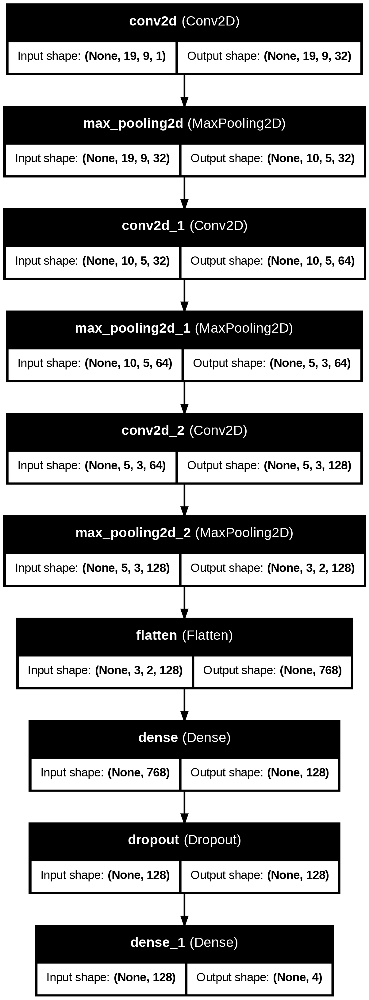

In [16]:
from tensorflow.keras.utils import plot_model
model.summary()

# Visualize the model
plot_model(model, to_file='cnn_model.png', show_shapes=True, show_layer_names=True)

## Interpretability of Best Model

##### Implementing Explainable AI with SHAP

(5626, 19, 9, 1)
Shape of SHAP values: (19, 9, 1, 4)

Top 3 channels for class 'Normal':
Channel indices: [4 9 2]
Importance scores: [0.00625921 0.00466565 0.00418969]

Top 3 channels for class 'Complex_Partial_Seizures':
Channel indices: [12 13  1]
Importance scores: [0.00562042 0.00468282 0.00426482]

Top 3 channels for class 'Electrographic_Seizures':
Channel indices: [10  4 13]
Importance scores: [0.01379959 0.00687359 0.00590578]

Top 3 channels for class 'Video_detected_Seizures_with_no_visual_change_over_EEG':
Channel indices: [ 9  2 12]
Importance scores: [0.00588082 0.00410011 0.00342953]

Overall Top 3 Channels across all classes:
Rank 1: Channel index 10 with importance score 0.019029791576037555
Rank 2: Channel index 4 with importance score 0.018254640001731874
Rank 3: Channel index 12 with importance score 0.016739747825615738


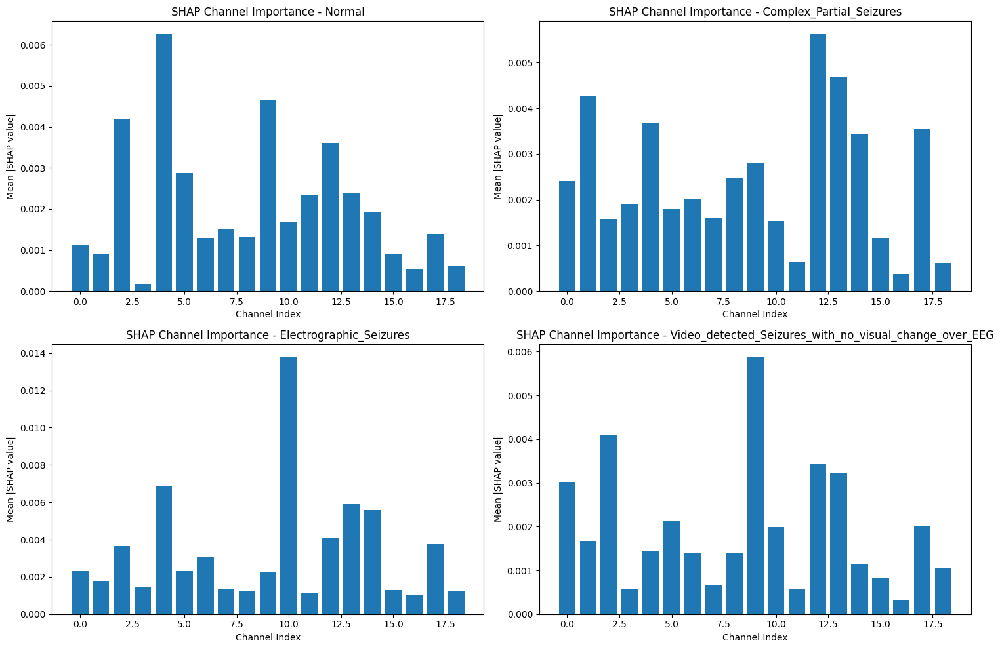

In [31]:
import numpy as np
import tensorflow as tf
import shap
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras import backend as K
import seaborn as sns

def generate_saliency_maps(model, X_sample, class_idx):

    # Generate saliency maps for a given input and class

    with tf.GradientTape() as tape:
        X_tensor = tf.convert_to_tensor(X_sample)
        tape.watch(X_tensor)
        predictions = model(X_tensor)
        class_score = predictions[:, class_idx]

    gradients = tape.gradient(class_score, X_tensor)
    saliency_maps = tf.reduce_mean(tf.abs(gradients), axis=-1)
    return saliency_maps.numpy()

def get_channel_importance(model, X_data, class_idx, num_samples=100):

    # Calculate channel importance using saliency maps

    # Random sample from the data
    indices = np.random.choice(len(X_data), num_samples, replace=False)
    X_samples = X_data[indices]

    # Generate saliency maps for the samples
    saliency_maps = generate_saliency_maps(model, X_samples, class_idx)

    # Average importance across time for each channel
    channel_importance = np.mean(saliency_maps, axis=(0, 2))
    return channel_importance

def analyze_top_channels(model, X_valid, class_names):

    # Analyze top 3 channels for each class

    results = {}
    num_classes = len(class_names)

    for class_idx in range(num_classes):
        # Calculate channel importance
        channel_importance = get_channel_importance(model, X_valid, class_idx)

        # Get top 3 channels
        top_channels = np.argsort(channel_importance)[-3:][::-1]
        importance_scores = channel_importance[top_channels]

        results[class_names[class_idx]] = {
            'channels': top_channels,
            'scores': importance_scores
        }

    return results

def evaluate_masked_performance(model, X_data, y_data, channels_to_mask):

    # Evaluate model performance with masked channels

    X_masked = X_data.copy()
    X_masked[:, channels_to_mask, :, :] = 0

    # Evaluate masked performance
    loss, accuracy = model.evaluate(X_masked, y_data, verbose=0)
    return accuracy

def plot_channel_importance(results, class_names):

    # Plot channel importance for each class

    plt.figure(figsize=(15, 10))

    for i, class_name in enumerate(class_names):
        plt.subplot(2, 2, i+1)
        channels = results[class_name]['channels']
        scores = results[class_name]['scores']

        plt.bar(range(len(channels)), scores)
        plt.title(f'Top Channels for {class_name}')
        plt.xlabel('Channel Index')
        plt.ylabel('Importance Score')
        plt.xticks(range(len(channels)), channels)

    plt.tight_layout()
    plt.show()

# Main analysis
def run_interpretability_analysis(model_path, X_valid, y_valid):
    # Load the model
    model = load_model(model_path)

    # Define class names
    class_names = ['Normal', 'Complex Partial Seizures',
                  'Electrographic Seizures', 'Video detected Seizures']

    # Get channel importance for each class
    results = analyze_top_channels(model, X_valid, class_names)

    # Plot results
    plot_channel_importance(results, class_names)

    # Evaluate impact of masking
    print("\nImpact of Channel Masking:")
    for class_name, class_results in results.items():
        channels_to_mask = class_results['channels']
        masked_accuracy = evaluate_masked_performance(model, X_valid, y_valid, channels_to_mask)
        print(f"\n{class_name}:")
        print(f"Top channels: {channels_to_mask}")
        print(f"Accuracy after masking: {masked_accuracy:.4f}")

    return results
def perform_shap_analysis(model, X_valid, class_names):
    # Perform SHAP analysis for the model

    # Creating background dataset
    background = X_valid[np.random.choice(X_valid.shape[0], 100, replace=False)]

    # Initializing SHAP explainer
    explainer = shap.DeepExplainer(model, background)

    # Calculating SHAP values for a subset of validation data
    shap_values = explainer.shap_values(X_valid[:100])

    # To store channel importance across all classes
    overall_channel_importance = np.zeros(shap_values[0].shape[0])  # Initialize with zeros (size: 19)

    # Check the shape of SHAP values to ensure we have the expected dimensions
    print(f"Shape of SHAP values: {shap_values[0].shape}")  # Expected: (num_channels, num_samples, height, width)

    # Plot SHAP summary for each class
    plt.figure(figsize=(15, 10))
    for i, class_name in enumerate(class_names):
        plt.subplot(2, 2, i+1)
        shap_class = np.abs(shap_values[i])

        # Aggregating importance across the spatial dimensions (1, 2) and the final dimension (axis=3)
        # This ensures the importance scores are computed over the channels and the final class dimension
        channel_importance = np.mean(shap_class, axis=(1, 2, 3))  # Mean over samples, height, width, and channels

        # Now the result is (19,) shape, which corresponds to channel-wise importance.
        plt.bar(range(len(channel_importance)), channel_importance)
        plt.title(f'SHAP Channel Importance - {class_name}')
        plt.xlabel('Channel Index')
        plt.ylabel('Mean |SHAP value|')

        # Get top 3 channels for the class
        top_channels = np.argsort(channel_importance)[-3:][::-1]  # Sort in descending order
        print(f"\nTop 3 channels for class '{class_name}':")
        print(f"Channel indices: {top_channels}")
        print(f"Importance scores: {channel_importance[top_channels]}")

        # Add the class's channel importance to overall channel importance
        overall_channel_importance += channel_importance  # Ensure shapes match: (19,) + (19,)

    # Getting the top 3 channels across all classes
    top_overall_channels = np.argsort(overall_channel_importance)[-3:][::-1]  # Sort in descending order
    top_overall_importance_scores = overall_channel_importance[top_overall_channels]

    # Print the overall top 3 channels
    print("\nOverall Top 3 Channels across all classes:")
    for idx, channel in enumerate(top_overall_channels):
        print(f"Rank {idx + 1}: Channel index {channel} with importance score {top_overall_importance_scores[idx]}")

    plt.tight_layout()
    plt.show()

print(X_train.shape)
# Performing SHAP analysis and print the top 3 channels for each class and the overall top 3 channels
perform_shap_analysis(model, X_train, class_names)


## Denoising

#### Importing noisy_data

In [17]:
import numpy as np
import scipy.signal as signal  # Correctly import signal
from sklearn.metrics import mean_squared_error
import math

# Function to calculate PSNR
def calculate_psnr(ground_truth, denoised_signal):
    mse = mean_squared_error(ground_truth, denoised_signal)
    if mse == 0:  # Prevent division by zero
        return float('inf')
    max_pixel = np.max(ground_truth)
    psnr = 20 * math.log10(max_pixel / math.sqrt(mse))
    return psnr

# Low-pass Butterworth filter for signal denoising
def butterworth_denoise(signal_data, cutoff_freq, fs=1000, order=4):

    # Normalizing the cutoff frequency
    nyquist = 0.5 * fs
    normalized_cutoff = cutoff_freq / nyquist

    # Design the Butterworth filter
    b, a = signal.butter(order, normalized_cutoff, btype='low')

    # Apply the filter to the signal
    denoised_signal = signal.filtfilt(b, a, signal_data)
    return denoised_signal

# Initialize variables for combined data
Combined_noisy_data = []
psnr_values = []

# Process the dataset
for class_name in class_names:
    for datapoint, ground_truth in zip(eeg_data['noisy_train_data'][class_name], eeg_data['train_data'][class_name]):
        nchannels = []
        for i, channel in enumerate(datapoint):
            # Denoise the signal using the Butterworth filter
            cutoff_frequency = 50  # Set appropriate cutoff frequency for denoising (in Hz)
            denoised_channel = butterworth_denoise(channel, cutoff_freq=cutoff_frequency)

            # Calculate PSNR for the channel
            psnr_value = calculate_psnr(ground_truth[i], denoised_channel)
            psnr_values.append(psnr_value)

            # Extract features from the denoised signal
            features = Extract_Channel_Features(denoised_channel, i, class_name)
            nchannels.append(features)

        # Append denoised features and class label
        Combined_noisy_data.append((nchannels, class_name))

# Print average PSNR
print("Average PSNR across all signals:", np.mean(psnr_values))

# Convert combined data to numpy arrays
Combined_noisy_data = np.array(Combined_noisy_data, dtype=object)
print(Combined_noisy_data.shape)
input_features = np.array([data[0] for data in Combined_noisy_data])  # Features
output_labels = np.array([data[1] for data in Combined_noisy_data])  # Labels
output_labels = label_encoder.transform(output_labels)


Average PSNR across all signals: -1.802008456588893
(5608, 2)


##### Training the model with noisy_data

In [19]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score, balanced_accuracy_score, classification_report
import numpy as np
from sklearn.preprocessing import label_binarize
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Check if output_labels are one-hot encoded, if yes, convert to integer labels
if len(output_labels.shape) > 1:
    output_labels = np.argmax(output_labels, axis=1)
x_features = input_features
# Reshape the input features for classification
x_features_reshaped = x_features.reshape(-1, x_features.shape[1] * x_features.shape[2])

# Scale the features
x_features_scaled = scaler.transform(x_features_reshaped)

# Reshape back to the original shape
x_features_scaled = x_features_scaled.reshape(-1, 19, 9, 1).astype('float32')

# Add callbacks for better training
callbacks = [
    EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True
    ),
    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=5,
        min_lr=1e-6
    )
]

# Calculate class weights dynamically
unique_classes = np.unique(output_labels)
class_weights = dict(zip(
    unique_classes,
    len(output_labels) / (len(unique_classes) * np.bincount(output_labels))
))

# Freeze the first layers
for layer in model.layers[:3]:
    layer.trainable = False

# Compile the model
model.compile(
    optimizer=optimizers.Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# First training phase
history = model.fit(
    x_features_scaled,
    output_labels,
    epochs=20,
    batch_size=32,
    validation_data=(X_valid, y_valid),
    class_weight=class_weights,
    callbacks=callbacks
)

# Unfreeze layers for fine-tuning
for layer in model.layers[:3]:
    layer.trainable = True

# Recompile with lower learning rate
model.compile(
    optimizer=optimizers.Adam(learning_rate=0.00001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Fine-tuning phase
history_fine_tune = model.fit(
    x_features_scaled,
    output_labels,
    epochs=20,
    batch_size=32,
    validation_data=(X_valid, y_valid),
    class_weight=class_weights,
    callbacks=callbacks
)

# Save the final model
model.save('cnn_model_final.h5')

# Evaluate on validation data
predictions = model.predict(X_valid)
predicted_labels = np.argmax(predictions, axis=1)

# Calculate metrics
y_valid_bin = label_binarize(y_valid, classes=np.unique(y_valid))
roc_auc = roc_auc_score(y_valid_bin, predictions, average='macro', multi_class='ovr')
print(f"ROC AUC Score: {roc_auc:.4f}")

balanced_acc = balanced_accuracy_score(y_valid, predicted_labels)
print(f"Balanced Accuracy: {balanced_acc:.4f}")

print("\nClassification Report:")
print(classification_report(y_valid, predicted_labels))

Epoch 1/20
176/176 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3273 - loss: 6.2766 - val_accuracy: 0.9615 - val_loss: 0.1142 - learning_rate: 1.0000e-04
Epoch 2/20
176/176 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.3483 - loss: 1.6707 - val_accuracy: 0.9601 - val_loss: 0.1152 - learning_rate: 1.0000e-04
Epoch 3/20
176/176 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.3758 - loss: 1.4107 - val_accuracy: 0.9579 - val_loss: 0.1184 - learning_rate: 1.0000e-04
Epoch 4/20
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.4583 - loss: 1.0851 - val_accuracy: 0.9579 - val_loss: 0.1176 - learning_rate: 1.0000e-04
Epoch 5/20
176/176 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.4945 - loss: 1.1169 - val_accuracy: 0.9551 - val_loss: 0.1180 - learning_rate: 1.0000e-04
Epoch 6/20
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - accuracy: 0.5009 - loss: 1.0425 - val_accuracy: 0.9544 - val_loss: 0.1170 - learning_rate: 1.0000e-04
Epoch 7/20
176/176 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - acc

44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
ROC AUC Score: 0.9886
Balanced Accuracy: 0.9388

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.93      0.95       549
           1       0.98      0.99      0.98       137
           2       0.94      0.99      0.96       696
           3       1.00      0.86      0.92        21

    accuracy                           0.96      1403
   macro avg       0.98      0.94      0.96      1403
weighted avg       0.96      0.96      0.96      1403



## Generative Modeling Techniques for EEG Data

In [20]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.preprocessing import StandardScaler
from scipy.stats import wasserstein_distance, ks_2samp
from sklearn.metrics import classification_report, roc_auc_score
from scipy import signal


class ConditionalVAE(tf.keras.Model):
    def __init__(self, input_shape, latent_dim, num_classes):
        super(ConditionalVAE, self).__init__()
        self.latent_dim = latent_dim
        self.encoder = self.build_encoder(input_shape, num_classes)
        self.decoder = self.build_decoder(latent_dim, num_classes)

    def build_encoder(self, input_shape, num_classes):
        inp = layers.Input(shape=input_shape)
        c_inp = layers.Input(shape=(num_classes,))

        x = layers.Reshape((input_shape[0], input_shape[1], 1))(inp)
        c = layers.Dense(input_shape[0] * input_shape[1])(c_inp)
        c = layers.Reshape((input_shape[0], input_shape[1], 1))(c)
        x = layers.Concatenate()([x, c])

        x = layers.Conv2D(32, 3, padding="same", activation="relu")(x)
        x = layers.BatchNormalization()(x)
        x = layers.Conv2D(64, 3, padding="same", activation="relu")(x)
        x = layers.BatchNormalization()(x)
        x = layers.Flatten()(x)
        x = layers.Dense(256, activation="relu")(x)
        x = layers.BatchNormalization()(x)

        mean = layers.Dense(self.latent_dim)(x)
        logvar = layers.Dense(self.latent_dim)(x)

        return tf.keras.Model([inp, c_inp], [mean, logvar])

    def build_decoder(self, latent_dim, num_classes):
        latent = layers.Input(shape=(latent_dim,))
        c_inp = layers.Input(shape=(num_classes,))

        x = layers.Concatenate()([latent, c_inp])

        x = layers.Dense(256, activation="relu")(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dense(19 * 9 * 64, activation="relu")(x)
        x = layers.BatchNormalization()(x)
        x = layers.Reshape((19, 9, 64))(x)

        x = layers.Conv2DTranspose(64, 3, padding="same", activation="relu")(x)
        x = layers.BatchNormalization()(x)
        x = layers.Conv2DTranspose(32, 3, padding="same", activation="relu")(x)
        x = layers.BatchNormalization()(x)
        x = layers.Conv2DTranspose(1, 3, padding="same", activation="tanh")(x)

        return tf.keras.Model([latent, c_inp], x)

    def sample(self, mean, logvar):
        eps = tf.random.normal(shape=mean.shape)
        return eps * tf.exp(logvar * 0.5) + mean

    def call(self, inputs):
        x, c = inputs
        mean, logvar = self.encoder([x, c])
        z = self.sample(mean, logvar)
        return self.decoder([z, c])


def evaluate_synthetic_quality(real_data, synthetic_data, real_labels, synthetic_labels):
    """
    Evaluate the quality of synthetic data using multiple metrics
    """
    metrics = {}

    # 1. Wasserstein distance
    w_distances = []
    for i in range(real_data.shape[1]):
        w_dist = wasserstein_distance(
            real_data[:, i].flatten(),
            synthetic_data[:, i].flatten()
        )
        w_distances.append(w_dist)
    metrics["wasserstein"] = np.mean(w_distances)

    # 2. KS test for each feature
    ks_statistics = []
    for i in range(real_data.shape[1]):
        statistic, _ = ks_2samp(
            real_data[:, i].flatten(),
            synthetic_data[:, i].flatten()
        )
        ks_statistics.append(statistic)
    metrics["ks_statistic"] = np.mean(ks_statistics)

    # 3. Power Spectral Density comparison
    psd_correlation = []
    for class_idx in range(len(np.unique(real_labels))):
        real_class = real_data[real_labels == class_idx]
        synth_class = synthetic_data[synthetic_labels == class_idx]

        # Average across samples to make the input 1D
        real_mean = np.mean(real_class, axis=0).flatten()
        synth_mean = np.mean(synth_class, axis=0).flatten()

        # Calculate PSD
        f_real, psd_real = signal.welch(real_mean)
        f_synth, psd_synth = signal.welch(synth_mean)

        # Correlation between PSDs
        correlation = np.corrcoef(psd_real, psd_synth)[0, 1]
        psd_correlation.append(correlation)
    metrics["psd_correlation"] = np.mean(psd_correlation)

    return metrics



def build_classifier():
    """
    Build a CNN classifier for EEG data
    """
    model = models.Sequential([
        layers.Conv2D(32, (3, 3), activation="relu", input_shape=(19, 9, 1)),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Conv2D(64, (3, 3), activation="relu"),
        layers.BatchNormalization(),
        layers.Flatten(),
        layers.Dense(128, activation="relu"),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(4, activation="softmax")  # Adjust number of classes as needed
    ])

    model.compile(
        optimizer="adam",
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    return model


def train_and_evaluate(train_data, train_labels, val_data, val_labels, is_synthetic=False):
    """
    Train classifier and evaluate performance
    """
    model = build_classifier()

    # Training
    history = model.fit(
        train_data.reshape(-1, 19, 9, 1),
        train_labels,
        epochs=50,
        batch_size=32,
        validation_data=(val_data.reshape(-1, 19, 9, 1), val_labels),
        callbacks=[
            tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True)
        ]
    )

    # Evaluation
    predictions = model.predict(val_data.reshape(-1, 19, 9, 1))

    results = {
        "accuracy": history.history["val_accuracy"][-1],
        "loss": history.history["val_loss"][-1],
        "auc": roc_auc_score(
            tf.keras.utils.to_categorical(val_labels),
            predictions,
            multi_class="ovr"
        ),
        "classification_report": classification_report(
            val_labels,
            np.argmax(predictions, axis=1)
        )
    }

    return results


def main():
    # Load your data here
    # X_train, y_train, X_val, y_val = load_data()

    # 1. Train CVAE and generate synthetic data
    print("Training CVAE...")
    cvae = ConditionalVAE((19, 9), latent_dim=64, num_classes=4)  # Adjust num_classes
    cvae.compile(optimizer="adam", loss="mse")
    # Add CVAE training logic as needed

    # Generate synthetic data
    num_samples_per_class = 1000
    synthetic_data = []
    synthetic_labels = []

    for class_idx in range(4):  # Adjust number of classes
        class_labels = tf.one_hot([class_idx] * num_samples_per_class, 4)
        z = tf.random.normal((num_samples_per_class, cvae.latent_dim))
        generated = cvae.decoder([z, class_labels])
        synthetic_data.append(generated.numpy())
        synthetic_labels.extend([class_idx] * num_samples_per_class)

    synthetic_X = np.concatenate(synthetic_data, axis=0)
    synthetic_y = np.array(synthetic_labels)

    # 2. Evaluate synthetic data quality
    print("\nEvaluating synthetic data quality...")
    quality_metrics = evaluate_synthetic_quality(
        X_train, synthetic_X,
        y_train, synthetic_y
    )
    print("Quality Metrics:")
    for metric, value in quality_metrics.items():
        print(f"{metric}: {value:.4f}")

    # 3. Train and evaluate classifiers
    print("\nTraining classifier on real data...")
    real_results = train_and_evaluate(X_train, y_train, X_valid, y_valid)

    print("\nTraining classifier on synthetic data...")
    synthetic_results = train_and_evaluate(synthetic_X, synthetic_y, X_valid, y_valid, is_synthetic=True)

    # Print results
    print("\nReal Data Classification Results:")
    print(f"Accuracy: {real_results['accuracy']:.4f}")
    print(f"AUC: {real_results['auc']:.4f}")
    print("\nClassification Report:")
    print(real_results["classification_report"])

    print("\nSynthetic Data Classification Results:")
    print(f"Accuracy: {synthetic_results['accuracy']:.4f}")
    print(f"AUC: {synthetic_results['auc']:.4f}")
    print("\nClassification Report:")
    print(synthetic_results["classification_report"])



main()


Training CVAE...

Evaluating synthetic data quality...
Quality Metrics:
wasserstein: 0.3909
ks_statistic: 0.5612
psd_correlation: 0.5694

Training classifier on real data...
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/scipy/signal/_spectral_py.py:600: UserWarning: nperseg = 256 is greater than input length  = 171, using nperseg = 171
  freqs, _, Pxy = _spectral_helper(x, y, fs, window, nperseg, noverlap,
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


176/176 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.7169 - loss: 0.9209 - val_accuracy: 0.4391 - val_loss: 0.9200
Epoch 2/50
176/176 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.8640 - loss: 0.4399 - val_accuracy: 0.8646 - val_loss: 0.4123
Epoch 3/50
176/176 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.8941 - loss: 0.3115 - val_accuracy: 0.9145 - val_loss: 0.2422
Epoch 4/50
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9117 - loss: 0.2513 - val_accuracy: 0.9180 - val_loss: 0.2572
Epoch 5/50
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9266 - loss: 0.2122 - val_accuracy: 0.9202 - val_loss: 0.1928
Epoch 6/50
176/176 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.9337 - loss: 0.1881 - val_accuracy: 0.9202 - val_loss: 0.2065
Epoch 7/50
176/176 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.9366 - loss: 0.1788 - val_accuracy: 0.9244 - val_loss: 0.2336
Epoch 8/50
176/176 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.9395 - loss: 0.1673 - val_accuracy: 0.9366 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


125/125 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.2991 - loss: 2.0948 - val_accuracy: 0.3478 - val_loss: 1.4763
Epoch 2/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.3793 - loss: 1.5504 - val_accuracy: 0.3065 - val_loss: 2.0960
Epoch 3/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4159 - loss: 1.3692 - val_accuracy: 0.3357 - val_loss: 4.3326
Epoch 4/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.4531 - loss: 1.2266 - val_accuracy: 0.2701 - val_loss: 8.7194
Epoch 5/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.5098 - loss: 1.1539 - val_accuracy: 0.2758 - val_loss: 18.3344
Epoch 6/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.5413 - loss: 1.0912 - val_accuracy: 0.3008 - val_loss: 30.9116
Epoch 7/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5627 - loss: 1.0579 - val_accuracy: 0.2602 - val_loss: 32.2559
Epoch 8/50
125/125 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.5701 - loss: 1.0282 - val_accuracy: 0.2744